# Análisis exploratorio de datos (EDA)

Tras la importación y revisión de las variables objetivo y explicativas que van a ser objeto de nuestro análisis, procedemos a realizar un análisis exploratorio y descriptivo inicial. El objetivo es entender el comportamiento de cada variable y las posibles relaciones que existan entre ellas.

# 0. Librerías, Dataset y configuraciones iniciales

Importamos el archivo excel resultante del anterior notebook donde ya tenemos todas las variables (objetivo y explicativas) correctamente importadas, limitadas al período temporal de nuestro análisis y con la periodicidad seleccionada (trimestral)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import zscore
from scipy.stats import skew
from scipy.stats import boxcox
from scipy.stats.mstats import winsorize
archivo = "variables_limpias.xlsx"

# Dataframe con las variables limpias y ordenadas trimestralmente
df_clean = pd.read_excel(archivo)
df_clean.head()

,Fecha,Numero Hipotecas,Importe Hipotecas,valor_medio_hipotecas,Tipo interes Medio,Tasa Paro (%),Contratos indefinidos,Contratos temporales,Poblacion,Cantidad de extranjeros,...,TI_Credito,Renta disponible bruta,IPC % Variación Anual,Interes_Fijo_Hipotecas,Interes_Variable_Hipotecas,Afiliaciones_SS,Duracion_media_hipoteca,Numero_compraventas,Valor_compraventa,Confianza del consumidor
0,2003-03-31,263600,24175591000,91713.17,4.693333,11.99,9568.0,4370.2,41827836,2362027,...,3.980500,120199,3.800000,5.15,4.29,49006568,23.0,183908.527902,1.910958e+10,106.382464
1,2003-06-30,247071,23400441000,94711.40,4.453333,11.28,9701.0,4550.9,42011027,2503949,...,3.707333,139387,2.900000,5.15,4.29,50002323,23.0,185520.576206,1.983594e+10,104.702077
2,2003-09-30,236977,23978328000,101184.20,4.213333,11.30,9816.4,4652.2,42196231,2647431,...,3.363667,125491,3.000000,5.15,4.29,50159070,23.0,187146.754903,2.058991e+10,103.048233
3,2003-12-31,241791,24621201000,101828.44,3.883333,11.37,9858.9,4687.5,42372802,2774802,...,3.327000,138587,2.766667,5.15,4.29,50194767,23.0,188787.187852,2.137254e+10,101.420513
4,2004-03-31,283170,30021918000,106020.83,3.760000,11.50,9914.9,4620.7,42547454,2900788,...,3.303333,127391,2.233333,4.29,3.59,50448144,24.0,190442.000000,2.218492e+10,99.818504


## Tipo de datos de las variables

In [2]:
df_clean.dtypes

Fecha                            datetime64[ns]
Numero Hipotecas                          int64
Importe Hipotecas                         int64
valor_medio_hipotecas                   float64
Tipo interes Medio                      float64
Tasa Paro (%)                           float64
Contratos indefinidos                   float64
Contratos temporales                    float64
Poblacion                                 int64
Cantidad de extranjeros                   int64
PIB Trimestral Ajustado                   int64
PIB Trimestral No Ajustado                int64
IPI Variacion Anual Original            float64
IPI Variacion Anual Corregida           float64
Precio M2 Vivienda                      float64
Euribor 12 Meses                        float64
MRO_Rate                                float64
TI_Credito                              float64
Renta disponible bruta                    int64
IPC % Variación Anual                   float64
Interes_Fijo_Hipotecas                  

## Longitud del Data Frame

In [3]:
df_clean.shape

(84, 27)

Por tanto, tenemos 84 registros (datos trimestrales desde 2003 hasta 2023, incluidos) y 27 variables, siendo una de ellas la variable objetivo (Numero hipotecas)

## Normalización del nombre de las variables

In [4]:
df_clean.columns = [
    col.strip().title().replace(" ", "_") for col in df_clean.columns
]
df_clean.head()

,Fecha,Numero_Hipotecas,Importe_Hipotecas,Valor_Medio_Hipotecas,Tipo_Interes_Medio,Tasa_Paro_(%),Contratos_Indefinidos,Contratos_Temporales,Poblacion,Cantidad_De_Extranjeros,...,Ti_Credito,Renta_Disponible_Bruta,Ipc_%_Variación_Anual,Interes_Fijo_Hipotecas,Interes_Variable_Hipotecas,Afiliaciones_Ss,Duracion_Media_Hipoteca,Numero_Compraventas,Valor_Compraventa,Confianza_Del_Consumidor
0,2003-03-31,263600,24175591000,91713.17,4.693333,11.99,9568.0,4370.2,41827836,2362027,...,3.980500,120199,3.800000,5.15,4.29,49006568,23.0,183908.527902,1.910958e+10,106.382464
1,2003-06-30,247071,23400441000,94711.40,4.453333,11.28,9701.0,4550.9,42011027,2503949,...,3.707333,139387,2.900000,5.15,4.29,50002323,23.0,185520.576206,1.983594e+10,104.702077
2,2003-09-30,236977,23978328000,101184.20,4.213333,11.30,9816.4,4652.2,42196231,2647431,...,3.363667,125491,3.000000,5.15,4.29,50159070,23.0,187146.754903,2.058991e+10,103.048233
3,2003-12-31,241791,24621201000,101828.44,3.883333,11.37,9858.9,4687.5,42372802,2774802,...,3.327000,138587,2.766667,5.15,4.29,50194767,23.0,188787.187852,2.137254e+10,101.420513
4,2004-03-31,283170,30021918000,106020.83,3.760000,11.50,9914.9,4620.7,42547454,2900788,...,3.303333,127391,2.233333,4.29,3.59,50448144,24.0,190442.000000,2.218492e+10,99.818504


## Valores nulos o faltantes

In [5]:
null_counts_all = df_clean.isnull().sum().sort_values(ascending=False)
print("Valores nulos por columna:")
print(null_counts_all)

Valores nulos por columna:
Fecha                            0
Numero_Hipotecas                 0
Importe_Hipotecas                0
Valor_Medio_Hipotecas            0
Tipo_Interes_Medio               0
Tasa_Paro_(%)                    0
Contratos_Indefinidos            0
Contratos_Temporales             0
Poblacion                        0
Cantidad_De_Extranjeros          0
Pib_Trimestral_Ajustado          0
Pib_Trimestral_No_Ajustado       0
Ipi_Variacion_Anual_Original     0
Ipi_Variacion_Anual_Corregida    0
Precio_M2_Vivienda               0
Euribor_12_Meses                 0
Mro_Rate                         0
Ti_Credito                       0
Renta_Disponible_Bruta           0
Ipc_%_Variación_Anual            0
Interes_Fijo_Hipotecas           0
Interes_Variable_Hipotecas       0
Afiliaciones_Ss                  0
Duracion_Media_Hipoteca          0
Numero_Compraventas              0
Valor_Compraventa                0
Confianza_Del_Consumidor         0
dtype: int64


Vemos que no hay valores nulos, ya que este preprocesamiento lo hemos realizado en el anterior notebook a través de distintas técnicas explicadas en el mismo

# 1. Análisis descriptivo univariante

Realizamos el resumen estadístico de todas las variables numéricas. Este análisis es un punto de partida para entender los datos, ya que nos da una visión rápida de la calidad, rango, distribución y posibles problemas en las variables:

* Si el min o el max están muy alejados de la media o los cuartiles, puede haber outliers o errores en los datos

* Si la desviación estándar es muy alta, puede que tengamos que hacer alguna transformación en algún punto

* Si la media y la mediana son muy distintas, esto nos indica asimetría o sesgo en la variable

* Podemos ver qué variables tienen mayor variabilidad o valores extremos, lo que puede influir en decisiones de análisis 

In [6]:
desc = df_clean.drop(columns=['Fecha']).describe()
print(desc)

       Numero_Hipotecas  Importe_Hipotecas  Valor_Medio_Hipotecas  \
count         84.000000       8.400000e+01              84.000000   
mean      146068.761905       1.826748e+10          121637.788452   
std        94770.421289       1.294296e+10           16144.326029   
min        41089.000000       4.048779e+09           91713.170000   
25%        75476.000000       8.548105e+09          107258.015000   
50%       102733.500000       1.357791e+10          120145.470000   
75%       233063.500000       2.402764e+10          137276.202500   
max       366094.000000       5.210989e+10          150998.360000   

       Tipo_Interes_Medio  Tasa_Paro_(%)  Contratos_Indefinidos  \
count           84.000000      84.000000              84.000000   
mean             3.458214      16.090952           11611.964286   
std              0.880841       5.476194            1140.069520   
min              1.800000       7.930000            9568.000000   
25%              2.760000      11.467500   

# 2. Distribución y forma de las variables

El objetivo de este apartado es comprobar si nuestras variables siguen o no una distribución normal, ya que esto va a condicionar análisis posteriores sobre las mismas. Es decir, nos va a ayudar a elegir qué metodos usar en siguientes apartados (por ejemplo, a la hora de estudiar la correlación entre variables o usar ciertos modelos econométricos).

## Gráficos de densidad

C:\Users\luife\AppData\Local\Temp\ipykernel_11708\1651398100.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 3))


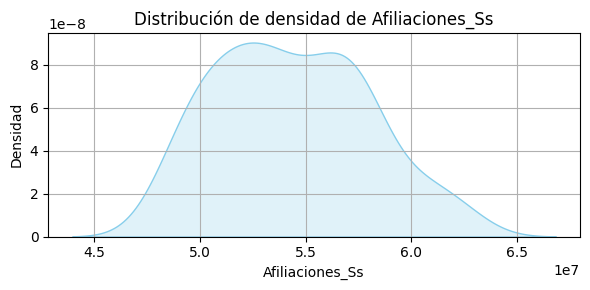

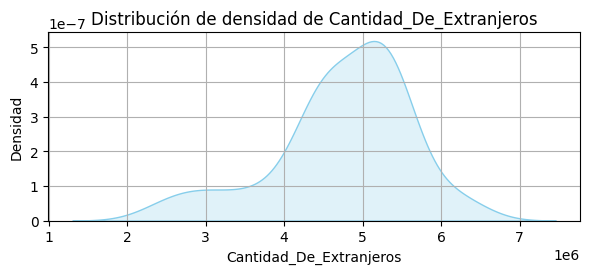

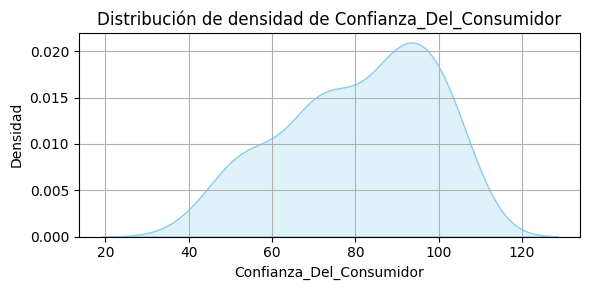

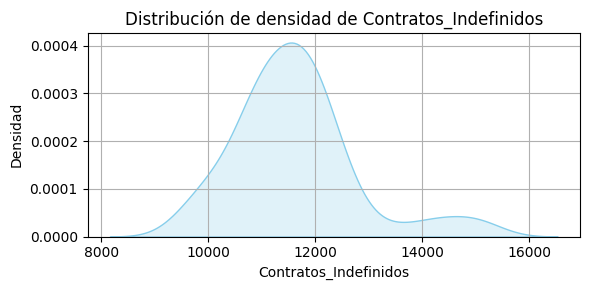

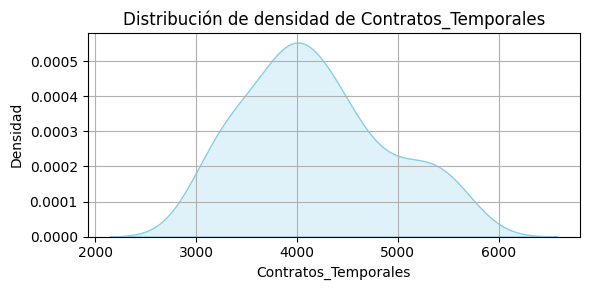

...

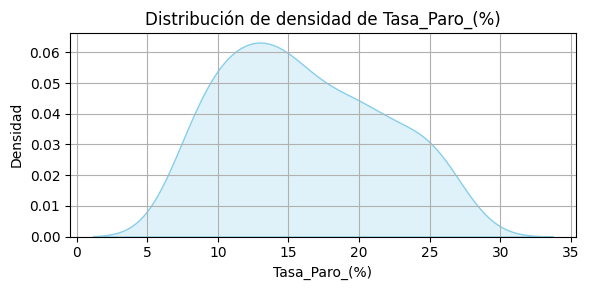

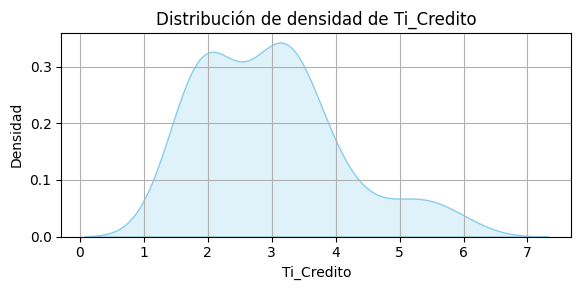

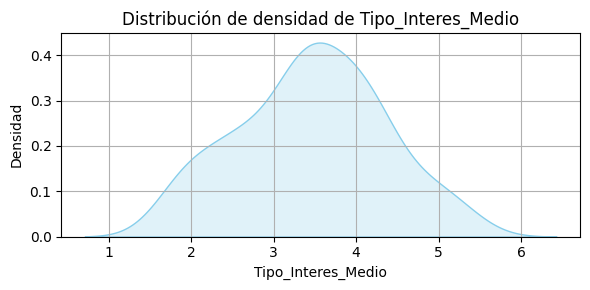

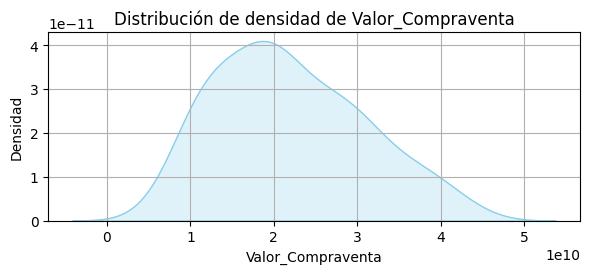

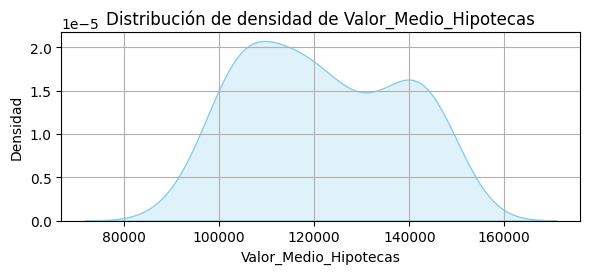

In [7]:
cols = df_clean.columns.difference(['Fecha'])

for col in cols:
    plt.figure(figsize=(6, 3))
    sns.kdeplot(df_clean[col].dropna(), fill=True, color='skyblue')
    plt.title(f'Distribución de densidad de {col}', fontsize=12)
    plt.xlabel(col)
    plt.ylabel('Densidad')
    plt.grid(True)
    plt.tight_layout()


## Tests de Normalidad

Realizamos distintos test de normalidad para comprobar si nuestras variables siguen o no una distribución normal. 
Los test seleccionados son Shapiro-Whilk, D'Agostino K2 y Anderson-Darling.

In [8]:
def analizar_normalidad(df, excluir=['Fecha']):
    cols = df.select_dtypes(include=['float64', 'int64']).columns.difference(excluir)
    
    for col in cols:
        data = df[col].dropna()
        print(f"\n📊 Variable: {col}")
        
        if len(data) < 5000:
            stat_sw, p_sw = stats.shapiro(data)
            resultado_sw = "✅ Normal" if p_sw >= 0.05 else "❌ No normal"
            print(f" Shapiro-Wilk:    stat = {stat_sw:.4f}, p = {p_sw:.4f} → {resultado_sw}")
        else:
            print(" Shapiro-Wilk:    no aplicable (n > 5000)")

        stat_dag, p_dag = stats.normaltest(data)
        resultado_dag = "✅ Normal" if p_dag >= 0.05 else "❌ No normal"
        print(f" D’Agostino K²:   stat = {stat_dag:.4f}, p = {p_dag:.4f} → {resultado_dag}")

        ad_result = stats.anderson(data, dist='norm')
        print(f" Anderson-Darling: stat = {ad_result.statistic:.4f}")
        for i in range(len(ad_result.critical_values)):
            sl = ad_result.significance_level[i]
            cv = ad_result.critical_values[i]
            resultado = "✅ Normal" if ad_result.statistic < cv else "❌ No normal"
            print(f"   ↳ {sl}%: CV={cv:.3f} → {resultado}")

        fig, axs = plt.subplots(1, 2, figsize=(12, 4))
        sns.histplot(data, kde=True, ax=axs[0], color='skyblue')
        axs[0].set_title(f"Histograma de {col}")

        sm.qqplot(data, line='s', ax=axs[1])
        axs[1].set_title(f"Q-Q plot de {col}")
        
        plt.tight_layout()
        plt.show()



📊 Variable: Afiliaciones_Ss
 Shapiro-Wilk:    stat = 0.9692, p = 0.0416 → ❌ No normal
 D’Agostino K²:   stat = 4.6065, p = 0.0999 → ✅ Normal
 Anderson-Darling: stat = 0.6138
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ✅ Normal
   ↳ 5.0%: CV=0.754 → ✅ Normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


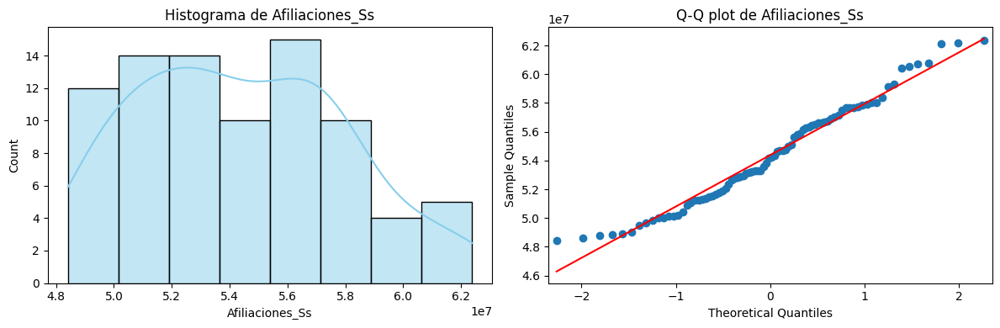


📊 Variable: Cantidad_De_Extranjeros
 Shapiro-Wilk:    stat = 0.9280, p = 0.0002 → ❌ No normal
 D’Agostino K²:   stat = 11.3886, p = 0.0034 → ❌ No normal
 Anderson-Darling: stat = 2.1677
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


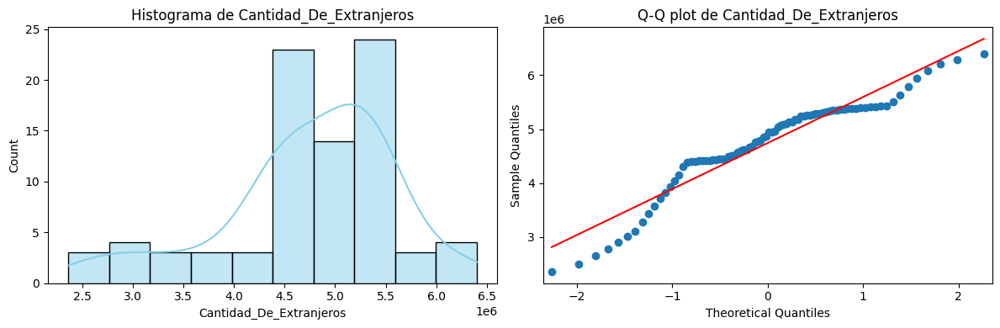


📊 Variable: Confianza_Del_Consumidor
 Shapiro-Wilk:    stat = 0.9475, p = 0.0018 → ❌ No normal
 D’Agostino K²:   stat = 9.4936, p = 0.0087 → ❌ No normal
 Anderson-Darling: stat = 1.3104
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


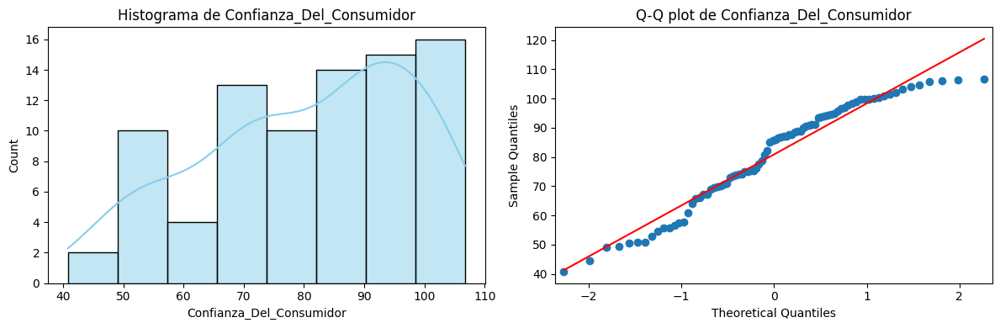


📊 Variable: Contratos_Indefinidos
 Shapiro-Wilk:    stat = 0.9144, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 20.1058, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 1.9151
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


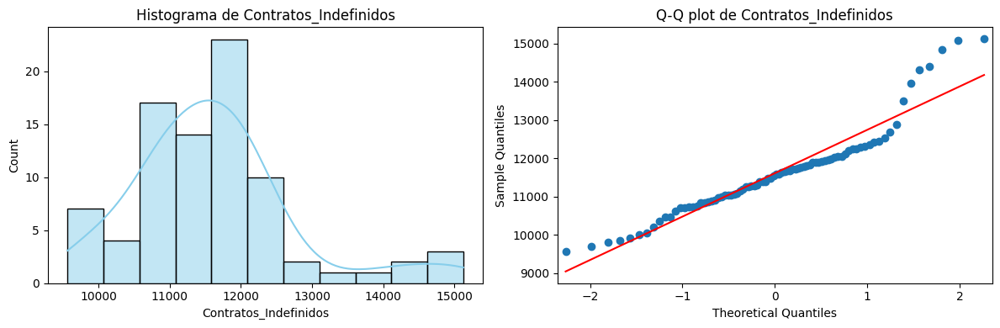


📊 Variable: Contratos_Temporales
 Shapiro-Wilk:    stat = 0.9616, p = 0.0133 → ❌ No normal
 D’Agostino K²:   stat = 4.7185, p = 0.0945 → ✅ Normal
 Anderson-Darling: stat = 0.8481
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


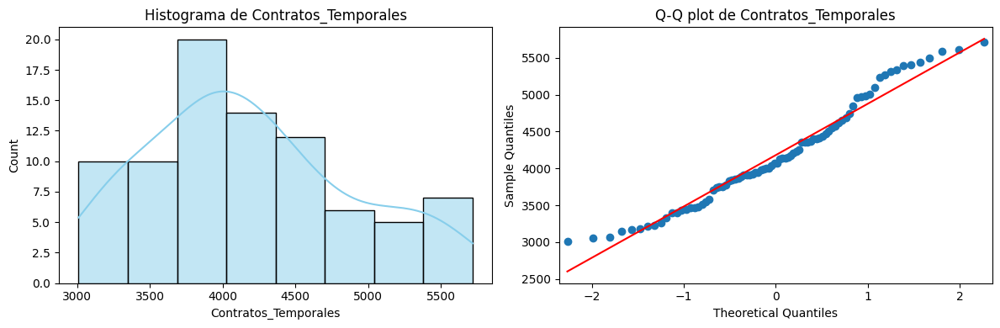


📊 Variable: Duracion_Media_Hipoteca
 Shapiro-Wilk:    stat = 0.8373, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 20.5230, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 5.0666
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


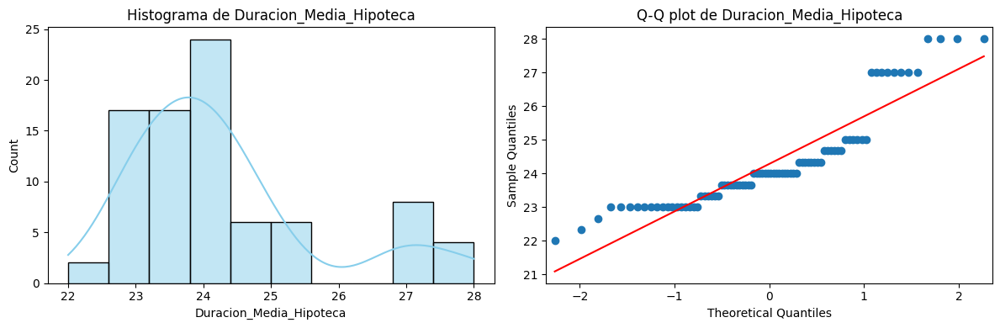


📊 Variable: Euribor_12_Meses
 Shapiro-Wilk:    stat = 0.9059, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 8.7243, p = 0.0128 → ❌ No normal
 Anderson-Darling: stat = 2.5377
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


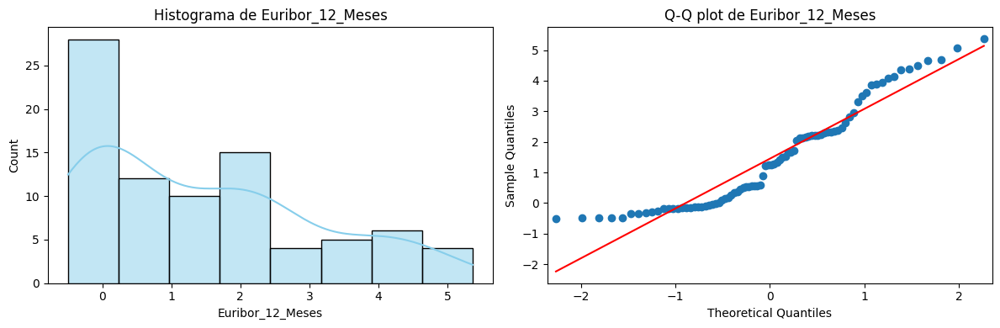


📊 Variable: Importe_Hipotecas
 Shapiro-Wilk:    stat = 0.8520, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 14.8712, p = 0.0006 → ❌ No normal
 Anderson-Darling: stat = 4.4197
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


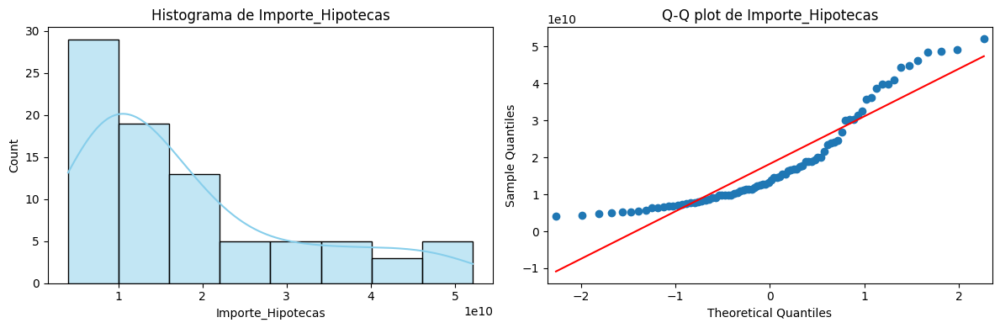


📊 Variable: Interes_Fijo_Hipotecas
 Shapiro-Wilk:    stat = 0.9261, p = 0.0001 → ❌ No normal
 D’Agostino K²:   stat = 23.0493, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 2.0486
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


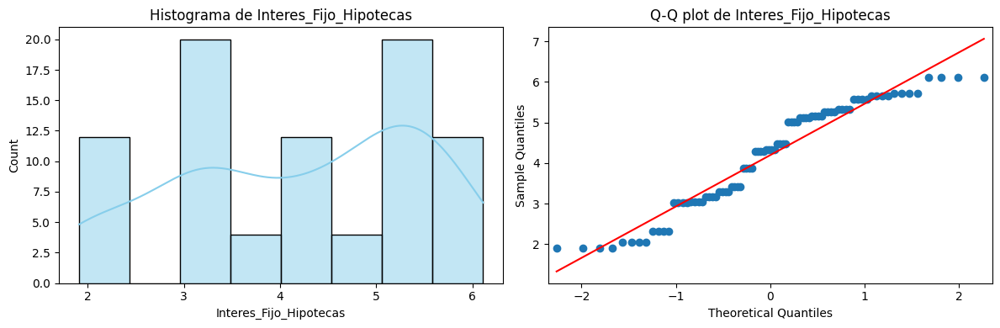


📊 Variable: Interes_Variable_Hipotecas
 Shapiro-Wilk:    stat = 0.9568, p = 0.0066 → ❌ No normal
 D’Agostino K²:   stat = 6.5733, p = 0.0374 → ❌ No normal
 Anderson-Darling: stat = 0.9976
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


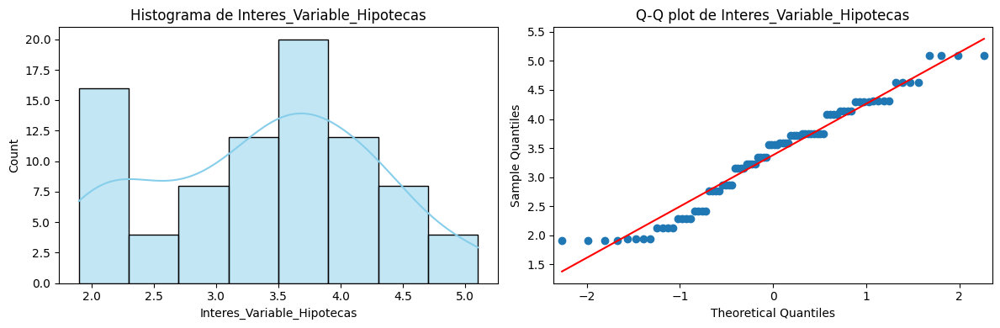


📊 Variable: Ipc_%_Variación_Anual
 Shapiro-Wilk:    stat = 0.9283, p = 0.0002 → ❌ No normal
 D’Agostino K²:   stat = 17.8637, p = 0.0001 → ❌ No normal
 Anderson-Darling: stat = 1.1989
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


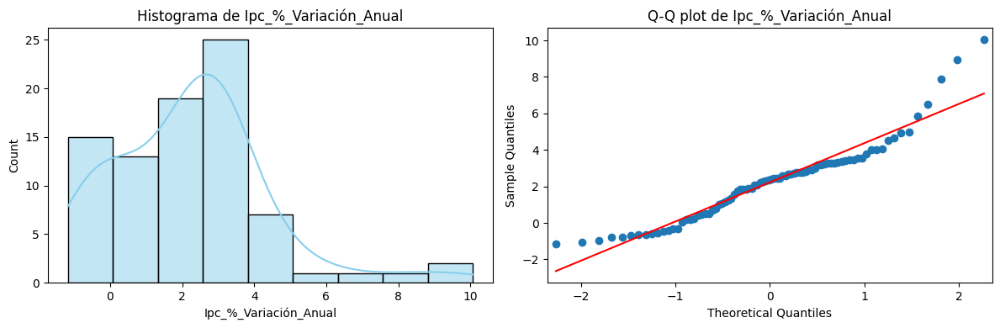


📊 Variable: Ipi_Variacion_Anual_Corregida
 Shapiro-Wilk:    stat = 0.7533, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 27.8272, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 6.5532
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


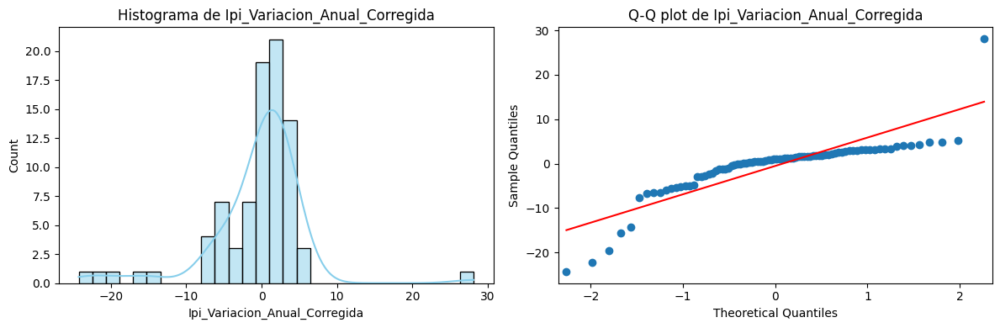


📊 Variable: Ipi_Variacion_Anual_Original
 Shapiro-Wilk:    stat = 0.7764, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 25.2078, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 5.6820
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


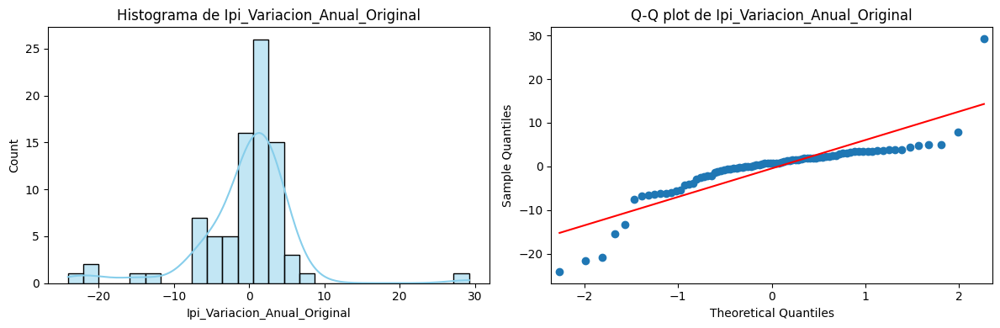


📊 Variable: Mro_Rate
 Shapiro-Wilk:    stat = 0.7699, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 132.3652, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 8.2035
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


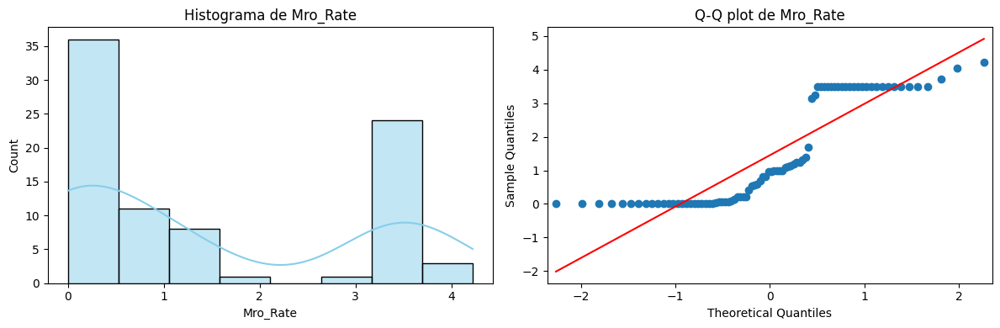


📊 Variable: Numero_Compraventas
 Shapiro-Wilk:    stat = 0.9673, p = 0.0310 → ❌ No normal
 D’Agostino K²:   stat = 5.6084, p = 0.0606 → ✅ Normal
 Anderson-Darling: stat = 0.6258
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ✅ Normal
   ↳ 5.0%: CV=0.754 → ✅ Normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


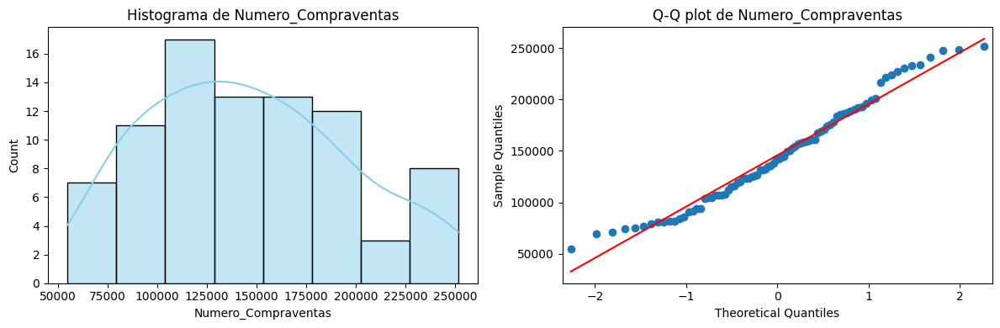


📊 Variable: Numero_Hipotecas
 Shapiro-Wilk:    stat = 0.8384, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 12.2933, p = 0.0021 → ❌ No normal
 Anderson-Darling: stat = 5.5238
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


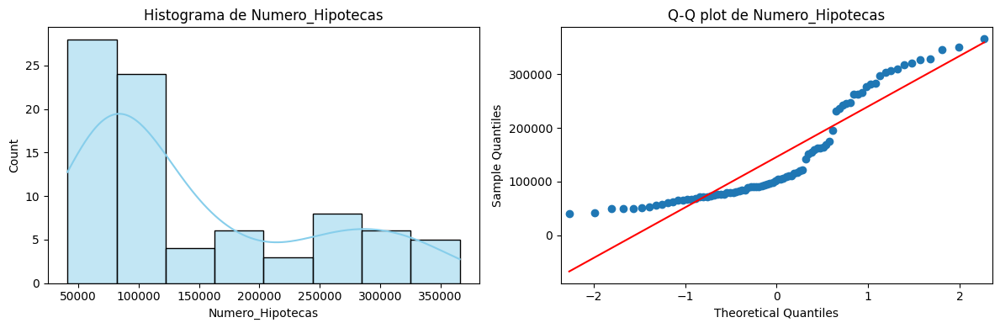


📊 Variable: Pib_Trimestral_Ajustado
 Shapiro-Wilk:    stat = 0.9548, p = 0.0050 → ❌ No normal
 D’Agostino K²:   stat = 5.9138, p = 0.0520 → ✅ Normal
 Anderson-Darling: stat = 1.4224
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


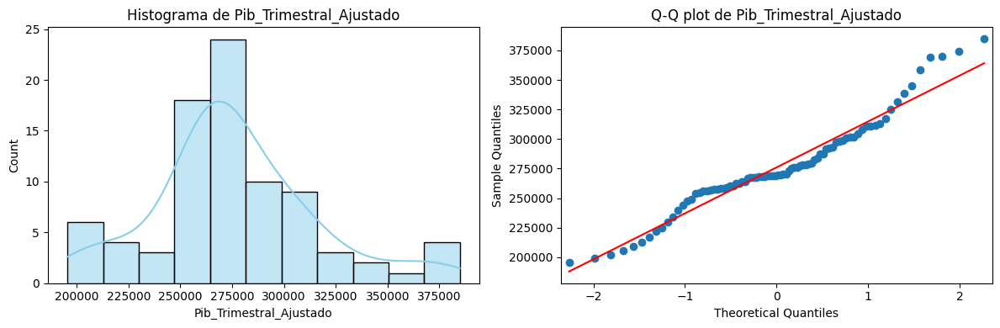


📊 Variable: Pib_Trimestral_No_Ajustado
 Shapiro-Wilk:    stat = 0.9631, p = 0.0166 → ❌ No normal
 D’Agostino K²:   stat = 6.5796, p = 0.0373 → ❌ No normal
 Anderson-Darling: stat = 1.1242
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


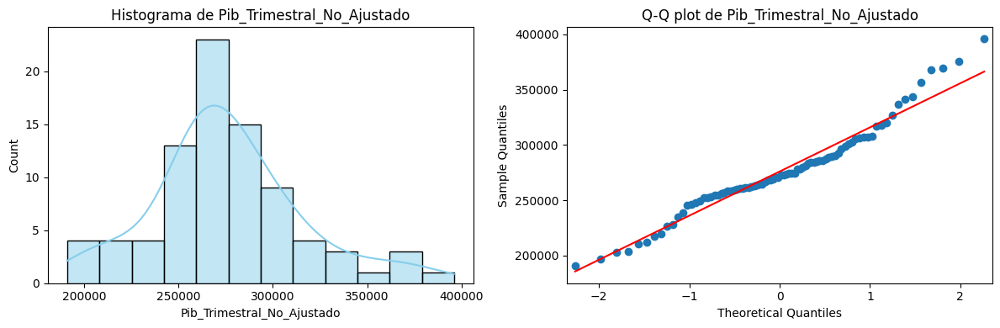


📊 Variable: Poblacion
 Shapiro-Wilk:    stat = 0.8459, p = 0.0000 → ❌ No normal
 D’Agostino K²:   stat = 17.5962, p = 0.0002 → ❌ No normal
 Anderson-Darling: stat = 5.6426
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


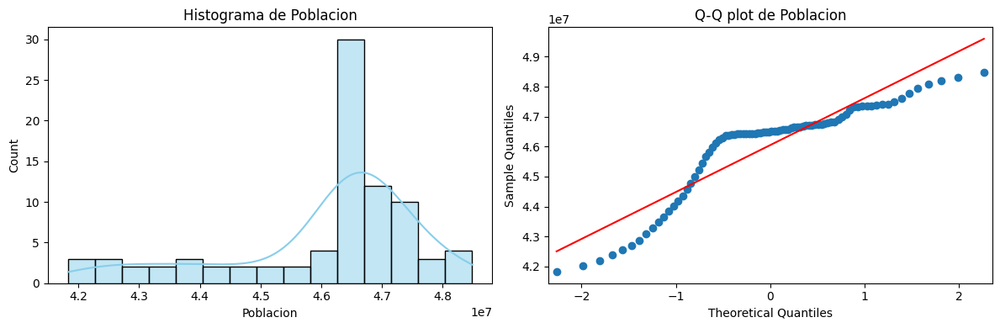


📊 Variable: Precio_M2_Vivienda
 Shapiro-Wilk:    stat = 0.9668, p = 0.0290 → ❌ No normal
 D’Agostino K²:   stat = 3.3462, p = 0.1877 → ✅ Normal
 Anderson-Darling: stat = 0.9461
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


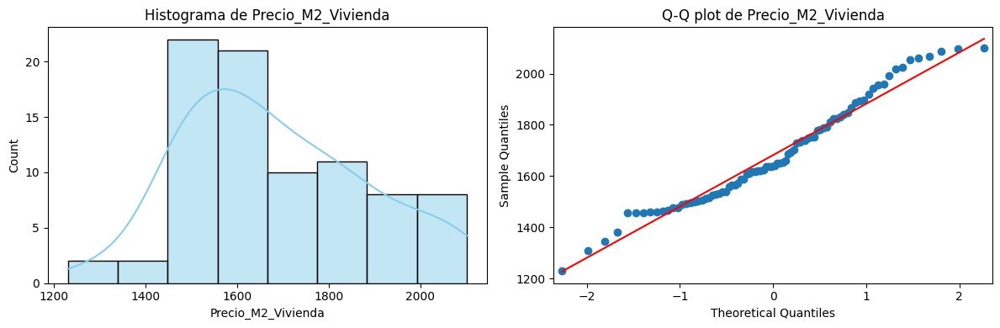


📊 Variable: Renta_Disponible_Bruta
 Shapiro-Wilk:    stat = 0.9758, p = 0.1142 → ✅ Normal
 D’Agostino K²:   stat = 5.5239, p = 0.0632 → ✅ Normal
 Anderson-Darling: stat = 0.5089
   ↳ 15.0%: CV=0.552 → ✅ Normal
   ↳ 10.0%: CV=0.628 → ✅ Normal
   ↳ 5.0%: CV=0.754 → ✅ Normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


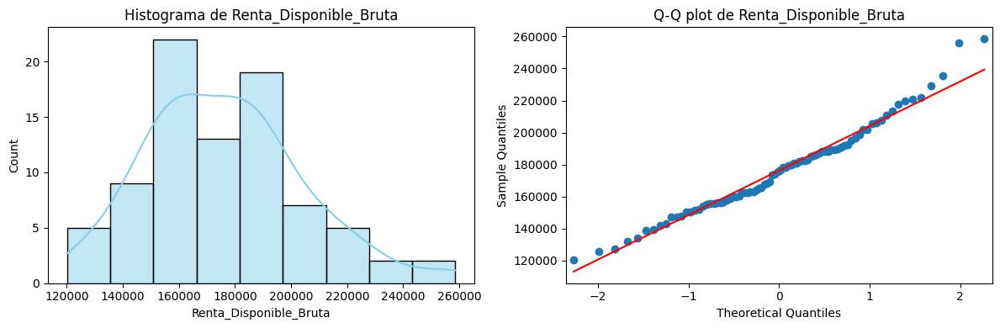


📊 Variable: Tasa_Paro_(%)
 Shapiro-Wilk:    stat = 0.9496, p = 0.0024 → ❌ No normal
 D’Agostino K²:   stat = 13.7425, p = 0.0010 → ❌ No normal
 Anderson-Darling: stat = 1.0592
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


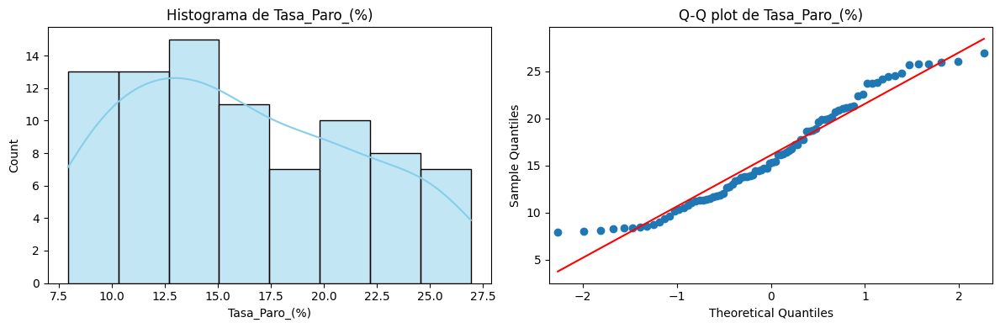


📊 Variable: Ti_Credito
 Shapiro-Wilk:    stat = 0.9276, p = 0.0002 → ❌ No normal
 D’Agostino K²:   stat = 9.2012, p = 0.0100 → ❌ No normal
 Anderson-Darling: stat = 1.6215
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


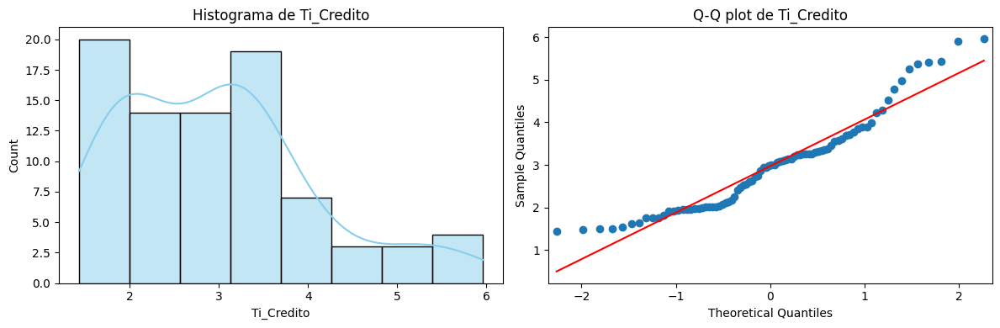


📊 Variable: Tipo_Interes_Medio
 Shapiro-Wilk:    stat = 0.9793, p = 0.1956 → ✅ Normal
 D’Agostino K²:   stat = 1.6279, p = 0.4431 → ✅ Normal
 Anderson-Darling: stat = 0.3950
   ↳ 15.0%: CV=0.552 → ✅ Normal
   ↳ 10.0%: CV=0.628 → ✅ Normal
   ↳ 5.0%: CV=0.754 → ✅ Normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


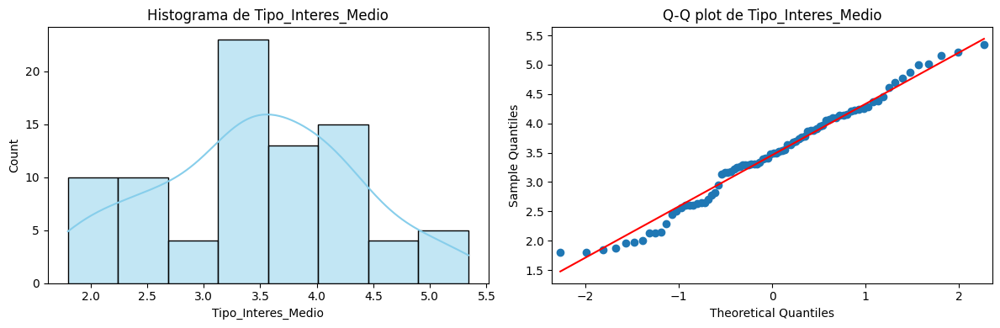


📊 Variable: Valor_Compraventa
 Shapiro-Wilk:    stat = 0.9652, p = 0.0226 → ❌ No normal
 D’Agostino K²:   stat = 4.8899, p = 0.0867 → ✅ Normal
 Anderson-Darling: stat = 0.7692
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ✅ Normal
   ↳ 1.0%: CV=1.046 → ✅ Normal


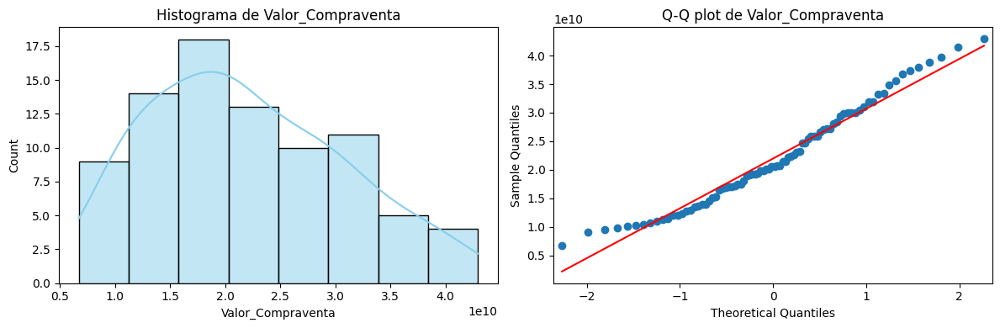


📊 Variable: Valor_Medio_Hipotecas
 Shapiro-Wilk:    stat = 0.9479, p = 0.0019 → ❌ No normal
 D’Agostino K²:   stat = 28.9625, p = 0.0000 → ❌ No normal
 Anderson-Darling: stat = 1.4044
   ↳ 15.0%: CV=0.552 → ❌ No normal
   ↳ 10.0%: CV=0.628 → ❌ No normal
   ↳ 5.0%: CV=0.754 → ❌ No normal
   ↳ 2.5%: CV=0.879 → ❌ No normal
   ↳ 1.0%: CV=1.046 → ❌ No normal


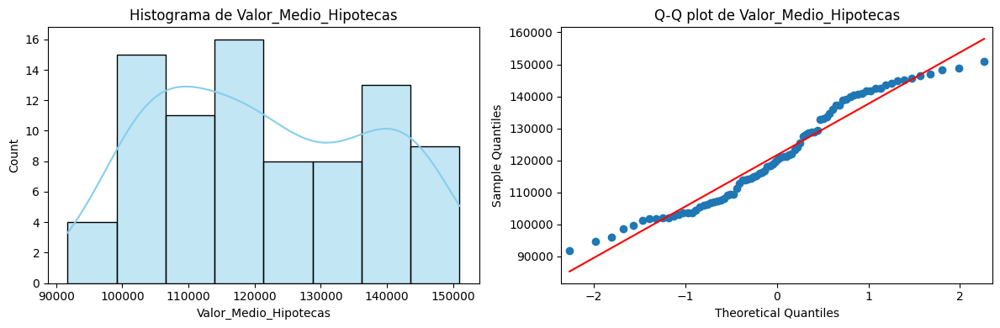

In [9]:
analizar_normalidad(df_clean)

A continuación, teniendo en cuenta los resultados anteriores vamos a realizar una clasificación de todas nuestras variables (a excepción de la Fecha) en tres grupos: variables normales, aproximadamente normales y no normales. Los criterios son:
* **Variables normales:**

Shapiro-Wilk (si aplica) y D’Agostino con p ≥ 0.05

y Anderson-Darling no supera el nivel crítico del 5%

* **Variables aproximadamente normales: criterios más laxos para considerar normalidad**

Aprueba al menos un test de Shapiro, D’Agostino o Anderson(10% o 15%)

O solo falla ligeramente en Shapiro o D’Agostino (0.01 ≤ p < 0.05)

O Anderson falla en 5% pero pasa 10% o 15%

* **Variables no normales:**

Falla más de 1 test o Anderson supera todos los niveles críticos

In [10]:
from scipy import stats

def clasificar_normalidad(df, excluir=['Fecha']):
    normales = []
    aprox_normales = []
    no_normales = []
    
    cols = df.select_dtypes(include=['float64', 'int64']).columns.difference(excluir)
    
    for col in cols:
        data = df[col].dropna()
        n = len(data)

        # --- Shapiro ---
        if n < 5000:
            stat_sw, p_sw = stats.shapiro(data)
        else:
            p_sw = None  # No aplicable

        # --- D’Agostino ---
        stat_dag, p_dag = stats.normaltest(data)

        # --- Anderson ---
        ad_result = stats.anderson(data, dist='norm')
        ad_stat = ad_result.statistic
        ad_levels = {float(level): cv for level, cv in zip(ad_result.significance_level, ad_result.critical_values)}

        # Comprobación Anderson en niveles 15% y 10%
        anderson_15 = ad_stat < ad_levels.get(15.0, float('inf'))
        anderson_10 = ad_stat < ad_levels.get(10.0, float('inf'))

        # Variables normales: todos pasan (Shapiro p≥0.05, D’Agostino p≥0.05 y Anderson 5%)
        pasa_shapiro = (p_sw is None) or (p_sw >= 0.05)
        pasa_dagostino = p_dag >= 0.05
        pasa_anderson_5 = ad_stat < ad_levels.get(5.0, float('inf'))

        if pasa_shapiro and pasa_dagostino and pasa_anderson_5:
            normales.append(col)
        else:
            # Variables aproximadamente normales:
            # - Aprueba al menos uno de Shapiro, D’Agostino, Anderson(10% o 15%)
            # - O solo falla ligeramente en Shapiro o D’Agostino (0.01 ≤ p < 0.05)
            # - O Anderson falla en 5% pero pasa 10% o 15%
            aprox_normal = False
            
            if (p_sw is not None and p_sw >= 0.05) or (p_dag >= 0.05) or anderson_10 or anderson_15:
                aprox_normal = True
            elif (p_sw is not None and 0.01 <= p_sw < 0.05) or (0.01 <= p_dag < 0.05):
                aprox_normal = True
            elif (not pasa_anderson_5) and (anderson_10 or anderson_15):
                aprox_normal = True
            
            if aprox_normal:
                aprox_normales.append(col)
            else:
                no_normales.append(col)
        
    return normales, aprox_normales, no_normales

In [11]:
def imprimir_lista_titulo(titulo, lista):
    print(f"\n{'='*40}\n{titulo} (Total: {len(lista)})\n{'='*40}")
    if lista:
        for i, var in enumerate(lista, 1):
            print(f"{i}. {var}")
    else:
        print("Ninguna variable en esta categoría.")

# Clasificación
normales, aprox_normales, no_normales = clasificar_normalidad(df_clean, excluir=['Fecha'])

# Mostrar resultados
imprimir_lista_titulo("Variables normales", normales)
imprimir_lista_titulo("Variables aproximadamente normales", aprox_normales)
imprimir_lista_titulo("Variables no normales", no_normales)



Variables normales (Total: 2)
1. Renta_Disponible_Bruta
2. Tipo_Interes_Medio

Variables aproximadamente normales (Total: 10)
1. Afiliaciones_Ss
2. Contratos_Temporales
3. Euribor_12_Meses
4. Interes_Variable_Hipotecas
5. Numero_Compraventas
6. Pib_Trimestral_Ajustado
7. Pib_Trimestral_No_Ajustado
8. Precio_M2_Vivienda
9. Ti_Credito
10. Valor_Compraventa

Variables no normales (Total: 14)
1. Cantidad_De_Extranjeros
2. Confianza_Del_Consumidor
3. Contratos_Indefinidos
4. Duracion_Media_Hipoteca
5. Importe_Hipotecas
6. Interes_Fijo_Hipotecas
7. Ipc_%_Variación_Anual
8. Ipi_Variacion_Anual_Corregida
9. Ipi_Variacion_Anual_Original
10. Mro_Rate
11. Numero_Hipotecas
12. Poblacion
13. Tasa_Paro_(%)
14. Valor_Medio_Hipotecas


# 3. Análisis temporal

## Evolución temporal y tendencia

El objetivo aquí es ver cómo se comporta la variable a lo largo del período de análisis, es decir, representarla en función del tiempo. Esto nos permite visualizar una evolución general de la misma e identificar caídas o picos más importantes, tendencias generales o patrones estacionales visibles

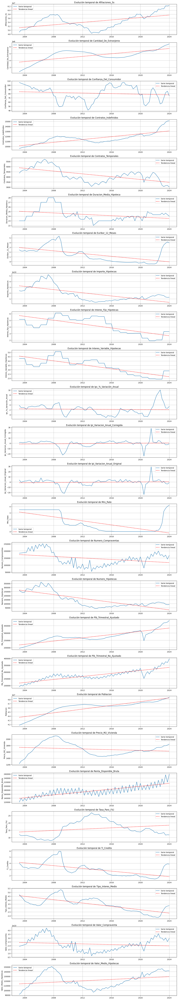

In [12]:
df_clean['Fecha'] = pd.to_datetime(df_clean['Fecha'])
df_clean = df_clean.sort_values('Fecha').reset_index(drop=True)

df_clean['Fecha_ordinal'] = df_clean['Fecha'].map(pd.Timestamp.toordinal)

cols = df_clean.select_dtypes(include=['float64', 'int64']).columns.difference(['Fecha_ordinal'])

plt.figure(figsize=(14, len(cols) * 3))
for i, col in enumerate(cols, 1):
    plt.subplot(len(cols), 1, i)

    sns.lineplot(data=df_clean, x='Fecha', y=col, label='Serie temporal')

    mask = df_clean[col].notnull()
    x = df_clean.loc[mask, 'Fecha_ordinal'].values.reshape(-1, 1)
    y = df_clean.loc[mask, col].astype(float).values

    if len(y) > 1:
        model = LinearRegression()
        model.fit(x, y)
        y_pred = model.predict(x)
        plt.plot(df_clean.loc[mask, 'Fecha'], y_pred, color='red', linestyle='--', label='Tendencia lineal')

    plt.title(f"Evolución temporal de {col}")
    plt.xlabel('')
    plt.ylabel(col)
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

## Descomposición de las series temporales en tendencia, estacionalidad y residuos

A continuación, vamos a descomponer cada una de las series en tres componentes:

* **Serie observada:** es la serie original

* **Tendencia:** es la dirección general a largo plazo de la serie. Ayuda a identificar si la variable crece, decrece o se mantiene estable a largo plazo

* **Estacionalidad:** es el patrón que se repite en intervalos regulares, es decir, el efecto "cíclico" que se repite cada año, cada trimestre, etc

* **Residuo:** es lo que queda después de quitar la tendencia y la estacionalidad, es decir, la “parte aleatoria” o ruido de la serie. Ayuda a detectar anomalías o eventos inesperados. Si los residuos tienen picos grandes, puede indicar crisis económicas, cambios regulatorios o shocks puntuales


--- Descomposición de la serie temporal: Afiliaciones_Ss ---


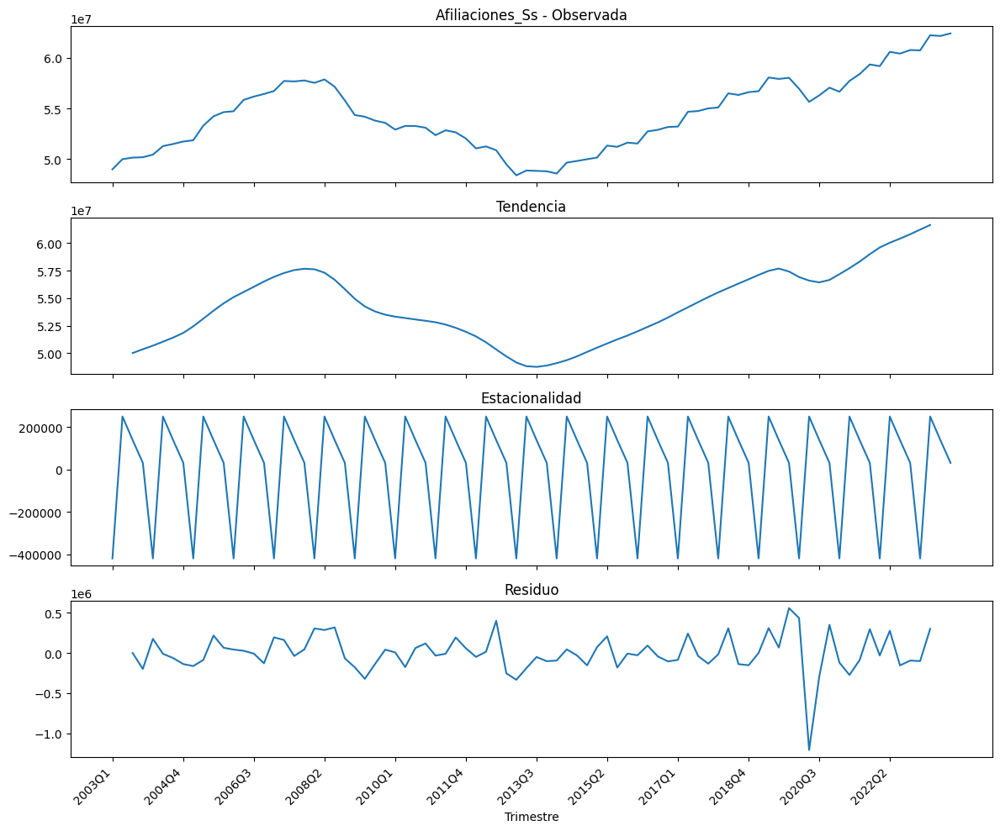


--- Descomposición de la serie temporal: Cantidad_De_Extranjeros ---


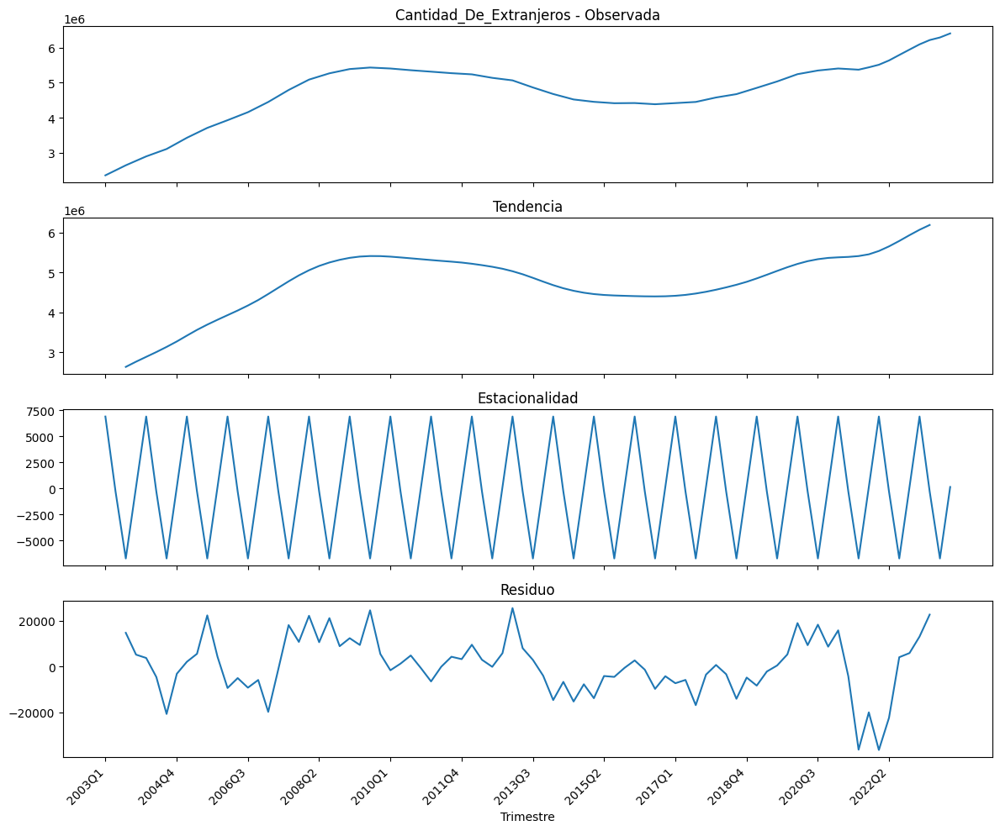


--- Descomposición de la serie temporal: Confianza_Del_Consumidor ---


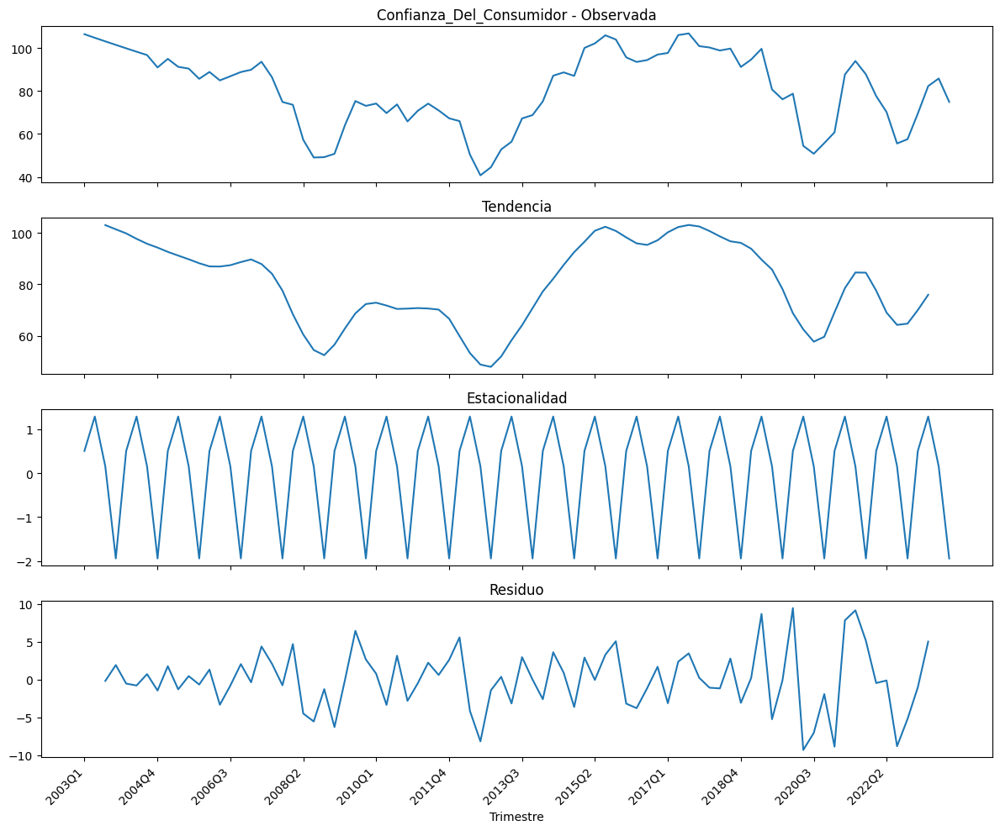


--- Descomposición de la serie temporal: Contratos_Indefinidos ---


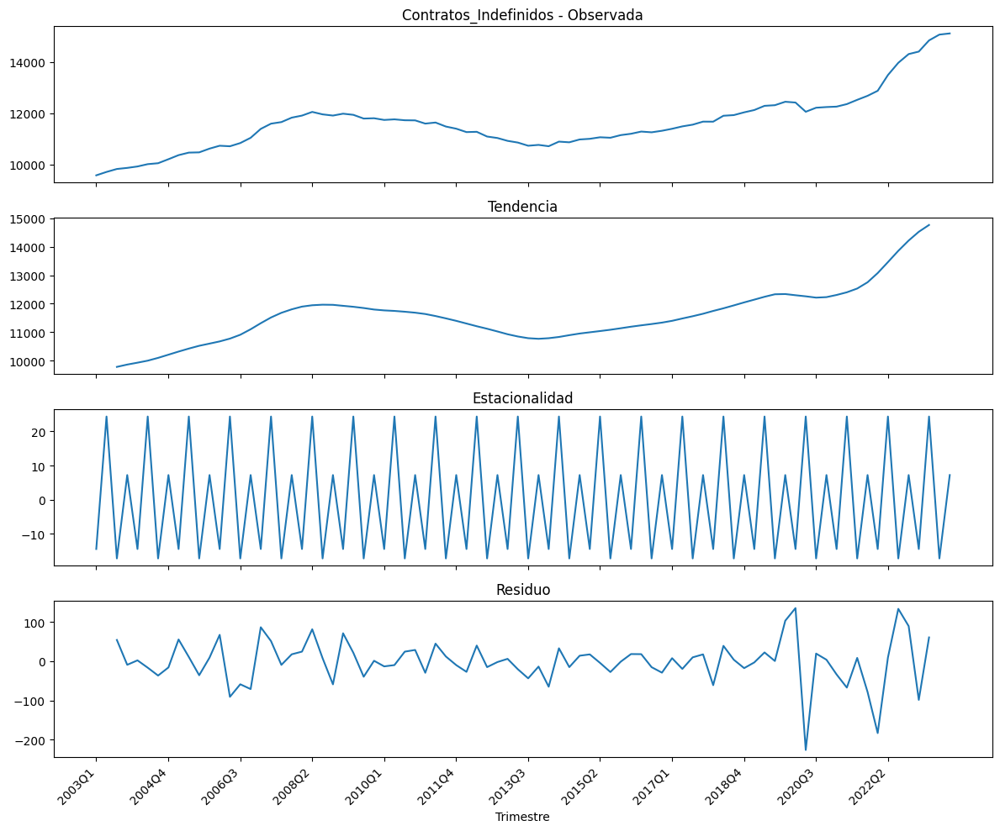


--- Descomposición de la serie temporal: Contratos_Temporales ---


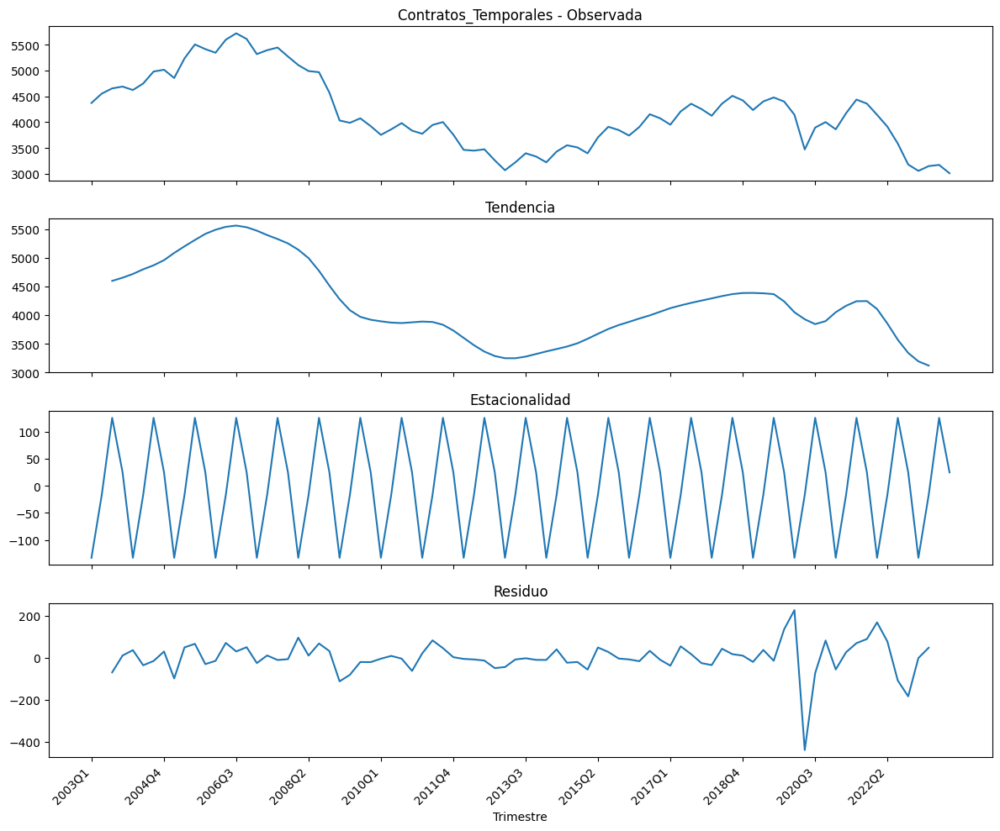


--- Descomposición de la serie temporal: Duracion_Media_Hipoteca ---


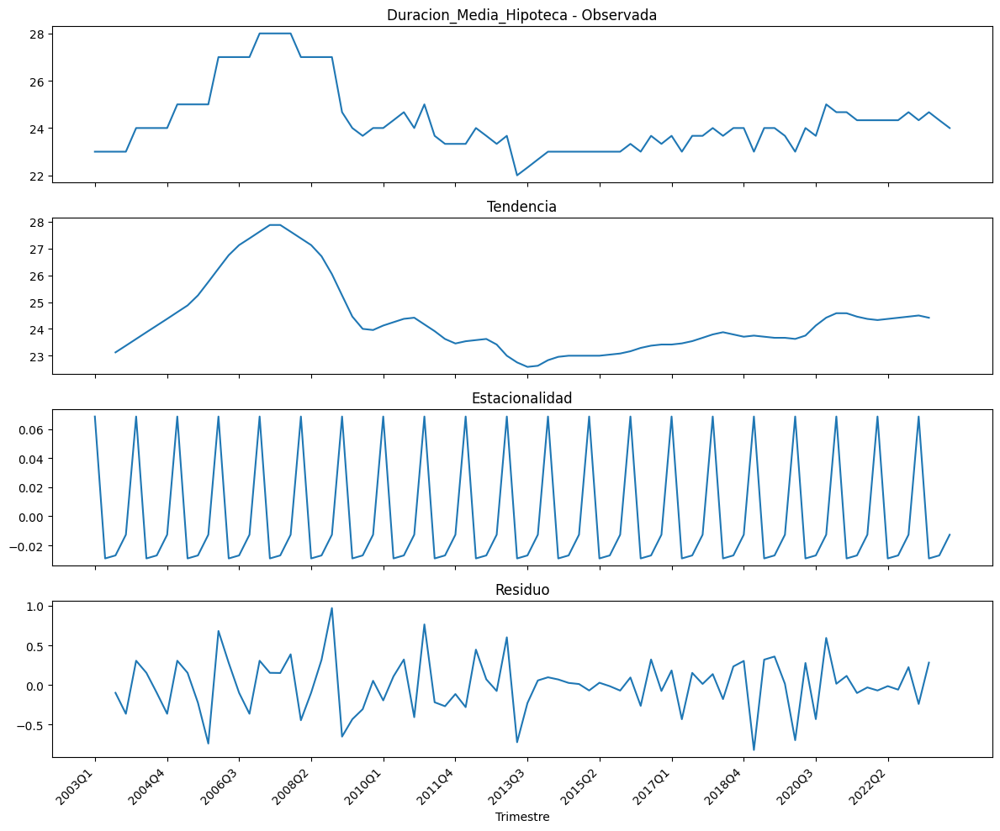


--- Descomposición de la serie temporal: Euribor_12_Meses ---


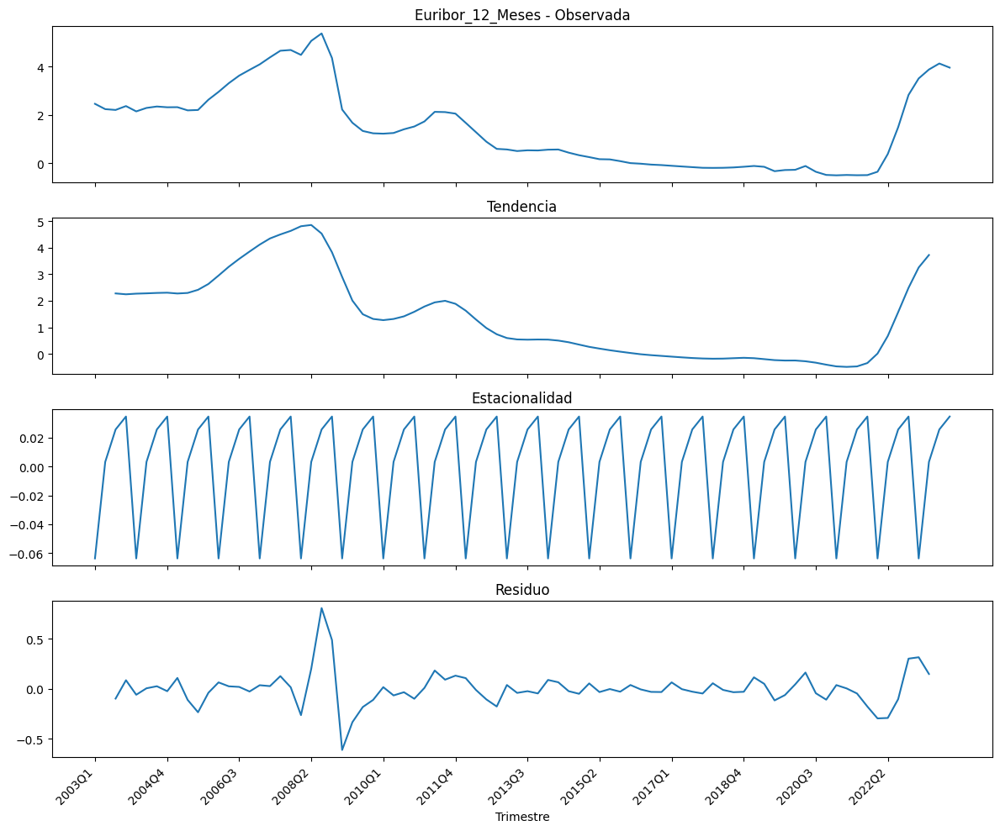


--- Descomposición de la serie temporal: Importe_Hipotecas ---


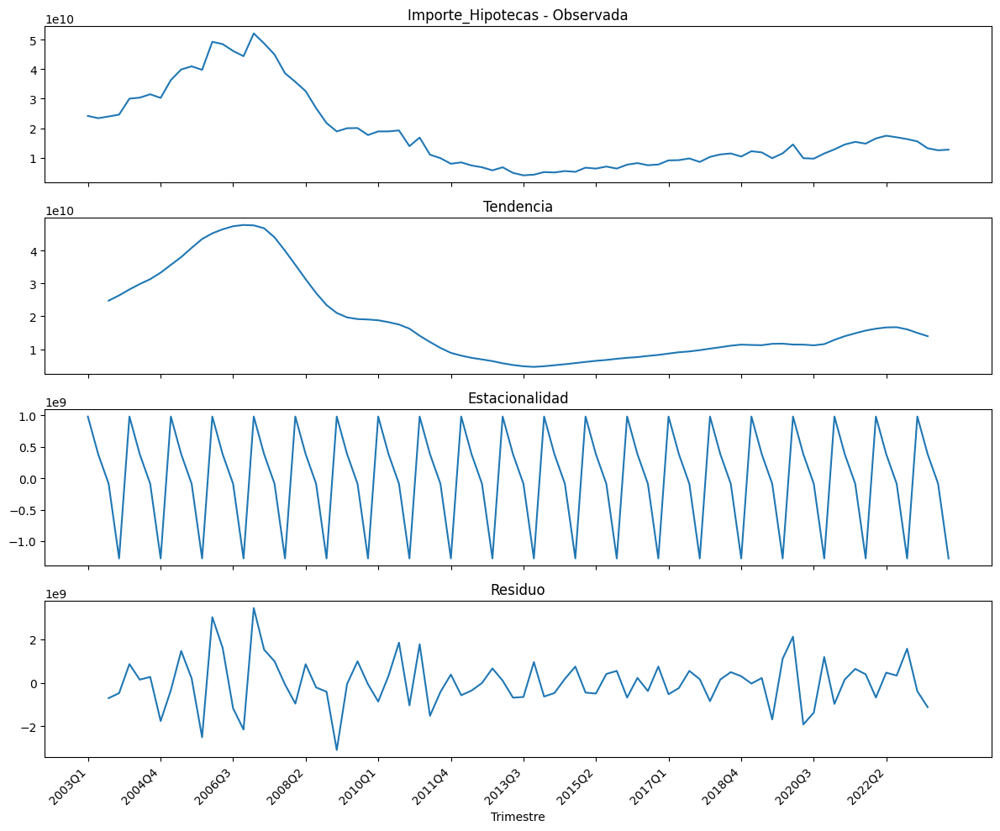


--- Descomposición de la serie temporal: Interes_Fijo_Hipotecas ---


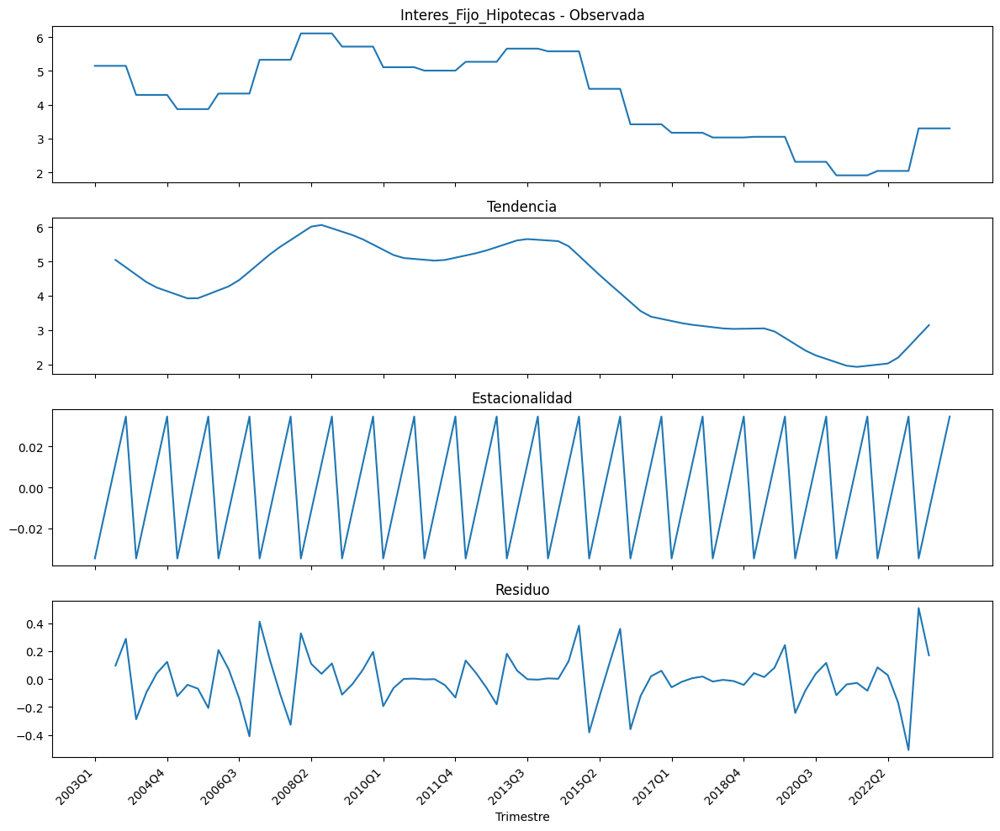


--- Descomposición de la serie temporal: Interes_Variable_Hipotecas ---


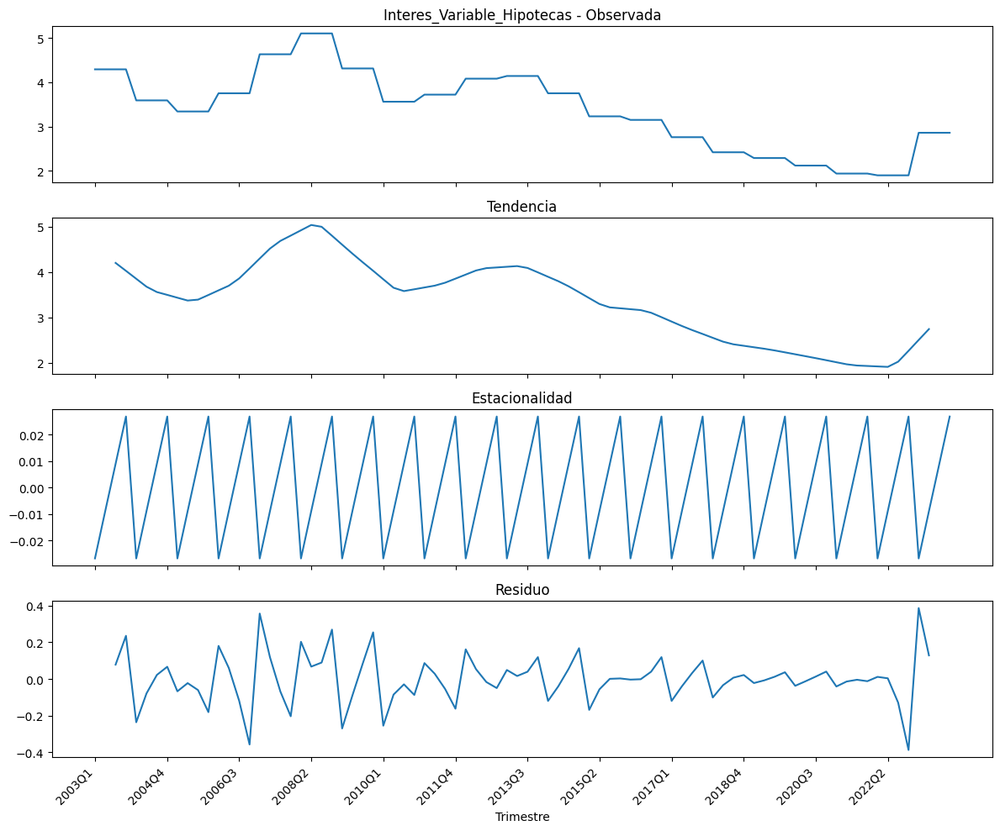


--- Descomposición de la serie temporal: Ipc_%_Variación_Anual ---


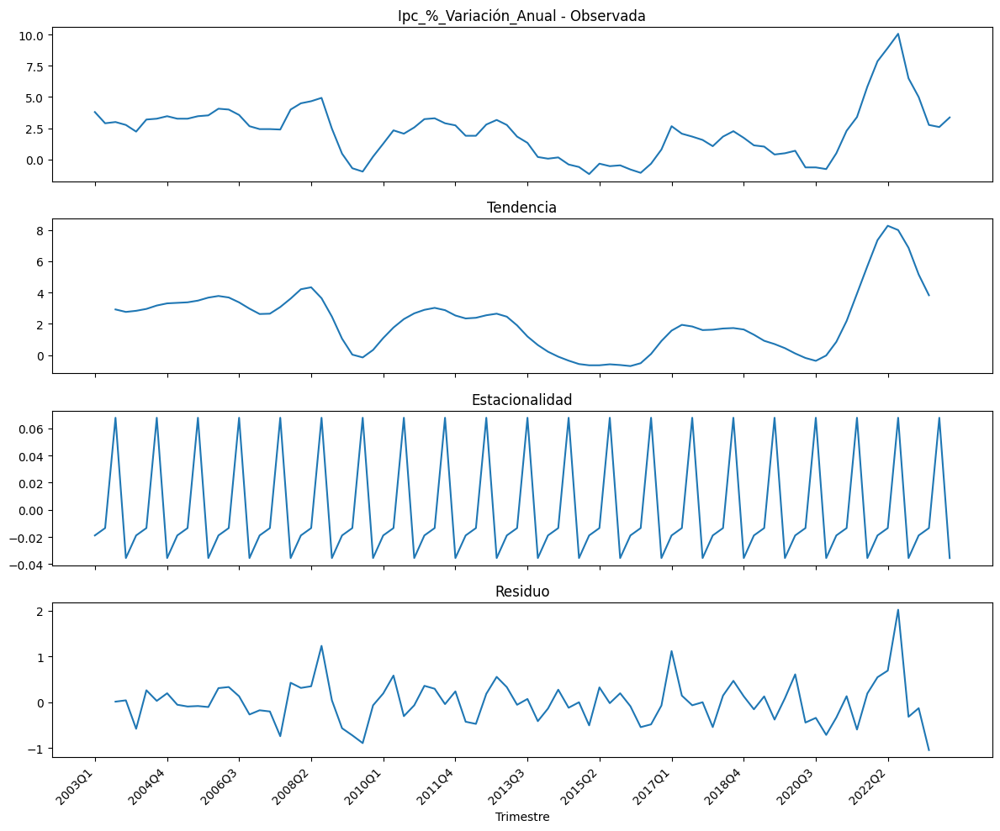


--- Descomposición de la serie temporal: Ipi_Variacion_Anual_Corregida ---


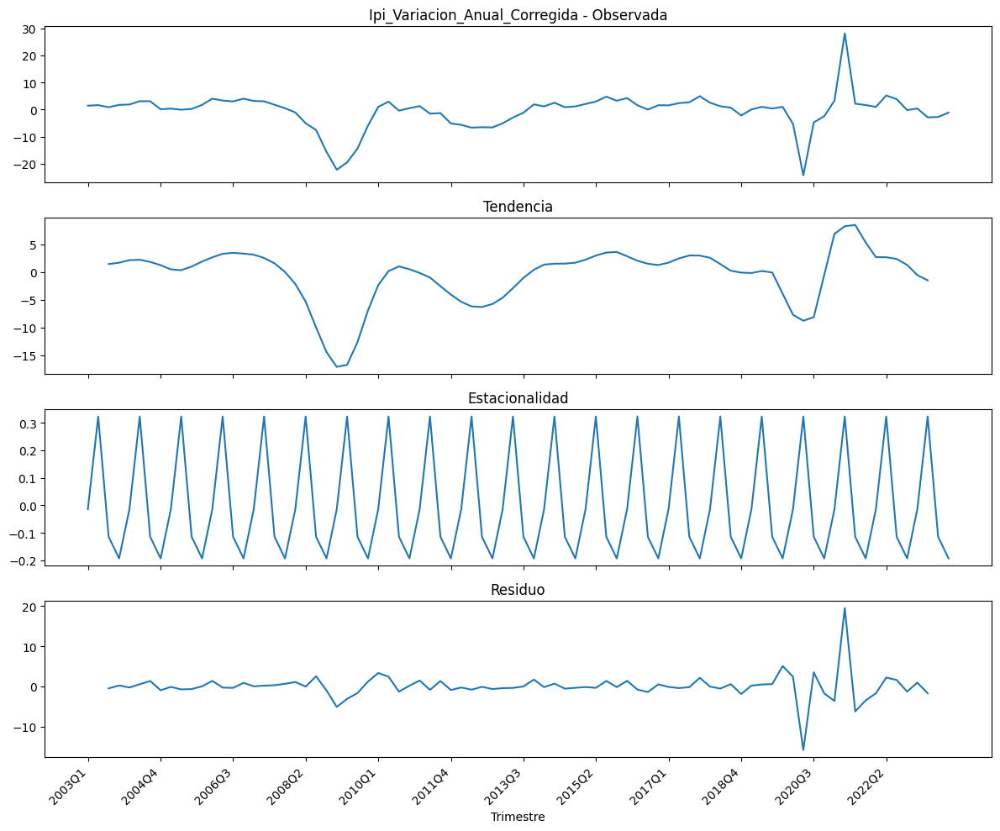


--- Descomposición de la serie temporal: Ipi_Variacion_Anual_Original ---


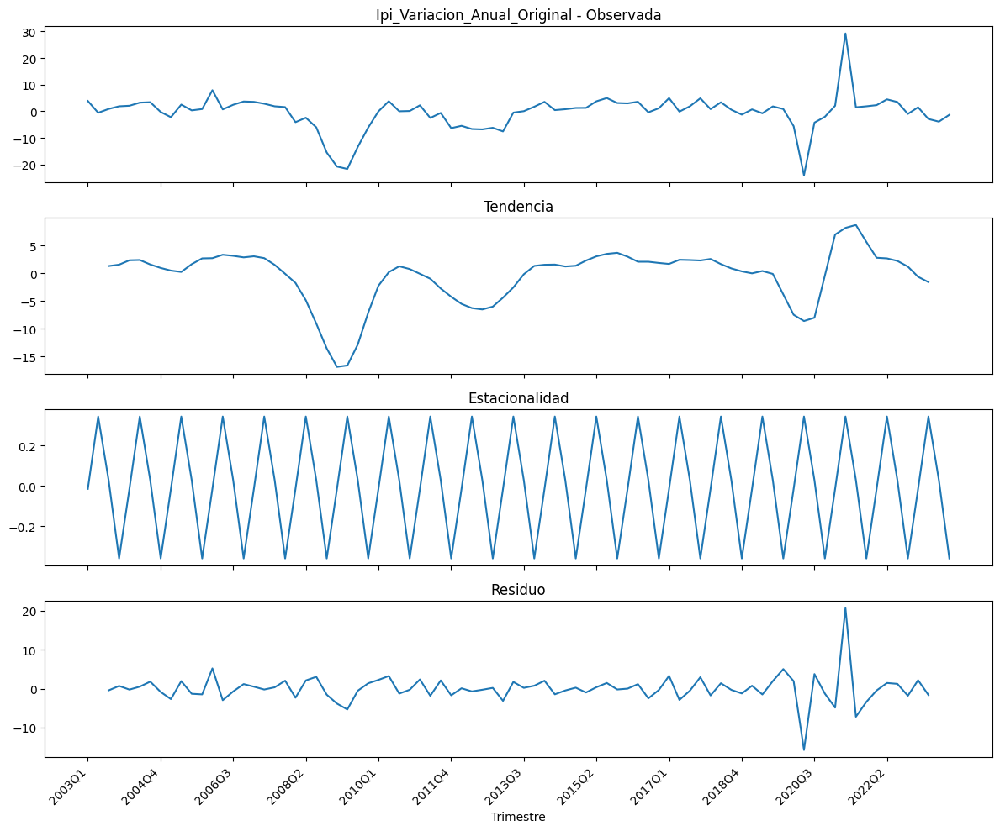


--- Descomposición de la serie temporal: Mro_Rate ---


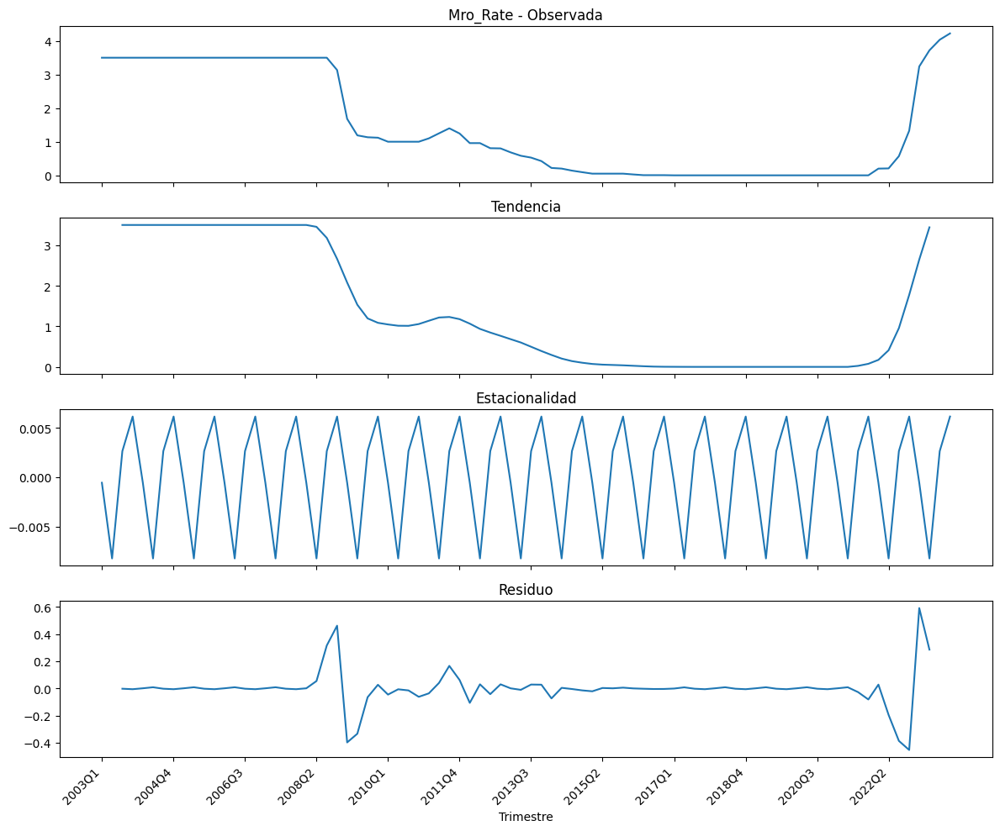


--- Descomposición de la serie temporal: Numero_Compraventas ---


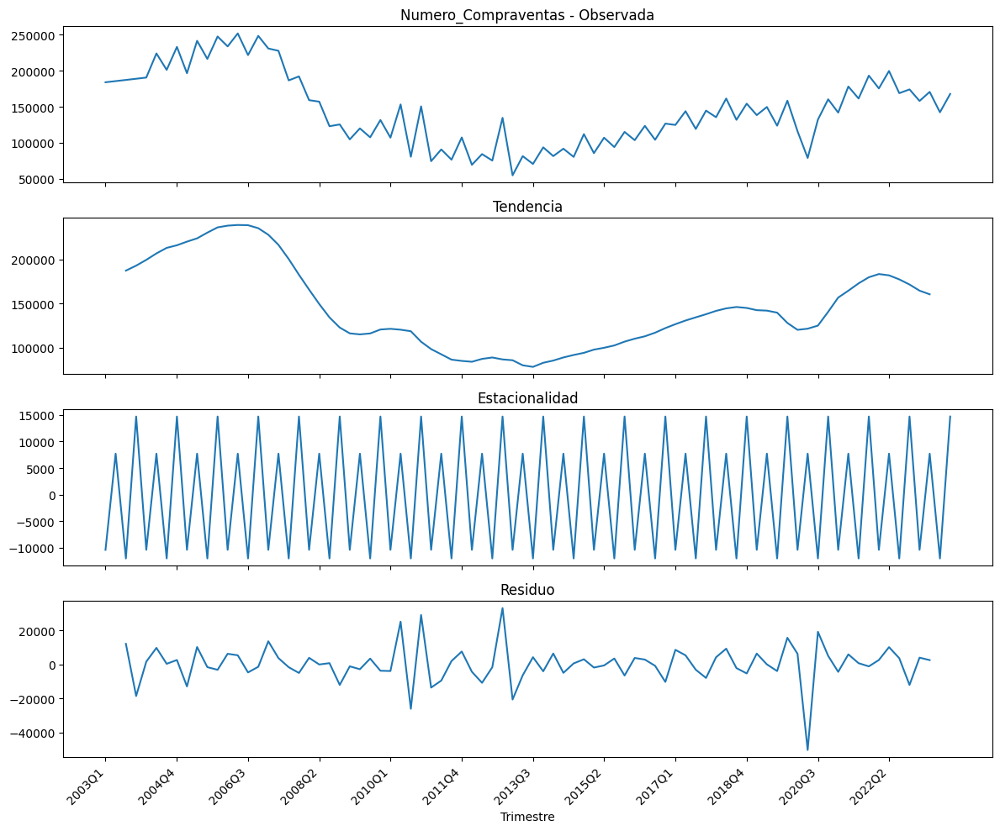


--- Descomposición de la serie temporal: Numero_Hipotecas ---


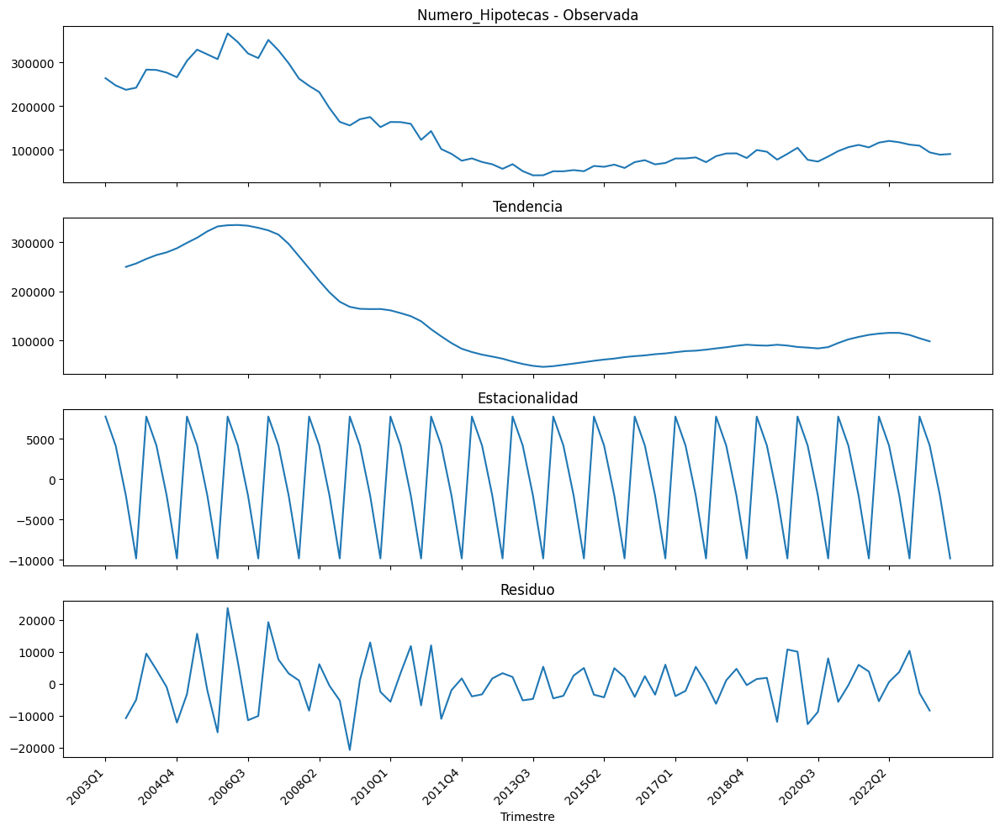


--- Descomposición de la serie temporal: Pib_Trimestral_Ajustado ---


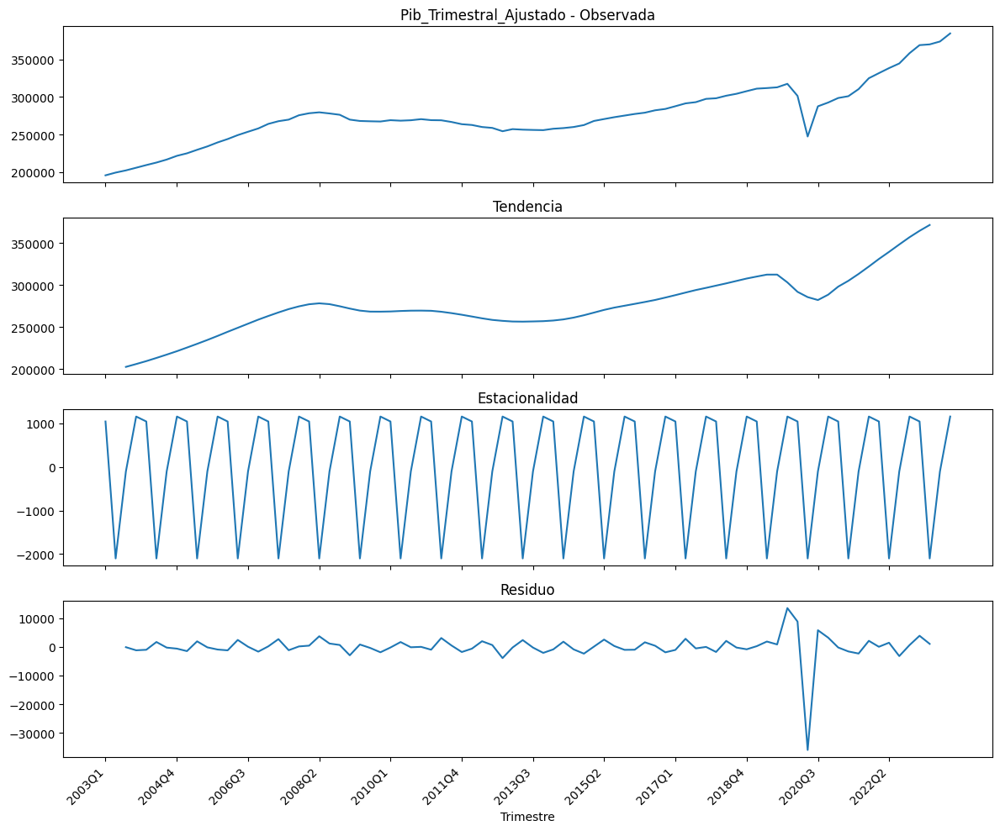


--- Descomposición de la serie temporal: Pib_Trimestral_No_Ajustado ---


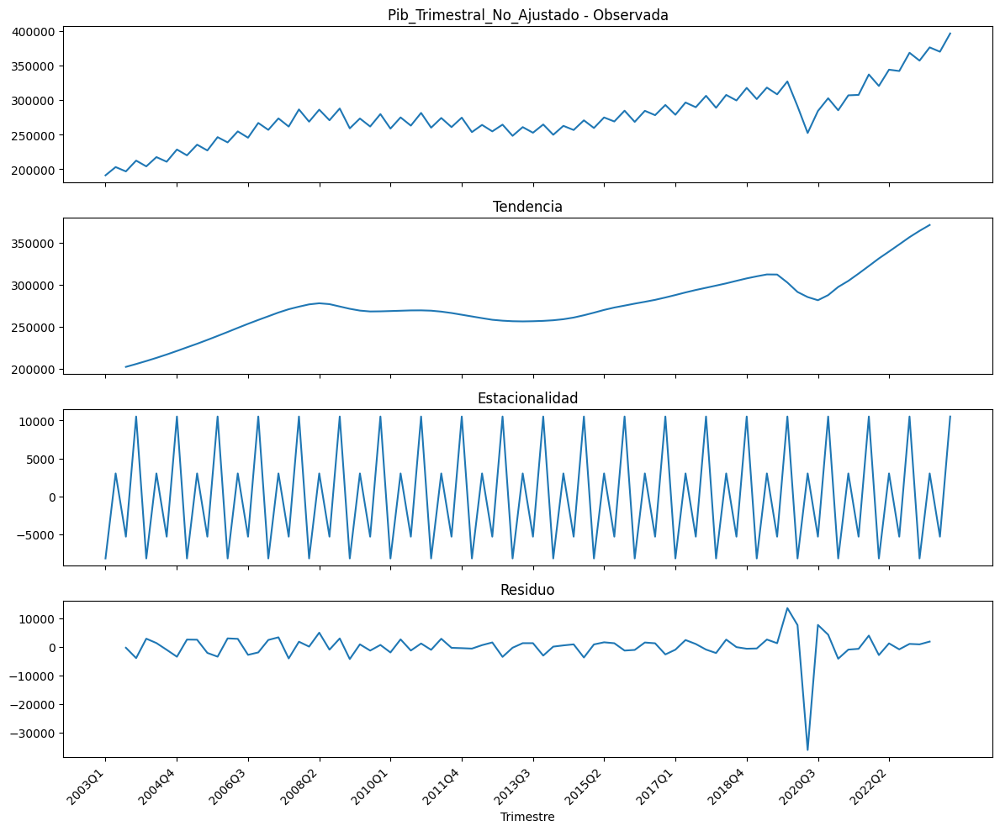


--- Descomposición de la serie temporal: Poblacion ---


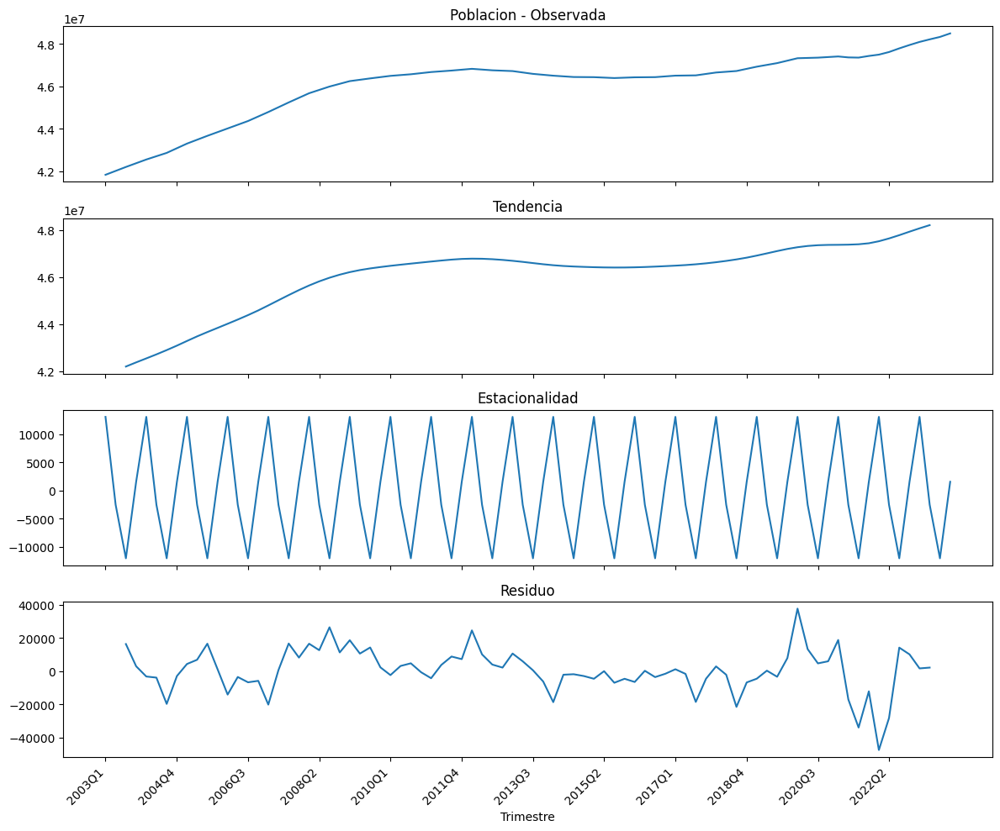


--- Descomposición de la serie temporal: Precio_M2_Vivienda ---


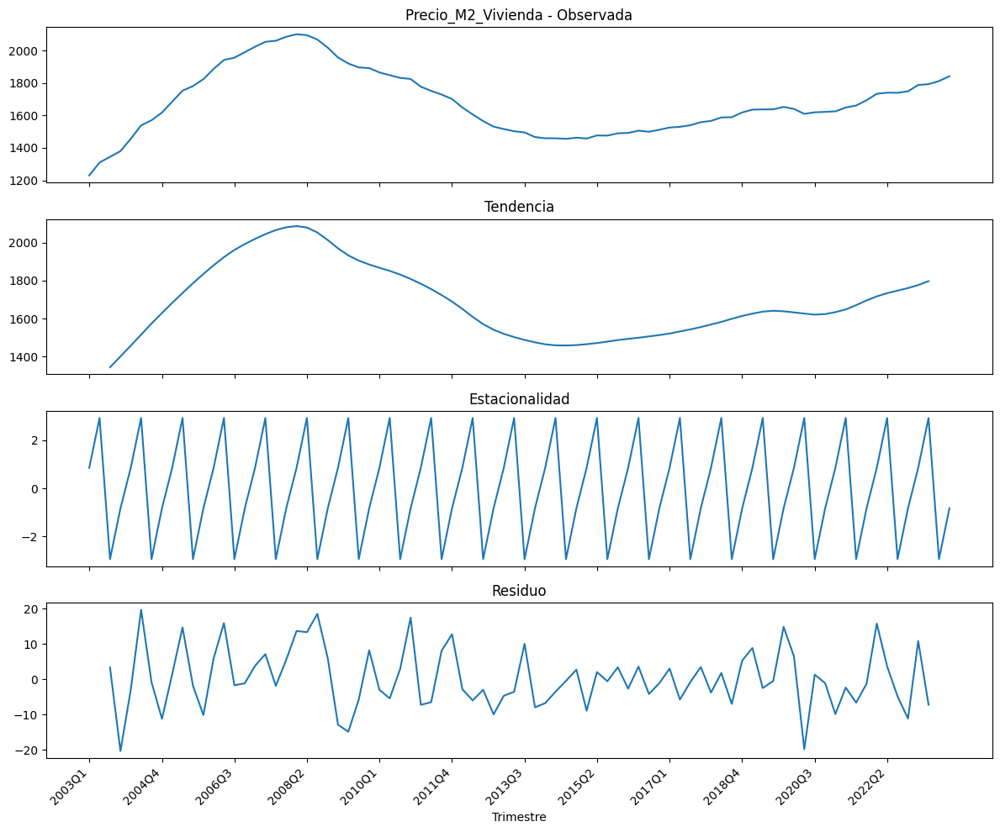


--- Descomposición de la serie temporal: Renta_Disponible_Bruta ---


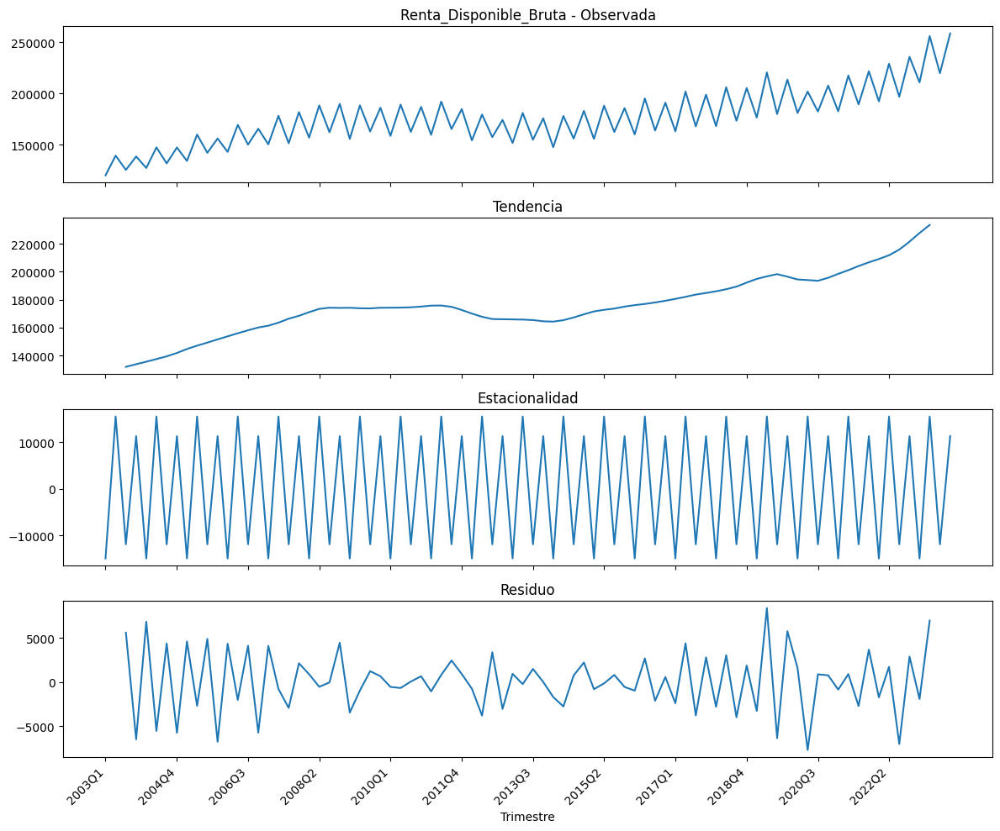


--- Descomposición de la serie temporal: Tasa_Paro_(%) ---


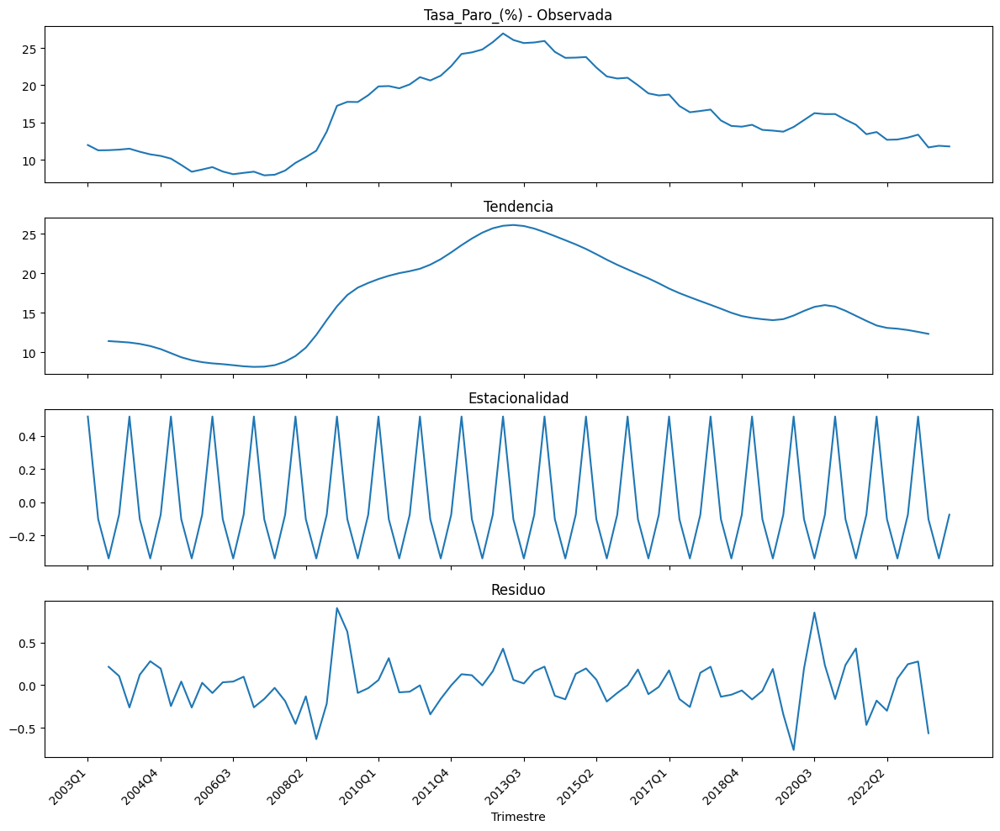


--- Descomposición de la serie temporal: Ti_Credito ---


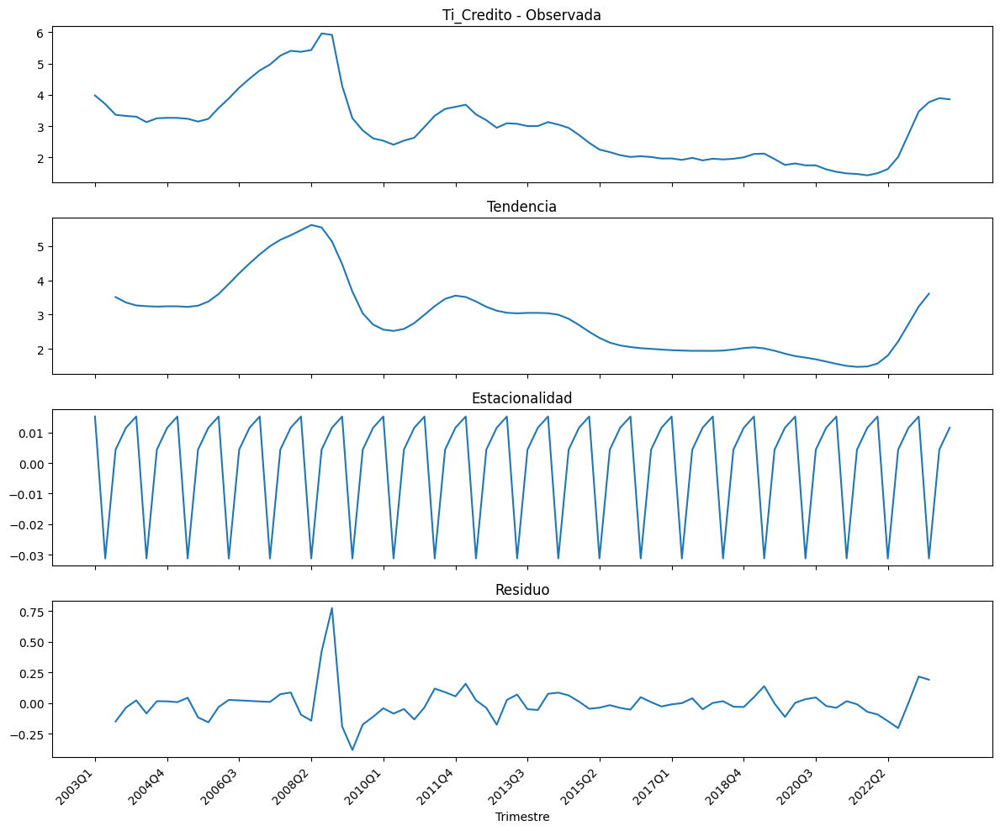


--- Descomposición de la serie temporal: Tipo_Interes_Medio ---


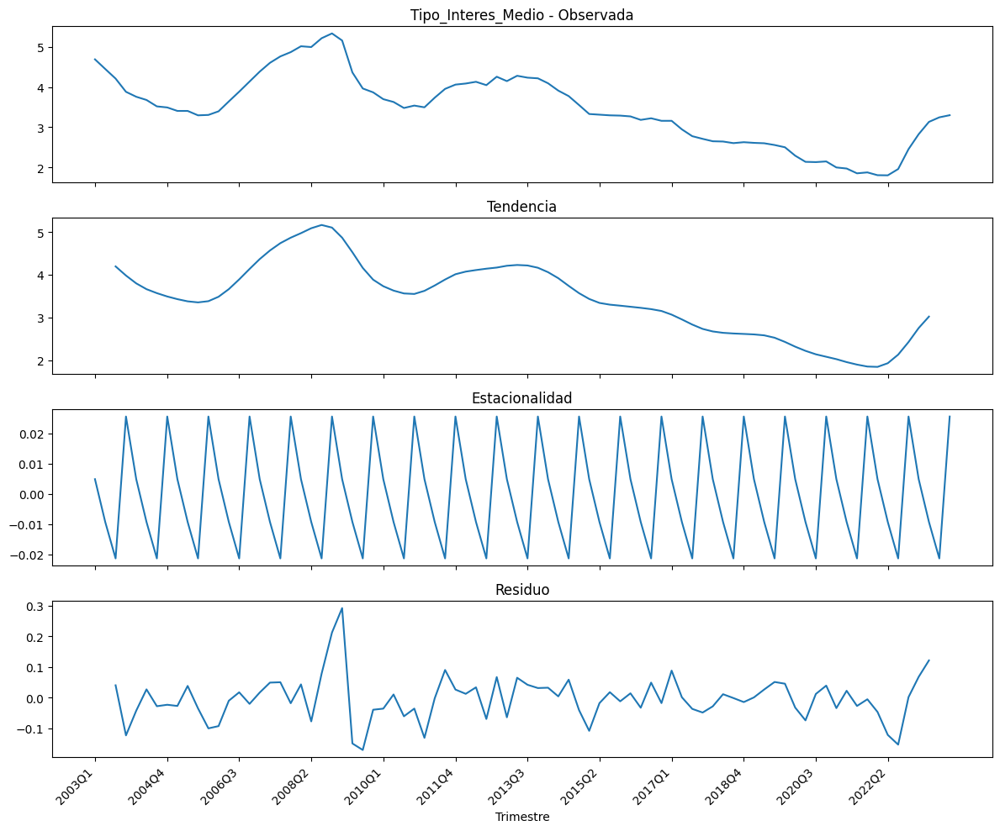


--- Descomposición de la serie temporal: Valor_Compraventa ---


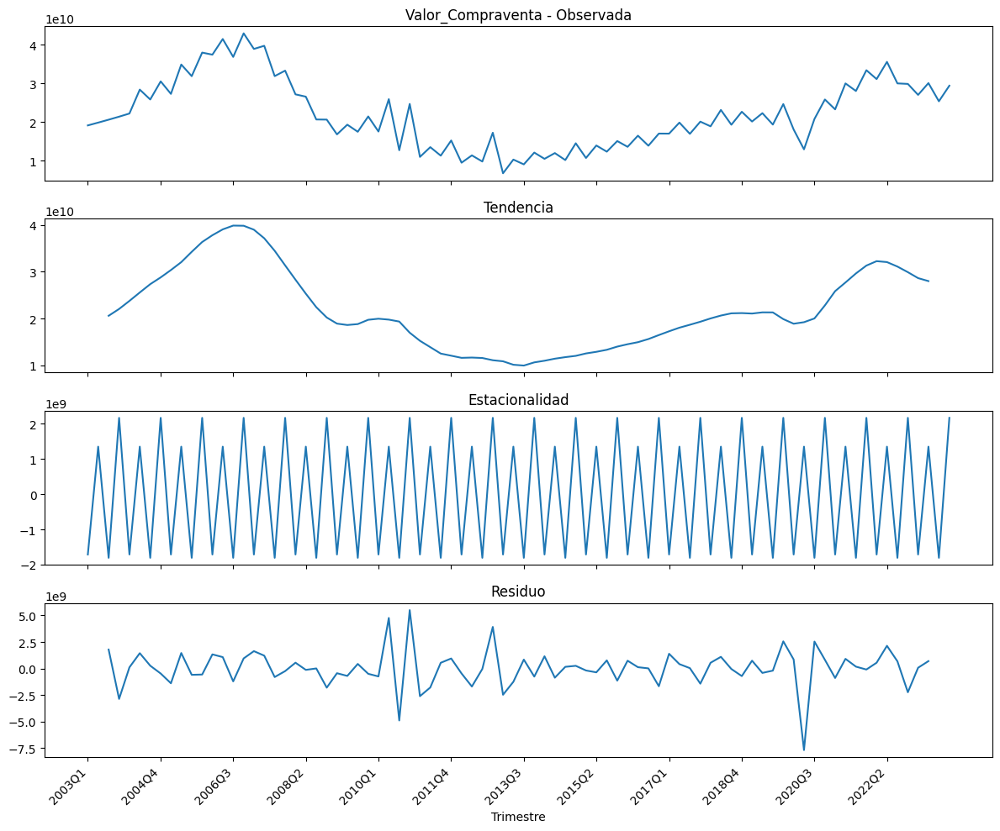


--- Descomposición de la serie temporal: Valor_Medio_Hipotecas ---


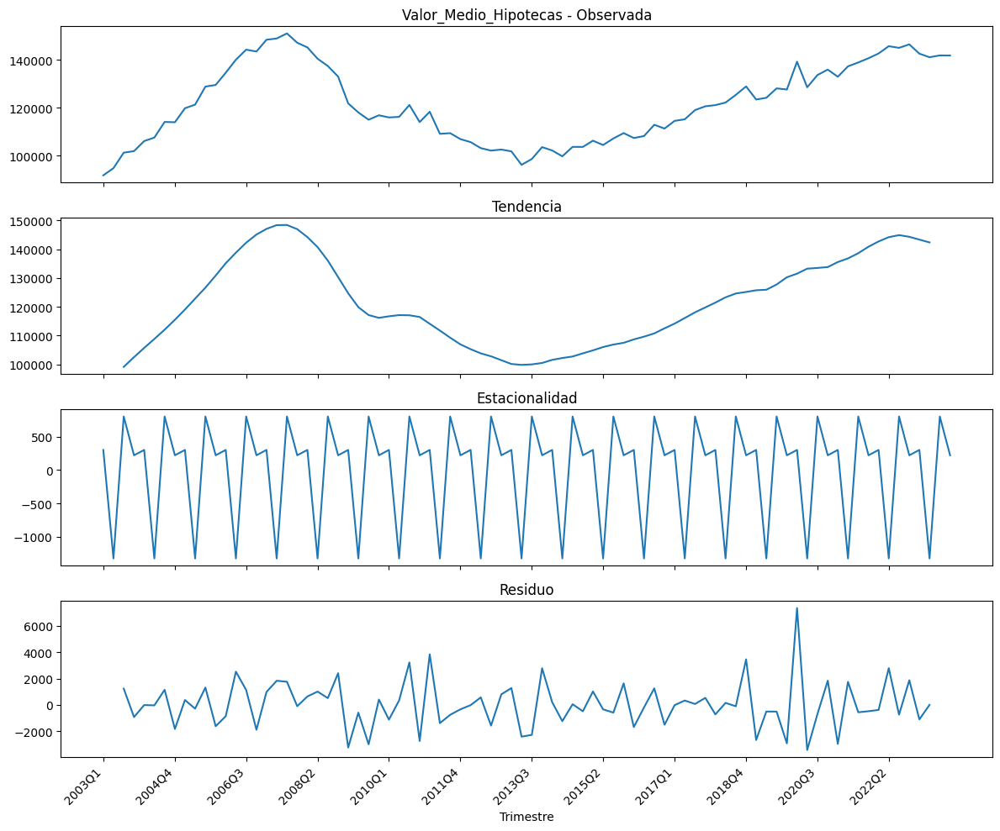

In [13]:
for col in cols:
    print(f"\n--- Descomposición de la serie temporal: {col} ---")
    try:
        result = seasonal_decompose(df_clean[col], model='additive', period=4)

        fig, axs = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

        fechas = df_clean['Fecha']
        trimestres = fechas.dt.to_period("Q").astype(str) 

        axs[0].plot(fechas, result.observed)
        axs[0].set_title(f'{col} - Observada')

        axs[1].plot(fechas, result.trend)
        axs[1].set_title('Tendencia')

        axs[2].plot(fechas, result.seasonal)
        axs[2].set_title('Estacionalidad')

        axs[3].plot(fechas, result.resid)
        axs[3].set_title('Residuo')

        step = max(1, len(fechas) // 12)  
        axs[3].set_xticks(fechas[::step])
        axs[3].set_xticklabels(trimestres[::step], rotation=45, ha='right')

        plt.xlabel('Trimestre')
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"No se pudo descomponer {col}: {e}")


## Análisis de estacionalidad y método ANOVA

En este caso, vamos a agrupar las variables por trimestres para realizar un análisis estacional. Lo que vamos a ver en cada gráfico es:

* **Mediana (línea central de la caja)**: es el valor típico de la variable para ese trimestre

* **Caja (desde el primer al tercer cuartil)**: es el rango donde está el 50% de los datos centrales

* **Bigotes y puntos fuera (outliers)**: variabilidad y valores extremos

Lo que nos va a permitir es una comparación entre trimestres. Es decir, si la variable tiene valores más altos, más dispersos o más atípicos en ciertos trimestres

* **Si las cajas son similares entre trimestres**, podemos decir que la variable no  tiene mucha estacionalidad

* **Si las medianas cambian notablemente entre trimestres**, puede ser un indicio de una estacionalidad clara

* **Si la dispersión o presencia de outliers cambia mucho**, puede indicar que en ciertos trimestres hay más volatilidad o eventos especiales

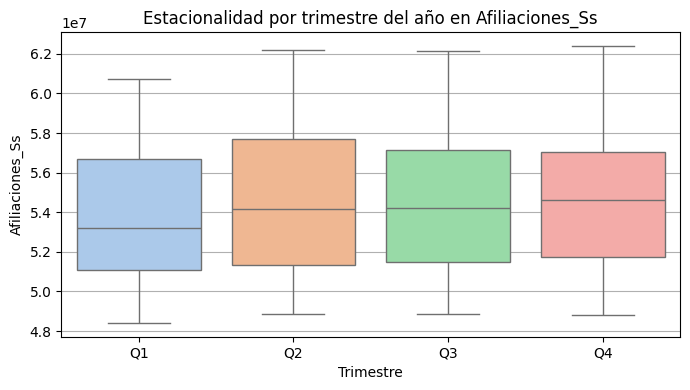

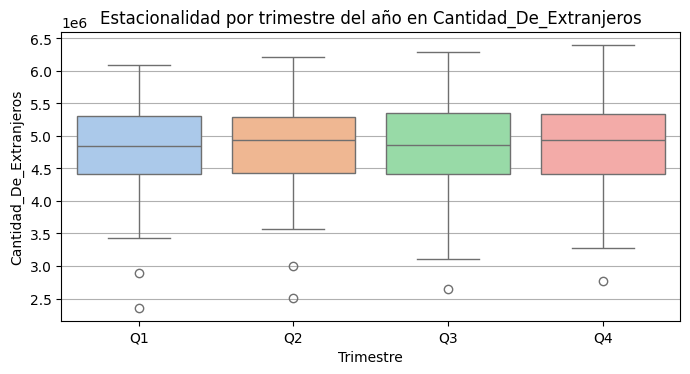

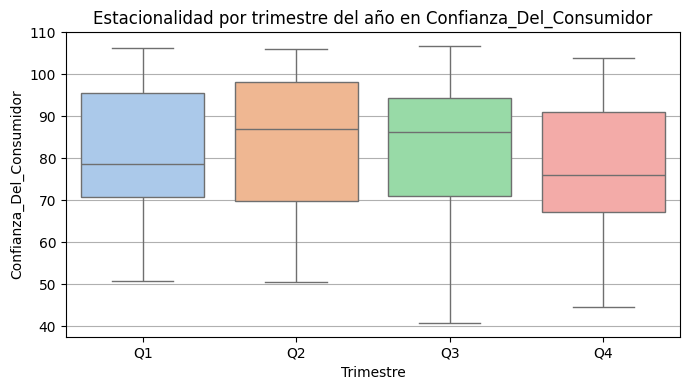

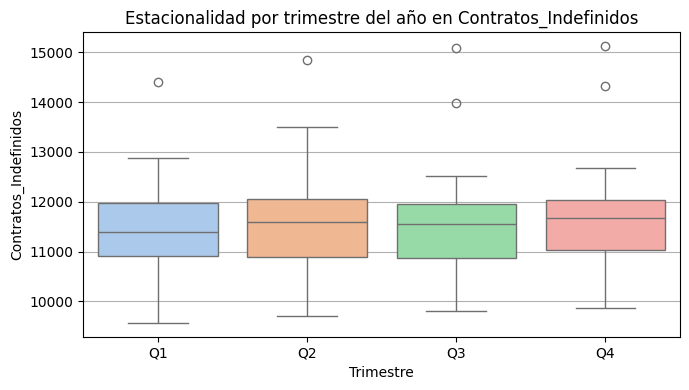

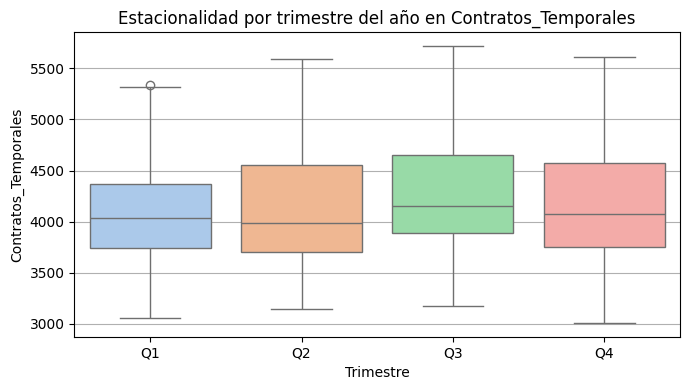

...

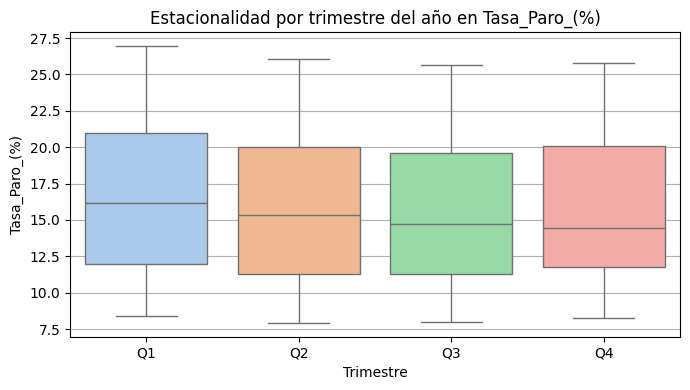

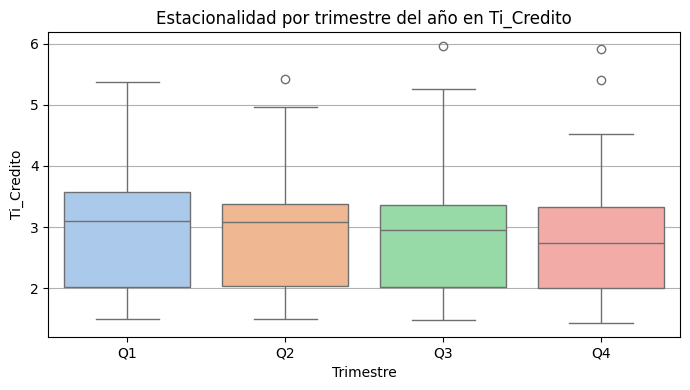

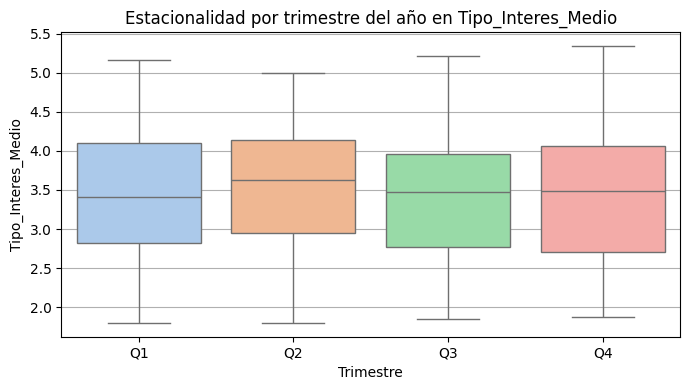

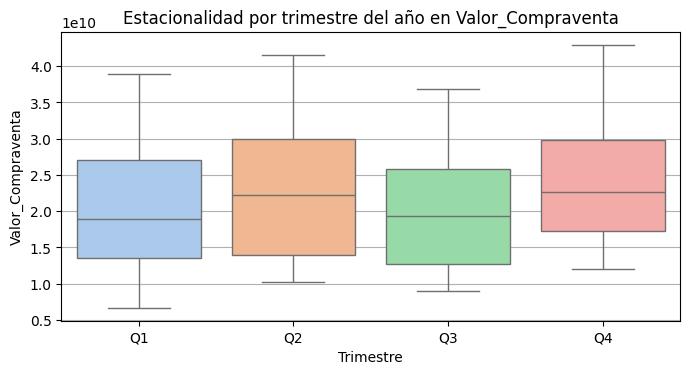

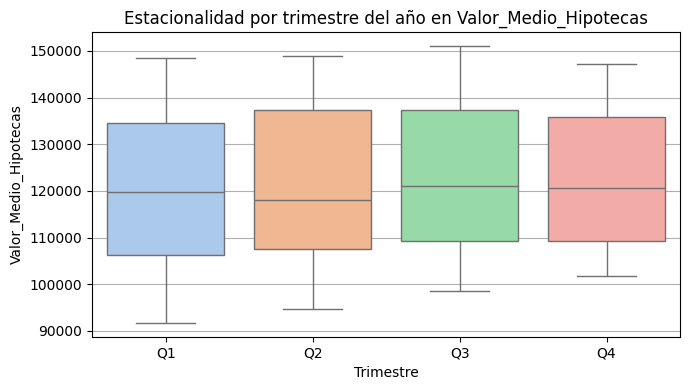

In [14]:
df_clean['Trimestre_simple'] = df_clean['Fecha'].dt.quarter.astype(str).replace({'1': 'Q1', '2': 'Q2', '3': 'Q3', '4': 'Q4'})

cols = df_clean.select_dtypes(include=['float64', 'int64']).columns.difference(['Fecha_ordinal'])

for col in cols:
    plt.figure(figsize=(7, 4))
    sns.boxplot(
        x='Trimestre_simple',
        y=col,
        hue='Trimestre_simple',   
        data=df_clean,
        palette='pastel',
        legend=False              
    )
    plt.title(f'Estacionalidad por trimestre del año en {col}')
    plt.xlabel('Trimestre')
    plt.ylabel(col)
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()

A continuación, vamos a estudiar también si hay diferencias significativas entre trimestres por cada variable con el **método ANOVA (Analysis of Variance)**, que es una técnica estadística que nos ayuda a determinar si al menos alguno de los grupos/trimestres tiene una media significativamente distinta a las demás. En este sentido, si detectamos diferencias significativas en las medias de una variable según el trimestre, es una señal clara de que la variable presenta estacionalidad

Para ello, con el objetivo de hacerlo con el mayor rigor estadístico posible, dividimos las variables en tres grupos:

* **1. Variables totales acumuladas o sumatorios absolutos:** tenemos que trabajar con tasas de crecimiento interanuales o trimestrales

Afiliaciones_Ss (total personas afiliadas)

Cantidad_De_Extranjeros (total población extranjera)

Contratos_Indefinidos (total contratos indefinidos)

Contratos_Temporales (total contratos temporales)

Importe_Hipotecas (€ total importe hipotecas)

Numero_Compraventas (total compraventas vivienda)

Numero_Hipotecas (total hipotecas concedidas)

Poblacion (total población trimestral, acumulativa)

Renta_Disponible_Bruta (€ total renta disponible bruta)

Valor_Compraventa (€ total valor compraventas)

Valor_Medio_Hipotecas (€ valor medio hipotecas)

* **2. Variables índices, tasas o porcentajes:** podemos trabajar directamente con estas variables sin ninguna transformación

    Confianza_Del_Consumidor (índice)
    
    Euribor_12_Meses (%)
    
    Interes_Fijo_Hipotecas (%)
    
    Interes_Variable_Hipotecas (%)
    
    Ipc_%_Variación_Anual (%)
    
    Ipi_Variacion_Anual_Corregida (%)
    
    Ipi_Variacion_Anual_Original (%)
    
    Mro_Rate (%)
    
    Pib_Trimestral_Ajustado (%)
    
    Pib_Trimestral_No_Ajustado (%)
    
    Tasa_Paro_(%) (%)
    
    Ti_Credito (%)
    
    Tipo_Interes_Medio (%)

* **3. Variables de duración o medias:** aplicamos el test ANOVA  directamente sin transformación

Duracion_Media_Hipoteca (años)
Precio_M2_Vivienda (€ precio medio vivienda por m2)

In [15]:
import pandas as pd
from scipy.stats import f_oneway

# 1. Añadir columnas Año y Trimestre_simple si no están
df_clean['Año'] = df_clean['Fecha'].dt.year
df_clean['Trimestre_simple'] = df_clean['Fecha'].dt.quarter.map({1:'Q1', 2:'Q2', 3:'Q3', 4:'Q4'})

# 2. Variables según tipo
variables_totales = [
    'Afiliaciones_Ss',
    'Cantidad_De_Extranjeros',
    'Contratos_Indefinidos',
    'Contratos_Temporales',
    'Importe_Hipotecas',
    'Numero_Compraventas',
    'Numero_Hipotecas',
    'Poblacion',
    'Renta_Disponible_Bruta',
    'Valor_Compraventa',
    'Valor_Medio_Hipotecas'
]

variables_medias = [
    'Duracion_Media_Hipoteca',
    'Precio_M2_Vivienda'
]

variables_indices = [
    'Confianza_Del_Consumidor',
    'Euribor_12_Meses',
    'Interes_Fijo_Hipotecas',
    'Interes_Variable_Hipotecas',
    'Ipc_%_Variación_Anual',
    'Ipi_Variacion_Anual_Corregida',
    'Ipi_Variacion_Anual_Original',
    'Mro_Rate',
    'Pib_Trimestral_Ajustado',
    'Pib_Trimestral_No_Ajustado',
    'Tasa_Paro_(%)',
    'Ti_Credito',
    'Tipo_Interes_Medio'
]

# 3. Calcular variación interanual % para variables totales (por trimestre)
df_variacion = df_clean.copy()
for var in variables_totales:
    df_variacion[var + '_var_interanual'] = df_variacion.groupby('Trimestre_simple')[var].pct_change() * 100

# 4. ANOVA variables índices y medias (valores directos)
print("ANOVA variables índices y medias (valores directos):\n")

for var in variables_indices + variables_medias:
    grupos = [df_clean[df_clean['Trimestre_simple'] == t][var].dropna() for t in ['Q1', 'Q2', 'Q3', 'Q4']]
    grupos = [g for g in grupos if len(g) > 0]
    
    if len(grupos) > 1:
        stat, p = f_oneway(*grupos)
        print(f"{var}: F={stat:.3f}, p={p:.4f}")
        if p < 0.05:
            print("  -> Diferencias significativas entre trimestres\n")
        else:
            print("  -> No hay diferencias significativas entre trimestres\n")
    else:
        print(f"{var}: No hay suficientes datos para ANOVA\n")

# 5. ANOVA variables totales (con variaciones interanuales)
print("ANOVA variables totales (variación interanual %):\n")

for var in variables_totales:
    var_var = var + '_var_interanual'
    grupos = [df_variacion[df_variacion['Trimestre_simple'] == t][var_var].dropna() for t in ['Q1', 'Q2', 'Q3', 'Q4']]
    grupos = [g for g in grupos if len(g) > 0]

    if len(grupos) > 1:
        stat, p = f_oneway(*grupos)
        print(f"{var} (var interanual): F={stat:.3f}, p={p:.4f}")
        if p < 0.05:
            print("  -> Diferencias significativas entre trimestres\n")
        else:
            print("  -> No hay diferencias significativas entre trimestres\n")
    else:
        print(f"{var} (var interanual): No hay suficientes datos para ANOVA\n")


ANOVA variables índices y medias (valores directos):

Confianza_Del_Consumidor: F=0.215, p=0.8858
  -> No hay diferencias significativas entre trimestres

Euribor_12_Meses: F=0.032, p=0.9923
  -> No hay diferencias significativas entre trimestres

Interes_Fijo_Hipotecas: F=-0.000, p=nan
  -> No hay diferencias significativas entre trimestres

Interes_Variable_Hipotecas: F=0.000, p=1.0000
  -> No hay diferencias significativas entre trimestres

Ipc_%_Variación_Anual: F=0.003, p=0.9997
  -> No hay diferencias significativas entre trimestres

Ipi_Variacion_Anual_Corregida: F=0.030, p=0.9929
  -> No hay diferencias significativas entre trimestres

Ipi_Variacion_Anual_Original: F=0.036, p=0.9906
  -> No hay diferencias significativas entre trimestres

Mro_Rate: F=0.003, p=0.9998
  -> No hay diferencias significativas entre trimestres

Pib_Trimestral_Ajustado: F=0.170, p=0.9165
  -> No hay diferencias significativas entre trimestres

Pib_Trimestral_No_Ajustado: F=1.557, p=0.2062
  -> No hay 

## Variación anual de las variables

A continuación, vamos a analizar para cada variable cual es su **% de variación anual desde 2003 hasta 2023** y lo vamos a representar también gráficamente:


📊 Porcentaje de variación anual para 'Afiliaciones_Ss':


,Variación % Afiliaciones_Ss
Año,
2003,NaN
2004,2.82
2005,4.41
2006,4.27
2007,2.99
2008,-0.67
2009,-5.43
2010,-1.55
2011,-1.25


<Figure size 1200x400 with 0 Axes>

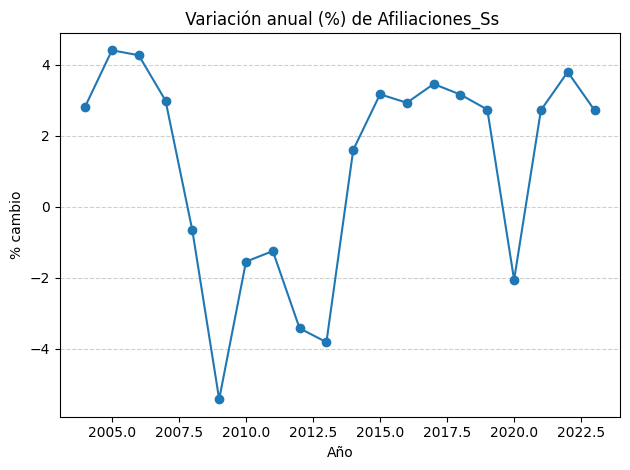


📊 Porcentaje de variación anual para 'Cantidad_De_Extranjeros':


,Variación % Cantidad_De_Extranjeros
Año,
2003,NaN
2004,19.46
2005,18.27
2006,13.10
2007,14.35
2008,10.93
2009,3.78
2010,-0.80
2011,-1.59


<Figure size 1200x400 with 0 Axes>

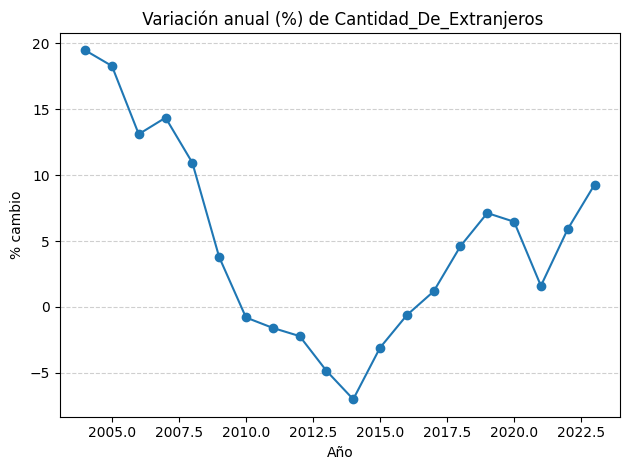


📊 Porcentaje de variación anual para 'Confianza_Del_Consumidor':


,Variación % Confianza_Del_Consumidor
Año,
2003,NaN
2004,-7.19
2005,-6.10
2006,-3.53
2007,-1.34
2008,-33.50
2009,14.82
2010,7.70
2011,-0.10


<Figure size 1200x400 with 0 Axes>

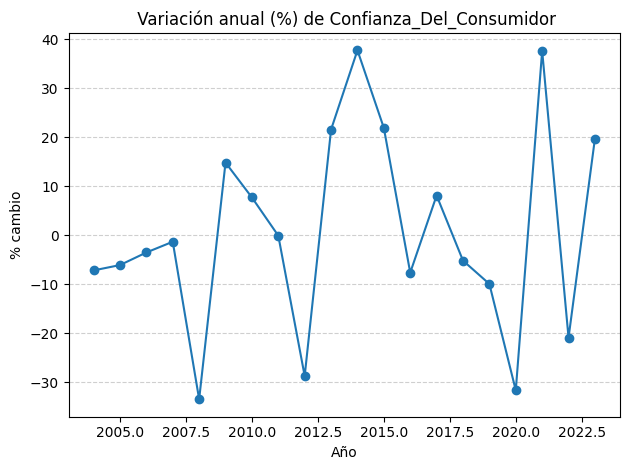


📊 Porcentaje de variación anual para 'Contratos_Indefinidos':


,Variación % Contratos_Indefinidos
Año,
2003,NaN
2004,3.13
2005,4.32
2006,3.35
2007,7.28
2008,2.94
2009,-0.64
2010,-1.20
2011,-1.79


<Figure size 1200x400 with 0 Axes>

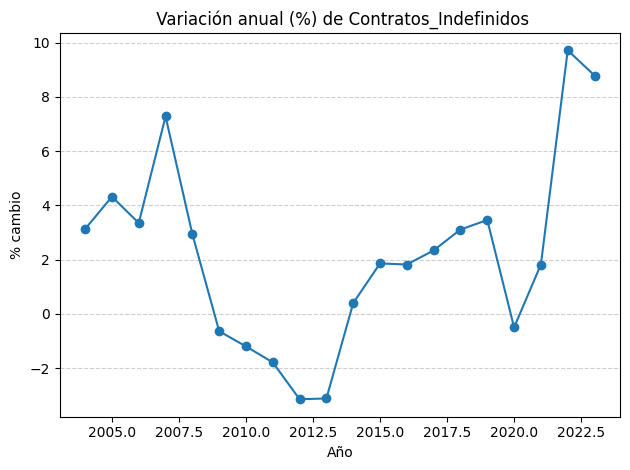


📊 Porcentaje de variación anual para 'Contratos_Temporales':


,Variación % Contratos_Temporales
Año,
2003,NaN
2004,6.01
2005,8.48
2006,6.01
2007,-3.79
2008,-8.36
2009,-18.41
2010,-3.64
2011,0.31


<Figure size 1200x400 with 0 Axes>

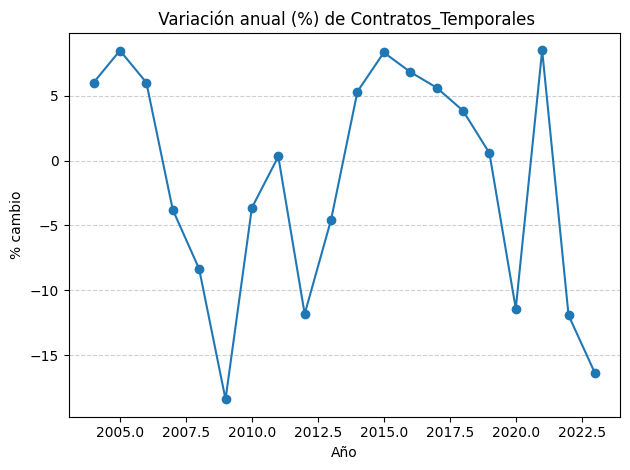


📊 Porcentaje de variación anual para 'Duracion_Media_Hipoteca':


,Variación % Duracion_Media_Hipoteca
Año,
2003,NaN
2004,4.35
2005,4.17
2006,8.00
2007,3.70
2008,-3.57
2009,-10.80
2010,0.69
2011,-1.72


<Figure size 1200x400 with 0 Axes>

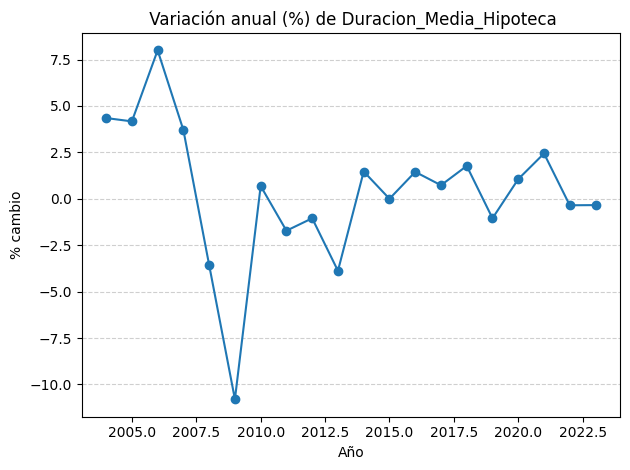


📊 Porcentaje de variación anual para 'Euribor_12_Meses':


,Variación % Euribor_12_Meses
Año,
2003,NaN
2004,-1.83
2005,2.66
2006,47.22
2007,29.49
2008,8.18
2009,-66.39
2010,-16.54
2011,48.56


<Figure size 1200x400 with 0 Axes>

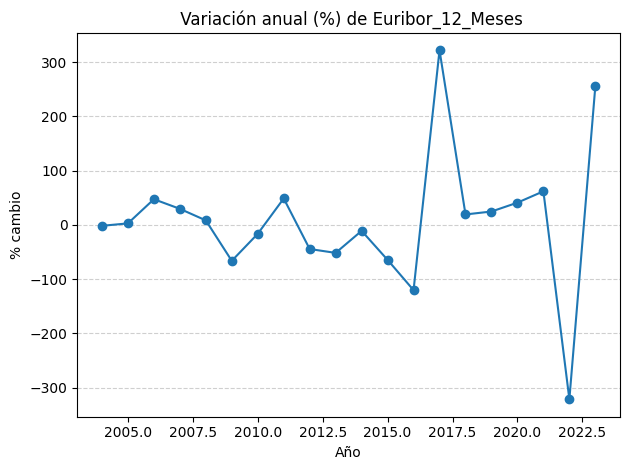


📊 Porcentaje de variación anual para 'Importe_Hipotecas':


,Variación % Importe_Hipotecas
Año,
2003,NaN
2004,27.00
2005,28.49
2006,20.00
2007,-2.08
2008,-36.66
2009,-34.36
2010,-7.35
2011,-35.65


<Figure size 1200x400 with 0 Axes>

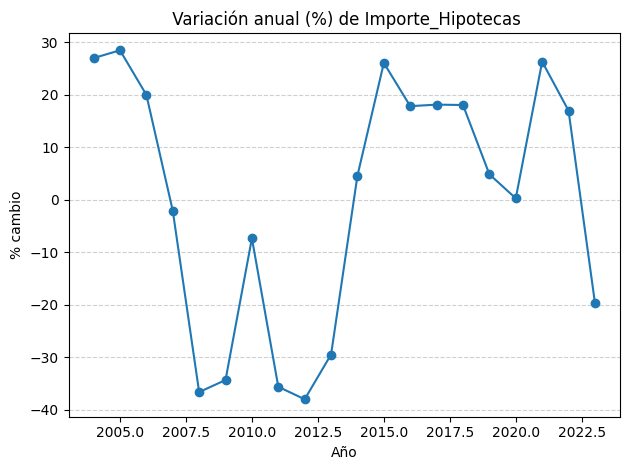


📊 Porcentaje de variación anual para 'Interes_Fijo_Hipotecas':


,Variación % Interes_Fijo_Hipotecas
Año,
2003,NaN
2004,-16.70
2005,-9.79
2006,11.89
2007,23.09
2008,14.63
2009,-6.38
2010,-10.66
2011,-1.96


<Figure size 1200x400 with 0 Axes>

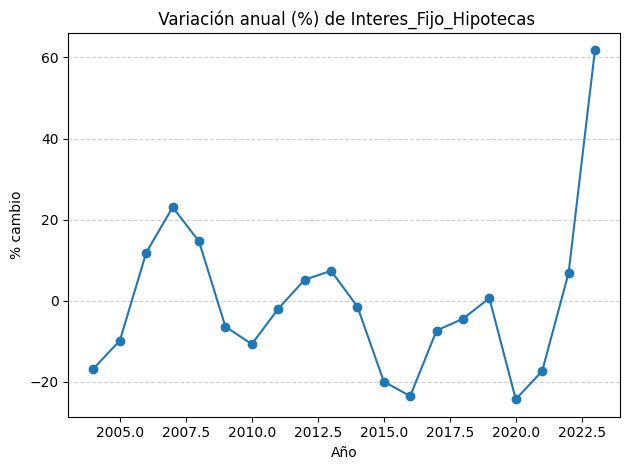


📊 Porcentaje de variación anual para 'Interes_Variable_Hipotecas':


,Variación % Interes_Variable_Hipotecas
Año,
2003,NaN
2004,-16.32
2005,-6.96
2006,12.28
2007,23.47
2008,10.15
2009,-15.49
2010,-17.40
2011,4.49


<Figure size 1200x400 with 0 Axes>

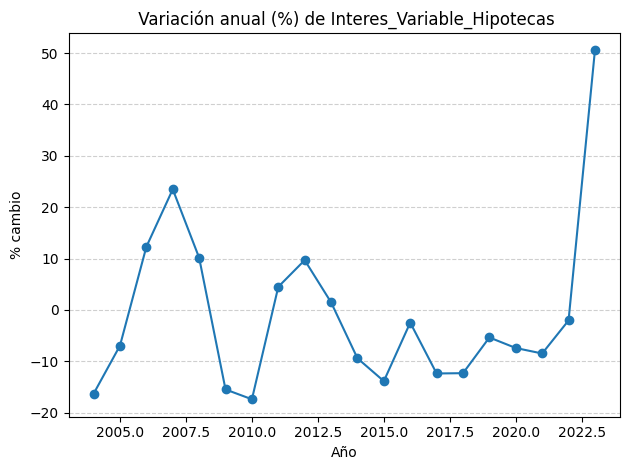


📊 Porcentaje de variación anual para 'Ipc_%_Variación_Anual':


,Variación % Ipc_%_Variación_Anual
Año,
2003,NaN
2004,-2.41
2005,11.23
2006,5.67
2007,-21.21
2008,47.04
2009,-105.84
2010,-951.72
2011,47.77


<Figure size 1200x400 with 0 Axes>

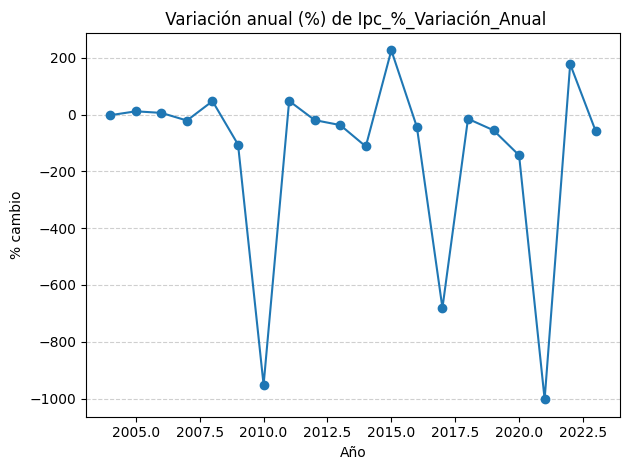


📊 Porcentaje de variación anual para 'Ipi_Variacion_Anual_Corregida':


,Variación % Ipi_Variacion_Anual_Corregida
Año,
2003,NaN
2004,43.53
2005,-72.13
2006,535.29
2007,-40.97
2008,-444.71
2009,111.49
2010,-106.46
2011,-265.83


<Figure size 1200x400 with 0 Axes>

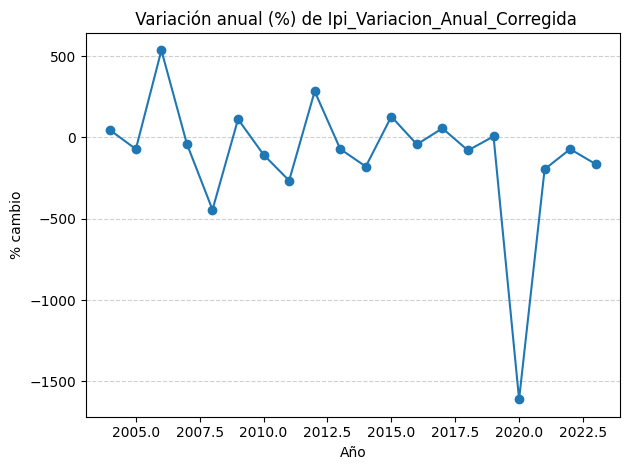


📊 Porcentaje de variación anual para 'Ipi_Variacion_Anual_Original':


,Variación % Ipi_Variacion_Anual_Original
Año,
2003,NaN
2004,39.78
2005,-83.00
2006,925.58
2007,-33.33
2008,-386.39
2009,120.67
2010,-106.19
2011,-288.70


<Figure size 1200x400 with 0 Axes>

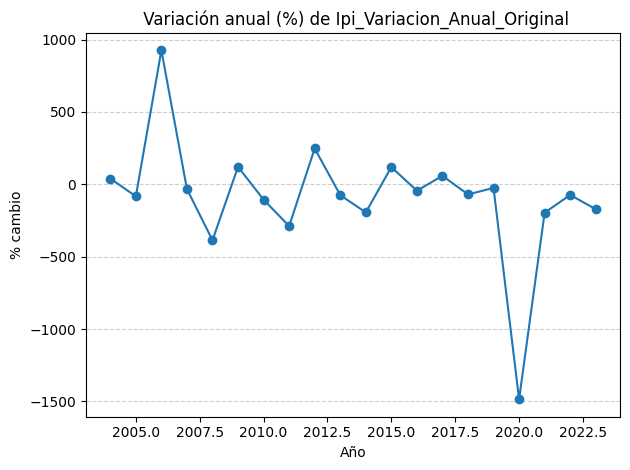


📊 Porcentaje de variación anual para 'Mro_Rate':


,Variación % Mro_Rate
Año,
2003,NaN
2004,0.00
2005,0.00
2006,0.00
2007,0.00
2008,-2.62
2009,-62.42
2010,-21.92
2011,24.85


<Figure size 1200x400 with 0 Axes>

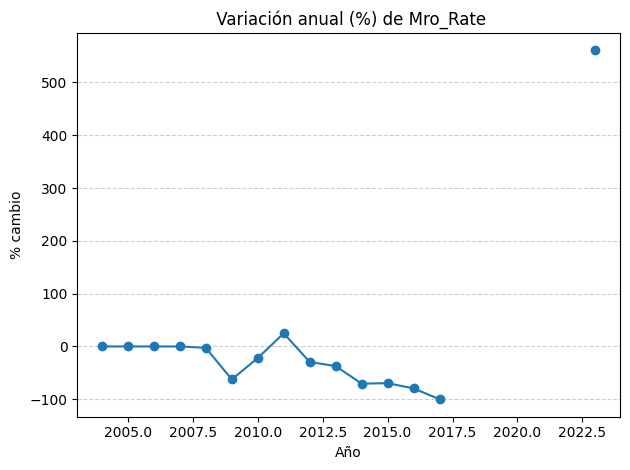


📊 Porcentaje de variación anual para 'Numero_Compraventas':


,Variación % Numero_Compraventas
Año,
2003,NaN
2004,13.82
2005,6.27
2006,5.95
2007,-12.39
2008,-32.55
2009,-17.85
2010,5.95
2011,-28.94


<Figure size 1200x400 with 0 Axes>

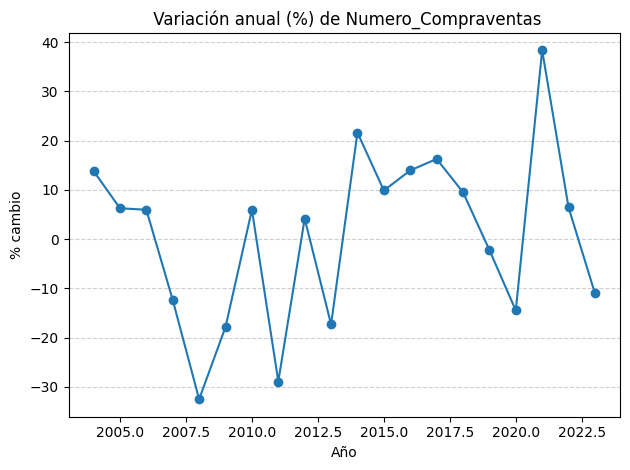


📊 Porcentaje de variación anual para 'Numero_Hipotecas':


,Variación % Numero_Hipotecas
Año,
2003,NaN
2004,11.95
2005,13.54
2006,6.72
2007,-7.70
2008,-32.49
2009,-22.18
2010,-6.66
2011,-32.77


<Figure size 1200x400 with 0 Axes>

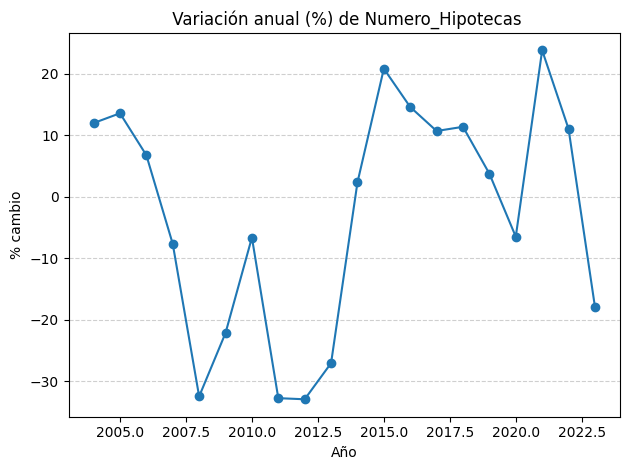


📊 Porcentaje de variación anual para 'Pib_Trimestral_Ajustado':


,Variación % Pib_Trimestral_Ajustado
Año,
2003,NaN
2004,7.15
2005,7.91
2006,8.28
2007,7.22
2008,3.24
2009,-3.54
2010,0.39
2011,-0.78


<Figure size 1200x400 with 0 Axes>

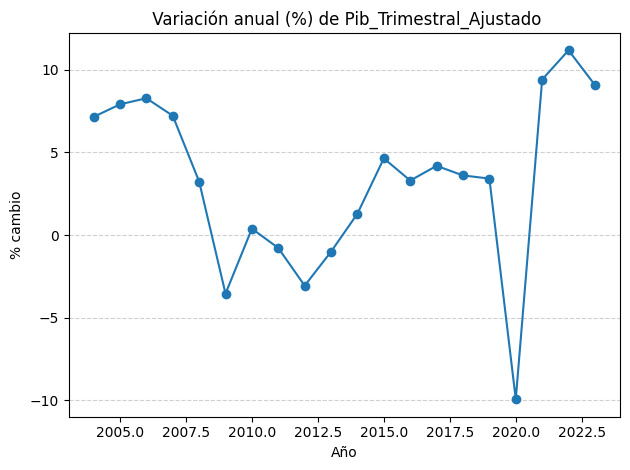


📊 Porcentaje de variación anual para 'Pib_Trimestral_No_Ajustado':


,Variación % Pib_Trimestral_No_Ajustado
Año,
2003,NaN
2004,7.15
2005,7.91
2006,8.28
2007,7.22
2008,3.24
2009,-3.55
2010,0.39
2011,-0.78


<Figure size 1200x400 with 0 Axes>

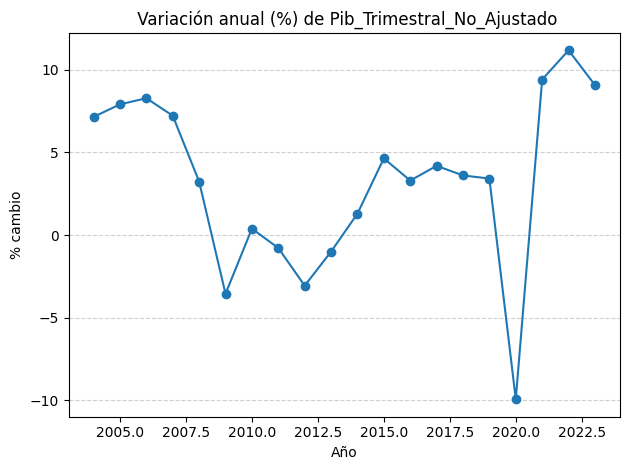


📊 Porcentaje de variación anual para 'Poblacion':


,Variación % Poblacion
Año,
2003,NaN
2004,1.65
2005,1.80
2006,1.64
2007,1.89
2008,1.72
2009,0.95
2010,0.46
2011,0.37


<Figure size 1200x400 with 0 Axes>

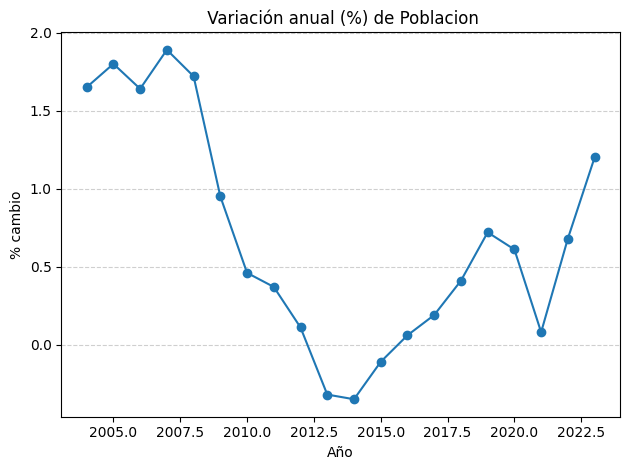


📊 Porcentaje de variación anual para 'Precio_M2_Vivienda':


,Variación % Precio_M2_Vivienda
Año,
2003,NaN
2004,17.45
2005,13.91
2006,10.41
2007,5.76
2008,0.72
2009,-7.44
2010,-3.86
2011,-5.58


<Figure size 1200x400 with 0 Axes>

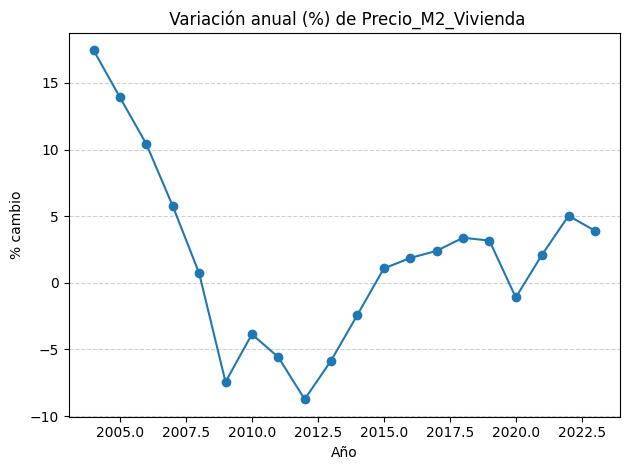


📊 Porcentaje de variación anual para 'Renta_Disponible_Bruta':


,Variación % Renta_Disponible_Bruta
Año,
2003,NaN
2004,5.80
2005,6.92
2006,6.06
2007,5.36
2008,5.34
2009,-0.59
2010,0.60
2011,0.65


<Figure size 1200x400 with 0 Axes>

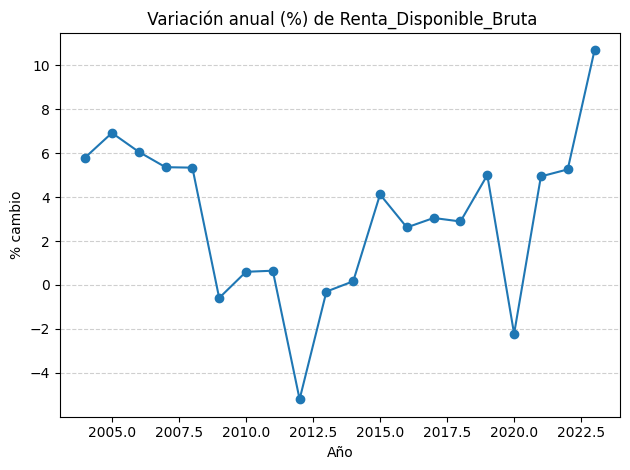


📊 Porcentaje de variación anual para 'Tasa_Paro_(%)':


,Variación % Tasa_Paro_(%)
Año,
2003,NaN
2004,-4.53
2005,-16.53
2006,-7.65
2007,-2.60
2008,36.59
2009,58.78
2010,11.22
2011,7.72


<Figure size 1200x400 with 0 Axes>

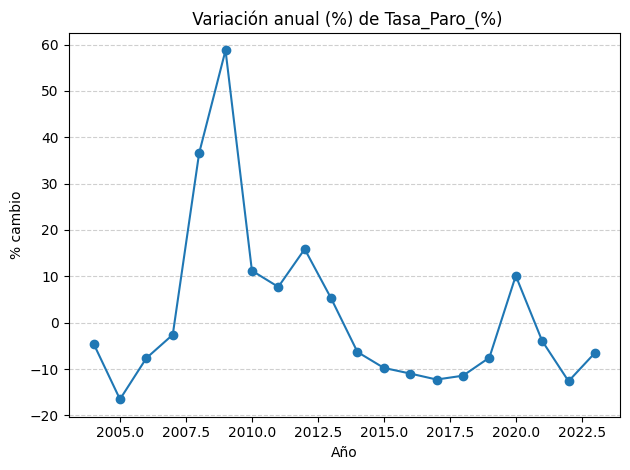


📊 Porcentaje de variación anual para 'Ti_Credito':


,Variación % Ti_Credito
Año,
2003,NaN
2004,-9.92
2005,-0.53
2006,25.85
2007,25.86
2008,11.15
2009,-42.61
2010,-22.29
2011,33.22


<Figure size 1200x400 with 0 Axes>

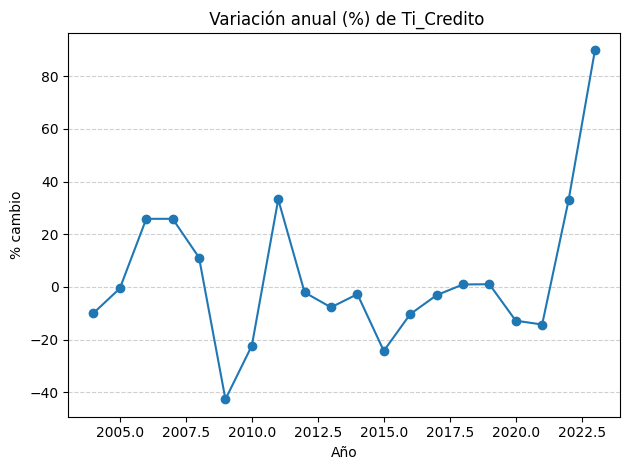


📊 Porcentaje de variación anual para 'Tipo_Interes_Medio':


,Variación % Tipo_Interes_Medio
Año,
2003,NaN
2004,-16.18
2005,-7.17
2006,12.30
2007,23.67
2008,10.45
2009,-15.61
2010,-17.37
2011,6.30


<Figure size 1200x400 with 0 Axes>

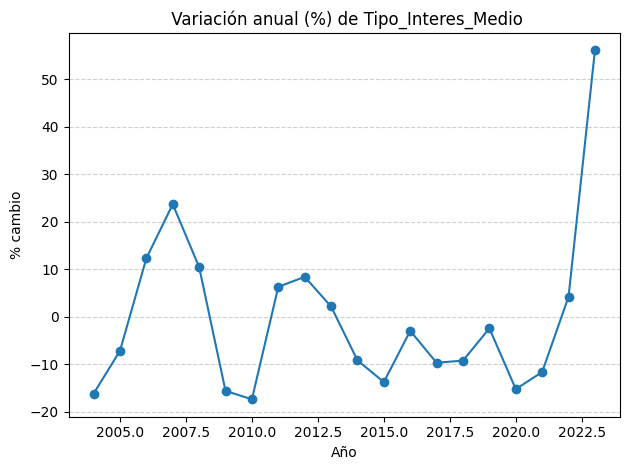


📊 Porcentaje de variación anual para 'Valor_Compraventa':


,Variación % Valor_Compraventa
Año,
2003,NaN
2004,32.10
2005,23.46
2006,20.25
2007,-9.39
2008,-33.96
2009,-21.04
2010,7.74
2011,-36.96


<Figure size 1200x400 with 0 Axes>

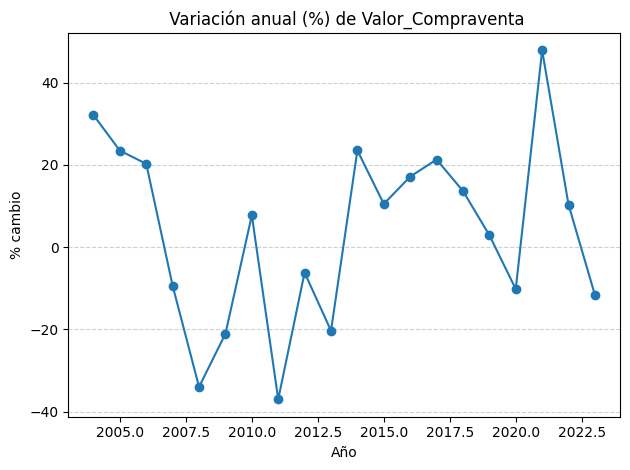


📊 Porcentaje de variación anual para 'Valor_Medio_Hipotecas':


,Variación % Valor_Medio_Hipotecas
Año,
2003,NaN
2004,13.34
2005,13.10
2006,12.62
2007,5.89
2008,-6.62
2009,-15.19
2010,-0.94
2011,-5.05


<Figure size 1200x400 with 0 Axes>

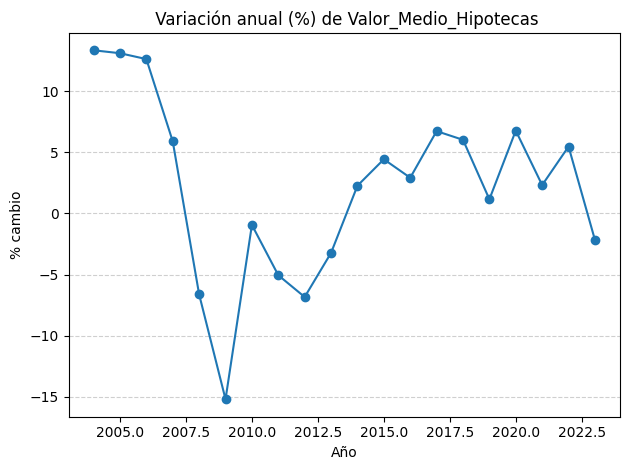

In [16]:
df_clean['Año'] = df_clean['Fecha'].dt.year

for col in cols:
    annual_pct = df_clean.groupby('Año')[col].mean().pct_change() * 100
    annual_df = annual_pct.to_frame(name=f'Variación % {col}').round(2)
    
    print(f"\n📊 Porcentaje de variación anual para '{col}':")
    display(annual_df)

    plt.figure(figsize=(12, 4))
    annual_df.plot(marker='o', legend=False)
    plt.title(f' Variación anual (%) de {col}')
    plt.ylabel('% cambio')
    plt.xlabel('Año')
    plt.grid(True, axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

## Variación trimestral de las variables

De igual forma, vamos a observar también para cada variable:
* **Variación trimestral secuencial:** para ver cómo cambian de un trimestre al siguiente
  
* **Variación interanual por trimestre:** por ejemplo, de Q1 de un año a Q1 del siguiente

  
* **Gráfico para ver cómo evoluciona cada trimestre (Q1, Q2, Q3, Q4) a lo largo de los años para cada variable.**: esto es útil para detectar cambios estructurales dentro de un mismo trimestre con el paso del tiempo, ver si hay trimestres que ganan o pierden importancia con el tiempo e identificar cambios de tendencia por estación

In [17]:
df_clean['Periodo'] = df_clean['Fecha'].dt.to_period('Q')

df_clean = df_clean.sort_values('Periodo')

print("🔄 Variación % de un trimestre al siguiente (secuencial):")

for col in cols:
    trimestral_mean = df_clean.groupby('Periodo')[col].mean()
    var_trimestral = trimestral_mean.pct_change() * 100
    var_trimestral_df = var_trimestral.to_frame(name=f'Variación % trimestral de {col}').round(2)

    print(f"\n📊 {col} - variación secuencial por trimestre:")
    display(var_trimestral_df)

🔄 Variación % de un trimestre al siguiente (secuencial):

📊 Afiliaciones_Ss - variación secuencial por trimestre:


,Variación % trimestral de Afiliaciones_Ss
Periodo,
2003Q1,NaN
2003Q2,2.03
2003Q3,0.31
2003Q4,0.07
2004Q1,0.50
...,...
2022Q4,0.58
2023Q1,-0.06
2023Q2,2.46



📊 Cantidad_De_Extranjeros - variación secuencial por trimestre:


,Variación % trimestral de Cantidad_De_Extranjeros
Periodo,
2003Q1,NaN
2003Q2,6.01
2003Q3,5.73
2003Q4,4.81
2004Q1,4.54
...,...
2022Q4,2.66
2023Q1,2.50
2023Q2,2.01



📊 Confianza_Del_Consumidor - variación secuencial por trimestre:


,Variación % trimestral de Confianza_Del_Consumidor
Periodo,
2003Q1,NaN
2003Q2,-1.58
2003Q3,-1.58
2003Q4,-1.58
2004Q1,-1.58
...,...
2022Q4,3.60
2023Q1,20.66
2023Q2,18.37



📊 Contratos_Indefinidos - variación secuencial por trimestre:


,Variación % trimestral de Contratos_Indefinidos
Periodo,
2003Q1,NaN
2003Q2,1.39
2003Q3,1.19
2003Q4,0.43
2004Q1,0.57
...,...
2022Q4,2.45
2023Q1,0.68
2023Q2,3.03



📊 Contratos_Temporales - variación secuencial por trimestre:


,Variación % trimestral de Contratos_Temporales
Periodo,
2003Q1,NaN
2003Q2,4.13
2003Q3,2.23
2003Q4,0.76
2004Q1,-1.43
...,...
2022Q4,-11.34
2023Q1,-3.85
2023Q2,3.01



📊 Duracion_Media_Hipoteca - variación secuencial por trimestre:


,Variación % trimestral de Duracion_Media_Hipoteca
Periodo,
2003Q1,NaN
2003Q2,0.00
2003Q3,0.00
2003Q4,0.00
2004Q1,4.35
...,...
2022Q4,1.40
2023Q1,-1.38
2023Q2,1.40



📊 Euribor_12_Meses - variación secuencial por trimestre:


,Variación % trimestral de Euribor_12_Meses
Periodo,
2003Q1,NaN
2003Q2,-8.95
2003Q3,-1.49
2003Q4,7.27
2004Q1,-9.30
...,...
2022Q4,89.43
2023Q1,24.11
2023Q2,10.53



📊 Importe_Hipotecas - variación secuencial por trimestre:


,Variación % trimestral de Importe_Hipotecas
Periodo,
2003Q1,NaN
2003Q2,-3.21
2003Q3,2.47
2003Q4,2.68
2004Q1,21.94
...,...
2022Q4,-3.61
2023Q1,-4.77
2023Q2,-14.96



📊 Interes_Fijo_Hipotecas - variación secuencial por trimestre:


,Variación % trimestral de Interes_Fijo_Hipotecas
Periodo,
2003Q1,NaN
2003Q2,0.00
2003Q3,0.00
2003Q4,0.00
2004Q1,-16.70
...,...
2022Q4,0.00
2023Q1,61.76
2023Q2,0.00



📊 Interes_Variable_Hipotecas - variación secuencial por trimestre:


,Variación % trimestral de Interes_Variable_Hipotecas
Periodo,
2003Q1,NaN
2003Q2,0.00
2003Q3,0.00
2003Q4,0.00
2004Q1,-16.32
...,...
2022Q4,0.00
2023Q1,50.53
2023Q2,0.00



📊 Ipc_%_Variación_Anual - variación secuencial por trimestre:


,Variación % trimestral de Ipc_%_Variación_Anual
Periodo,
2003Q1,NaN
2003Q2,-23.68
2003Q3,3.45
2003Q4,-7.78
2004Q1,-19.28
...,...
2022Q4,-35.43
2023Q1,-23.08
2023Q2,-44.67



📊 Ipi_Variacion_Anual_Corregida - variación secuencial por trimestre:


,Variación % trimestral de Ipi_Variacion_Anual_Corregida
Periodo,
2003Q1,NaN
2003Q2,13.95
2003Q3,-46.94
2003Q4,100.00
2004Q1,7.69
...,...
2022Q4,-105.17
2023Q1,-300.00
2023Q2,-816.67



📊 Ipi_Variacion_Anual_Original - variación secuencial por trimestre:


,Variación % trimestral de Ipi_Variacion_Anual_Original
Periodo,
2003Q1,NaN
2003Q2,-114.66
2003Q3,-252.94
2003Q4,115.38
2004Q1,10.71
...,...
2022Q4,-128.85
2023Q1,-250.00
2023Q2,-293.33



📊 Mro_Rate - variación secuencial por trimestre:


,Variación % trimestral de Mro_Rate
Periodo,
2003Q1,NaN
2003Q2,0.00
2003Q3,0.00
2003Q4,0.00
2004Q1,0.00
...,...
2022Q4,132.38
2023Q1,144.24
2023Q2,14.85



📊 Numero_Compraventas - variación secuencial por trimestre:


,Variación % trimestral de Numero_Compraventas
Periodo,
2003Q1,NaN
2003Q2,0.88
2003Q3,0.88
2003Q4,0.88
2004Q1,0.88
...,...
2022Q4,3.08
2023Q1,-9.19
2023Q2,7.95



📊 Numero_Hipotecas - variación secuencial por trimestre:


,Variación % trimestral de Numero_Hipotecas
Periodo,
2003Q1,NaN
2003Q2,-6.27
2003Q3,-4.09
2003Q4,2.03
2004Q1,17.11
...,...
2022Q4,-4.56
2023Q1,-2.18
2023Q2,-14.06



📊 Pib_Trimestral_Ajustado - variación secuencial por trimestre:


,Variación % trimestral de Pib_Trimestral_Ajustado
Periodo,
2003Q1,NaN
2003Q2,1.87
2003Q3,1.46
2003Q4,1.76
2004Q1,1.73
...,...
2022Q4,3.98
2023Q1,3.00
2023Q2,0.27



📊 Pib_Trimestral_No_Ajustado - variación secuencial por trimestre:


,Variación % trimestral de Pib_Trimestral_No_Ajustado
Periodo,
2003Q1,NaN
2003Q2,6.27
2003Q3,-3.11
2003Q4,7.96
2004Q1,-3.94
...,...
2022Q4,7.72
2023Q1,-3.09
2023Q2,5.37



📊 Poblacion - variación secuencial por trimestre:


,Variación % trimestral de Poblacion
Periodo,
2003Q1,NaN
2003Q2,0.44
2003Q3,0.44
2003Q4,0.42
2004Q1,0.41
...,...
2022Q4,0.33
2023Q1,0.30
2023Q2,0.25



📊 Precio_M2_Vivienda - variación secuencial por trimestre:


,Variación % trimestral de Precio_M2_Vivienda
Periodo,
2003Q1,NaN
2003Q2,6.45
2003Q3,2.70
2003Q4,2.63
2004Q1,5.50
...,...
2022Q4,0.53
2023Q1,2.24
2023Q2,0.27



📊 Renta_Disponible_Bruta - variación secuencial por trimestre:


,Variación % trimestral de Renta_Disponible_Bruta
Periodo,
2003Q1,NaN
2003Q2,15.96
2003Q3,-9.97
2003Q4,10.44
2004Q1,-8.08
...,...
2022Q4,19.72
2023Q1,-10.55
2023Q2,21.41



📊 Tasa_Paro_(%) - variación secuencial por trimestre:


,Variación % trimestral de Tasa_Paro_(%)
Periodo,
2003Q1,NaN
2003Q2,-5.92
2003Q3,0.18
2003Q4,0.62
2004Q1,1.14
...,...
2022Q4,2.04
2023Q1,3.00
2023Q2,-12.78



📊 Ti_Credito - variación secuencial por trimestre:


,Variación % trimestral de Ti_Credito
Periodo,
2003Q1,NaN
2003Q2,-6.86
2003Q3,-9.27
2003Q4,-1.09
2004Q1,-0.71
...,...
2022Q4,36.02
2023Q1,26.18
2023Q2,8.71



📊 Tipo_Interes_Medio - variación secuencial por trimestre:


,Variación % trimestral de Tipo_Interes_Medio
Periodo,
2003Q1,NaN
2003Q2,-5.11
2003Q3,-5.39
2003Q4,-7.83
2004Q1,-3.18
...,...
2022Q4,25.38
2023Q1,15.22
2023Q2,10.85



📊 Valor_Compraventa - variación secuencial por trimestre:


,Variación % trimestral de Valor_Compraventa
Periodo,
2003Q1,NaN
2003Q2,3.80
2003Q3,3.80
2003Q4,3.80
2004Q1,3.80
...,...
2022Q4,-0.45
2023Q1,-9.52
2023Q2,11.30



📊 Valor_Medio_Hipotecas - variación secuencial por trimestre:


,Variación % trimestral de Valor_Medio_Hipotecas
Periodo,
2003Q1,NaN
2003Q2,3.27
2003Q3,6.83
2003Q4,0.64
2004Q1,4.12
...,...
2022Q4,1.00
2023Q1,-2.64
2023Q2,-1.05


In [18]:
df_clean['Año'] = df_clean['Fecha'].dt.year
df_clean['Trimestre_simple'] = df_clean['Fecha'].dt.quarter.map({1: 'Q1', 2: 'Q2', 3: 'Q3', 4: 'Q4'})

print("\n⏳ Variación % interanual por trimestre (Q1 vs Q1, Q2 vs Q2, etc.) con trimestres como columnas:")

for col in cols:
    mean_trim = df_clean.groupby(['Año', 'Trimestre_simple'])[col].mean().unstack()

    var_interanual = mean_trim.pct_change() * 100

    var_interanual = var_interanual.round(2)

    print(f"\n📊 Variación interanual (%) de {col} por trimestre:")
    display(var_interanual)


⏳ Variación % interanual por trimestre (Q1 vs Q1, Q2 vs Q2, etc.) con trimestres como columnas:

📊 Variación interanual (%) de Afiliaciones_Ss por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,2.94,2.58,2.67,3.09
2005,2.80,3.93,5.29,5.58
2006,5.52,4.75,3.59,3.27
2007,3.64,3.33,2.65,2.36
2008,1.42,0.27,-0.91,-3.40
2009,-5.51,-6.35,-5.84,-3.96
2010,-2.64,-1.67,-0.98,-0.89
2011,-1.04,-0.80,-1.18,-2.00



📊 Variación interanual (%) de Cantidad_De_Extranjeros por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,22.81,20.03,17.53,17.94
2005,18.25,18.79,19.30,16.81
2006,14.60,13.27,12.04,12.64
2007,13.19,14.21,15.19,14.71
2008,14.31,12.04,9.91,7.84
2009,5.91,4.50,3.13,1.68
2010,0.30,-0.55,-1.41,-1.54
2011,-1.67,-1.62,-1.58,-1.50



📊 Variación interanual (%) de Confianza_Del_Consumidor por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-6.17,-6.17,-6.17,-10.34
2005,-4.91,-7.16,-6.51,-5.82
2006,-6.42,-6.90,-3.94,3.68
2007,1.16,10.20,-0.52,-15.67
2008,-18.12,-38.75,-43.18,-34.23
2009,-30.95,11.68,53.44,48.38
2010,45.99,8.92,-2.07,-9.91
2011,-4.54,6.32,-3.78,2.23



📊 Variación interanual (%) de Contratos_Indefinidos por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,3.63,3.14,2.30,3.45
2005,4.47,4.52,4.23,4.07
2006,3.56,2.38,3.48,3.99
2007,6.15,8.27,7.58,7.15
2008,4.57,3.97,2.59,0.69
2009,0.63,-0.94,-1.37,-0.88
2010,-2.04,-1.48,-0.56,-0.71
2011,-1.22,-1.06,-2.10,-2.78



📊 Variación interanual (%) de Contratos_Temporales por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,5.73,4.29,7.01,6.94
2005,5.03,10.24,10.52,7.96
2006,10.07,6.92,3.91,3.63
2007,-0.50,-3.64,-4.81,-6.05
2008,-3.98,-7.48,-8.76,-13.27
2009,-21.00,-20.07,-17.97,-14.18
2010,-6.91,-3.17,-2.27,-2.21
2011,0.56,2.19,0.50,-2.05



📊 Variación interanual (%) de Duracion_Media_Hipoteca por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,4.35,4.35,4.35,4.35
2005,4.17,4.17,4.17,4.17
2006,8.00,8.00,8.00,8.00
2007,3.70,3.70,3.70,3.70
2008,-3.57,-3.57,-3.57,-3.57
2009,-8.63,-11.11,-12.33,-11.11
2010,-2.72,1.37,4.22,0.00
2011,4.17,-2.71,-5.43,-2.79



📊 Variación interanual (%) de Euribor_12_Meses por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-12.73,2.25,6.46,-2.10
2005,8.13,-4.41,-6.11,13.48
2006,27.24,51.35,64.43,46.99
2007,38.54,32.24,28.38,21.26
2008,9.56,15.57,15.38,-7.10
2009,-50.39,-66.89,-75.11,-71.52
2010,-44.91,-25.27,5.17,22.74
2011,41.29,69.83,50.62,35.01



📊 Variación interanual (%) de Importe_Hipotecas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,24.18,29.72,31.38,22.94
2005,20.97,31.41,30.04,31.40
2006,35.66,21.56,12.73,11.63
2007,5.77,0.49,-2.66,-12.98
2008,-31.46,-33.21,-40.38,-43.72
2009,-47.03,-38.54,-25.13,-18.65
2010,-0.01,-5.36,-4.04,-21.20
2011,-10.98,-41.68,-48.75,-42.84



📊 Variación interanual (%) de Interes_Fijo_Hipotecas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-16.70,-16.70,-16.70,-16.70
2005,-9.79,-9.79,-9.79,-9.79
2006,11.89,11.89,11.89,11.89
2007,23.09,23.09,23.09,23.09
2008,14.63,14.63,14.63,14.63
2009,-6.38,-6.38,-6.38,-6.38
2010,-10.66,-10.66,-10.66,-10.66
2011,-1.96,-1.96,-1.96,-1.96



📊 Variación interanual (%) de Interes_Variable_Hipotecas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-16.32,-16.32,-16.32,-16.32
2005,-6.96,-6.96,-6.96,-6.96
2006,12.28,12.28,12.28,12.28
2007,23.47,23.47,23.47,23.47
2008,10.15,10.15,10.15,10.15
2009,-15.49,-15.49,-15.49,-15.49
2010,-17.40,-17.40,-17.40,-17.40
2011,4.49,4.49,4.49,4.49



📊 Variación interanual (%) de Ipc_%_Variación_Anual por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-41.23,10.34,8.89,25.30
2005,46.27,2.08,6.12,1.92
2006,24.49,22.45,2.88,-24.53
2007,-40.16,-39.17,-32.71,50.00
2008,84.93,91.78,105.56,-38.33
2009,-89.63,-115.00,-119.59,-90.54
2010,171.43,-433.33,-313.79,1000.00
2011,155.26,41.43,40.32,6.49



📊 Variación interanual (%) de Ipi_Variacion_Anual_Corregida por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,30.23,89.80,253.85,-94.23
2005,-80.36,-102.15,-92.39,1633.33
2006,1000.00,-5100.00,1185.71,132.69
2007,-21.49,-8.00,-41.11,-87.60
2008,-133.68,-264.13,-528.30,-3226.67
2009,1981.25,287.42,89.87,-62.26
2010,-104.35,-115.04,-97.22,-108.47
2011,34.48,-151.14,225.00,-1126.67



📊 Variación interanual (%) de Ipi_Variacion_Anual_Original por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-46.55,-670.59,292.31,-114.29
2005,-208.06,-22.68,-90.20,-412.50
2006,-453.73,-72.00,630.00,340.00
2007,-55.27,304.76,-23.29,-57.27
2008,-216.04,-185.88,-423.21,-1089.36
2009,406.50,790.41,122.10,-60.65
2010,-99.84,-117.38,-100.00,-101.64
2011,-6800.00,-166.37,-inf,-6433.33



📊 Variación interanual (%) de Mro_Rate por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,0.00,0.00,0.00,0.00
2005,0.00,0.00,0.00,0.00
2006,0.00,0.00,0.00,0.00
2007,0.00,0.00,0.00,0.00
2008,0.00,0.00,0.00,-10.48
2009,-51.98,-66.01,-67.62,-64.27
2010,-40.50,-15.94,-11.75,-10.68
2011,10.00,25.00,39.95,24.46



📊 Variación interanual (%) de Numero_Compraventas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,3.55,20.68,7.45,23.40
2005,3.15,7.82,7.58,6.20
2006,18.95,4.25,2.44,0.34
2007,-1.25,-9.57,-15.84,-22.64
2008,-31.06,-31.00,-34.08,-34.70
2009,-34.19,-23.61,-12.54,4.88
2010,2.27,27.70,-25.09,14.41
2011,-30.47,-40.75,-4.99,-28.65



📊 Variación interanual (%) de Numero_Hipotecas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,7.42,14.31,16.59,9.92
2005,7.11,16.49,15.12,15.60
2006,20.70,5.27,0.67,0.75
2007,-4.06,-5.50,-7.03,-15.15
2008,-29.95,-29.19,-34.47,-37.73
2009,-36.86,-26.85,-10.52,-7.39
2010,5.07,-3.85,-8.92,-19.23
2011,-12.77,-37.89,-43.23,-39.03



📊 Variación interanual (%) de Pib_Trimestral_Ajustado por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,7.00,6.71,7.15,7.72
2005,7.49,8.00,8.09,8.07
2006,8.46,8.54,8.36,7.79
2007,8.29,7.45,6.37,6.83
2008,5.38,4.42,3.04,0.23
2009,-3.05,-4.13,-3.75,-3.25
2010,-0.28,0.14,0.51,1.18
2011,0.02,0.20,-0.86,-2.48



📊 Variación interanual (%) de Pib_Trimestral_No_Ajustado por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,6.78,7.10,7.12,7.55
2005,7.82,8.26,7.73,7.83
2006,8.51,8.15,8.13,8.33
2007,7.60,7.39,6.56,7.33
2008,4.61,4.62,3.49,0.47
2009,-3.59,-4.47,-3.34,-2.79
2010,-0.14,0.57,0.49,0.60
2011,0.53,-0.31,-0.81,-2.43



📊 Variación interanual (%) de Poblacion por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,1.72,1.65,1.57,1.67
2005,1.76,1.82,1.87,1.76
2006,1.65,1.62,1.60,1.68
2007,1.76,1.87,1.97,1.97
2008,1.97,1.81,1.65,1.45
2009,1.25,1.04,0.84,0.68
2010,0.53,0.48,0.42,0.40
2011,0.39,0.38,0.37,0.35



📊 Variación interanual (%) de Precio_M2_Vivienda por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,18.36,17.50,16.80,17.22
2005,15.74,13.91,13.41,12.75
2006,12.00,10.81,9.83,9.11
2007,7.24,5.78,5.34,4.77
2008,3.81,2.01,0.36,-3.21
2009,-6.82,-8.34,-8.31,-6.25
2010,-4.72,-3.75,-3.42,-3.53
2011,-4.72,-5.24,-5.61,-6.78



📊 Variación interanual (%) de Renta_Disponible_Bruta por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,5.98,5.78,5.04,6.34
2005,5.39,8.44,7.85,5.91
2006,6.56,5.96,5.65,6.12
2007,5.14,5.22,0.85,9.79
2008,4.32,5.67,7.10,4.39
2009,-0.76,0.01,0.47,-1.94
2010,1.90,0.40,-0.23,0.44
2011,0.62,1.58,1.67,-1.16



📊 Variación interanual (%) de Tasa_Paro_(%) por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-4.09,-1.68,-4.96,-7.39
2005,-11.57,-15.96,-21.69,-17.28
2006,-11.21,-9.44,-3.92,-5.17
2007,-6.76,-6.04,-0.87,3.75
2008,14.01,30.64,40.20,60.91
2009,79.58,71.53,58.06,35.32
2010,15.08,11.93,10.37,7.77
2011,6.25,3.77,8.63,12.18



📊 Variación interanual (%) de Ti_Credito por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-17.01,-15.60,-3.30,-1.80
2005,-1.17,3.44,-3.23,-0.99
2006,9.65,20.10,34.36,39.66
2007,33.53,27.82,24.20,19.66
2008,12.45,9.33,13.49,9.42
2009,-20.15,-40.11,-51.96,-55.87
2010,-40.90,-25.95,-11.34,0.84
2011,17.32,38.34,39.84,37.46



📊 Variación interanual (%) de Tipo_Interes_Medio por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,-19.89,-17.37,-16.46,-10.04
2005,-9.40,-7.43,-6.34,-5.34
2006,-0.29,6.95,17.90,25.20
2007,29.15,26.44,22.64,17.71
2008,14.44,8.54,9.51,9.58
2009,2.86,-12.67,-24.01,-27.53
2010,-28.34,-16.87,-12.27,-8.53
2011,-5.50,2.94,13.70,14.78



📊 Variación interanual (%) de Valor_Compraventa por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,16.09,43.06,25.38,42.73
2005,22.91,22.87,23.41,24.44
2006,37.24,18.95,15.63,13.14
2007,3.97,-4.24,-13.50,-22.49
2008,-30.22,-33.16,-35.21,-38.08
2009,-38.17,-27.31,-15.41,3.97
2010,4.41,34.24,-27.41,15.14
2011,-37.49,-47.95,-11.03,-38.37



📊 Variación interanual (%) de Valor_Medio_Hipotecas por trimestre:


Trimestre_simple,Q1,Q2,Q3,Q4
Año,,,,
2003,NaN,NaN,NaN,NaN
2004,15.60,13.48,12.68,11.85
2005,12.94,12.81,12.96,13.67
2006,12.39,15.48,11.98,10.80
2007,10.24,6.34,4.70,2.55
2008,-2.15,-5.67,-9.02,-9.61
2009,-16.10,-15.99,-16.33,-12.15
2010,-4.84,-1.57,5.35,-2.44
2011,2.05,-6.10,-9.72,-6.25


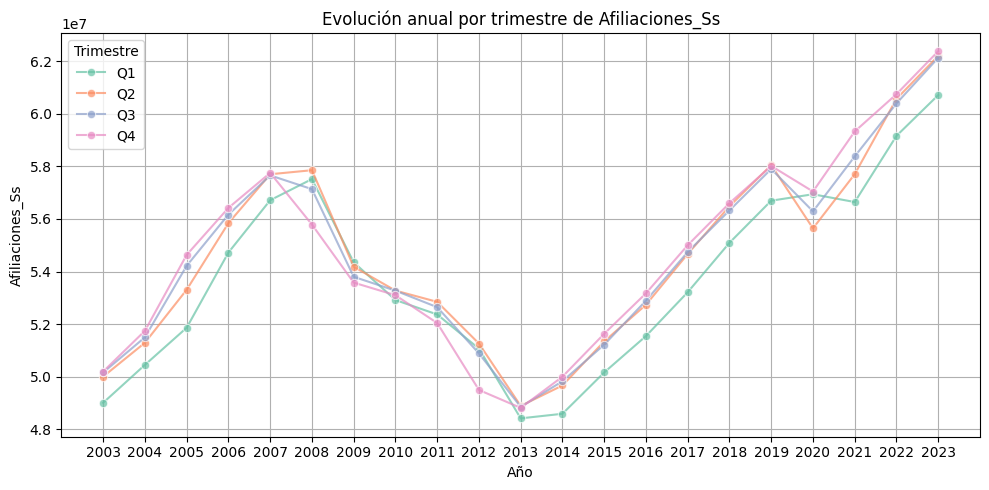

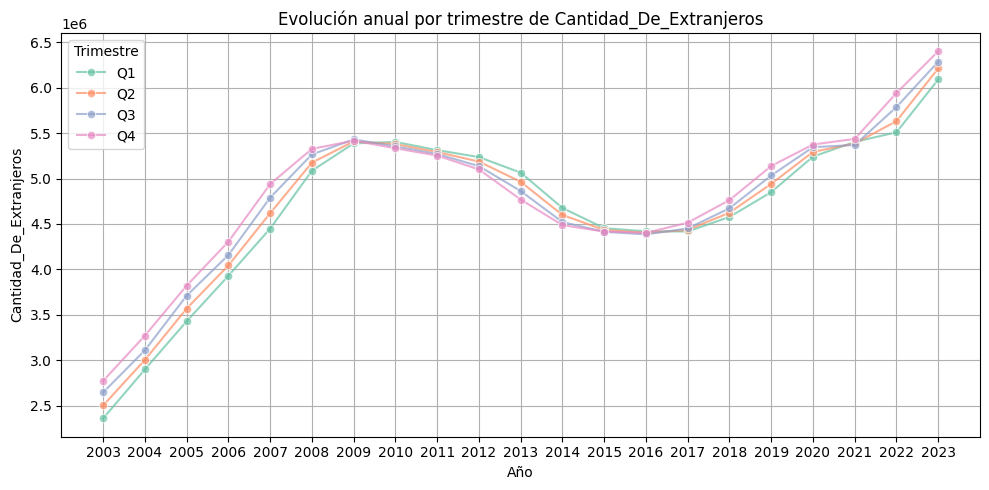

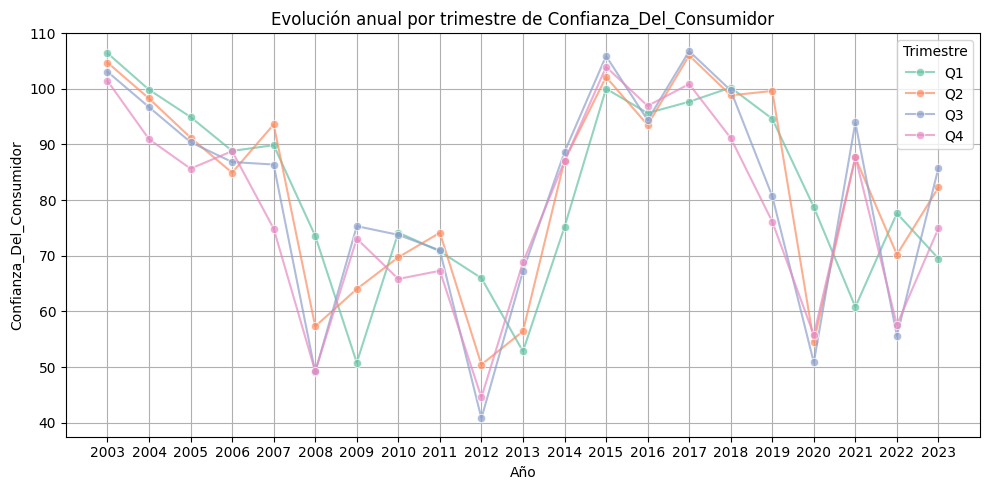

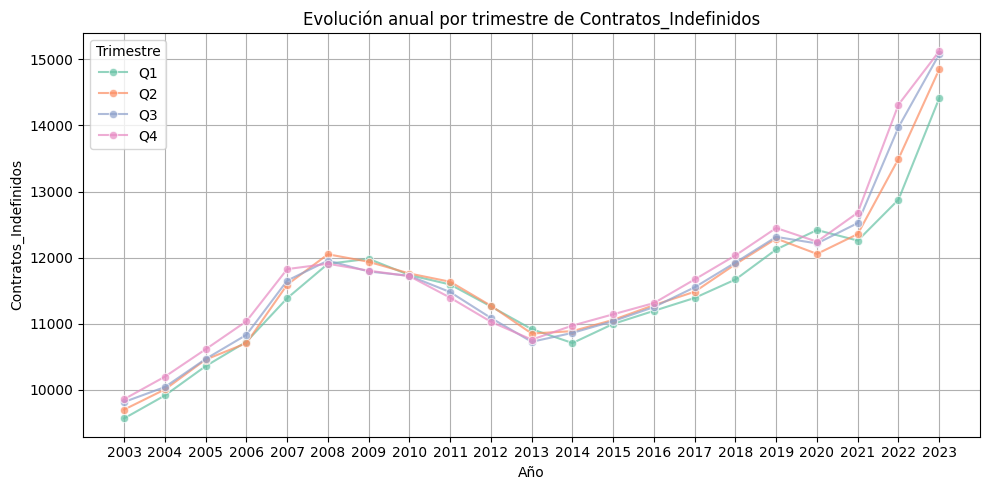

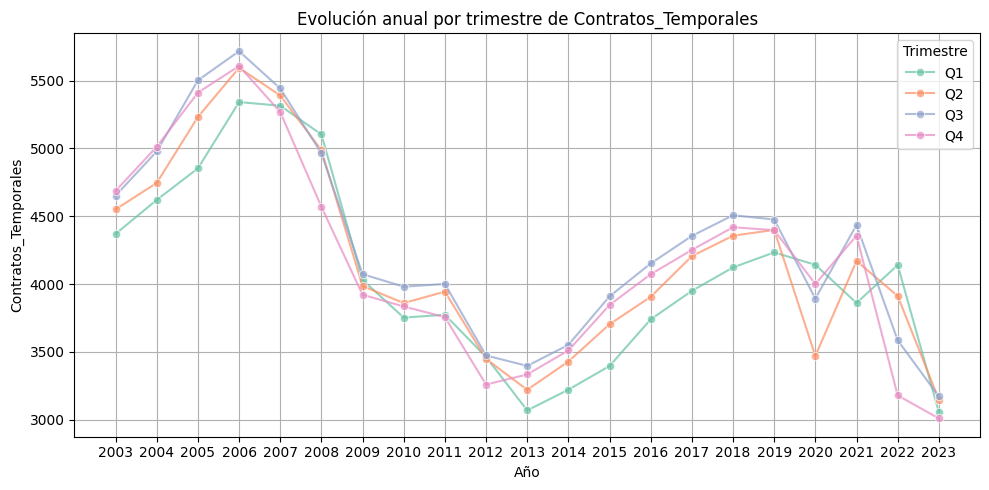

...

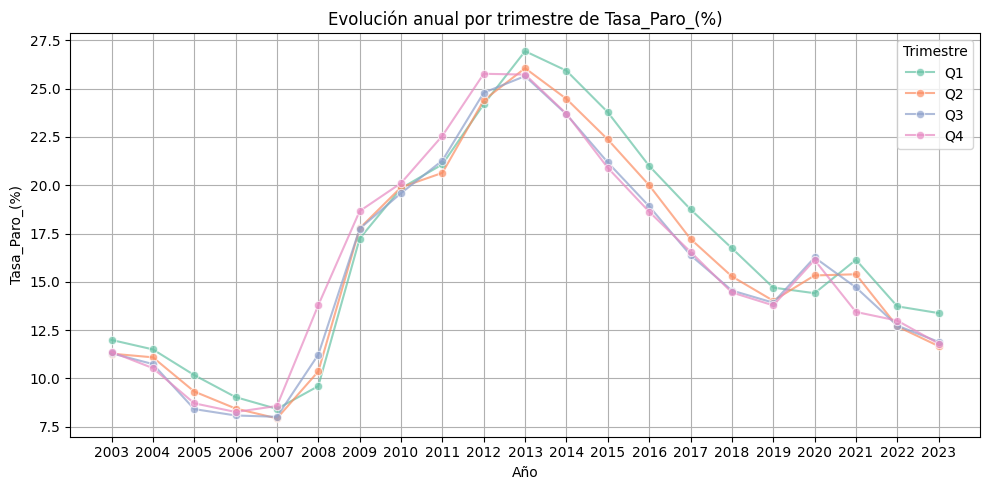

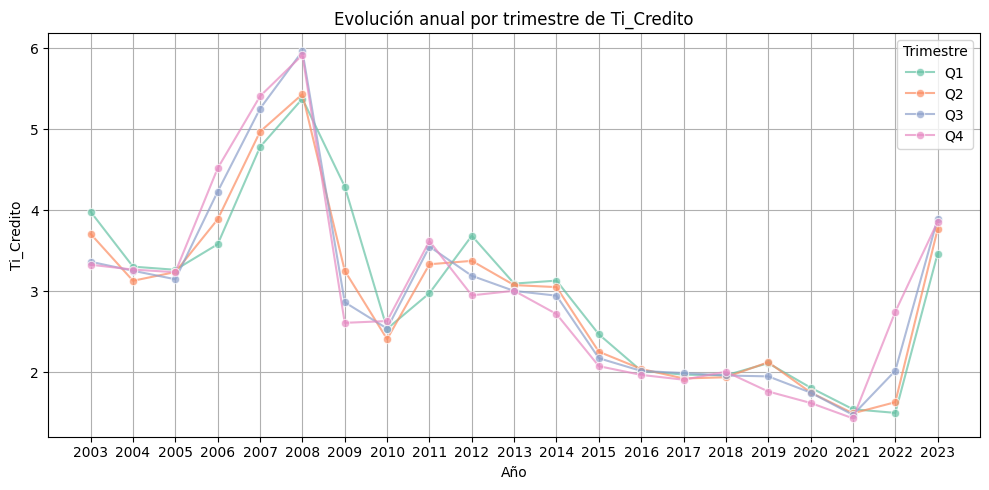

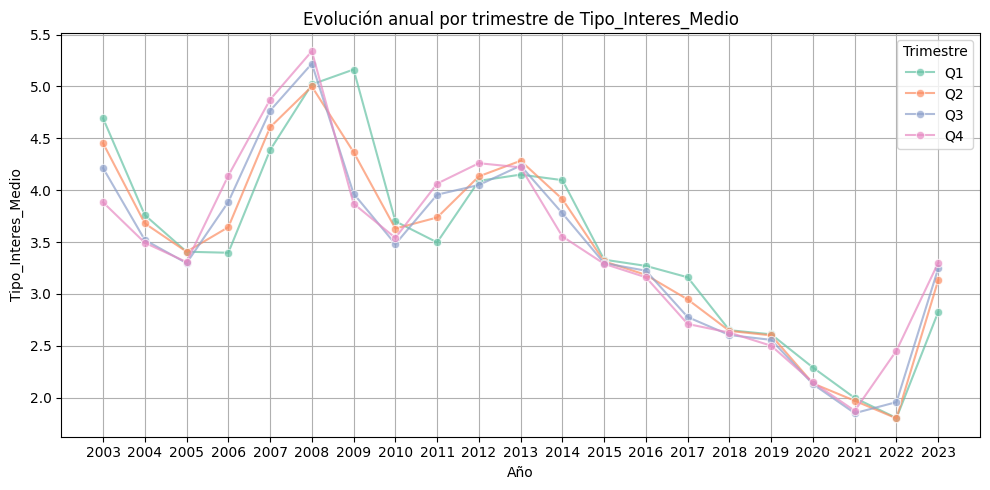

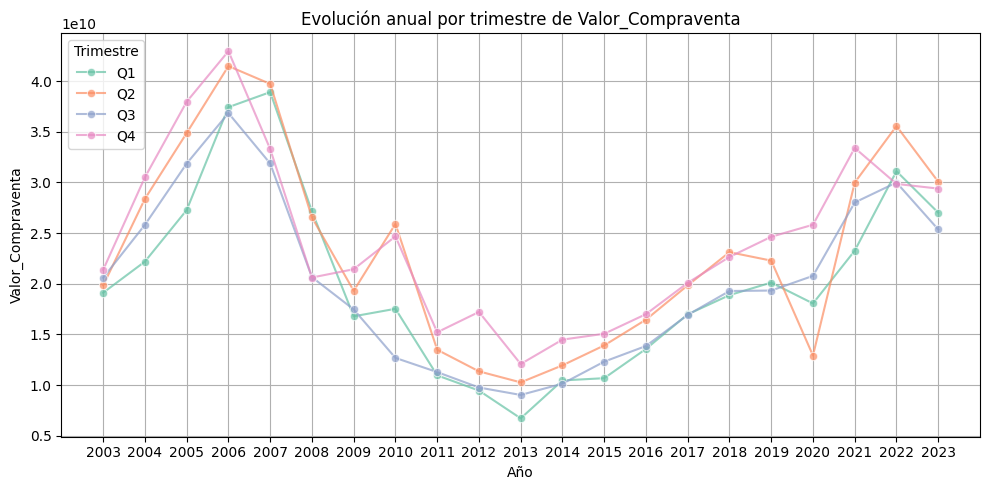

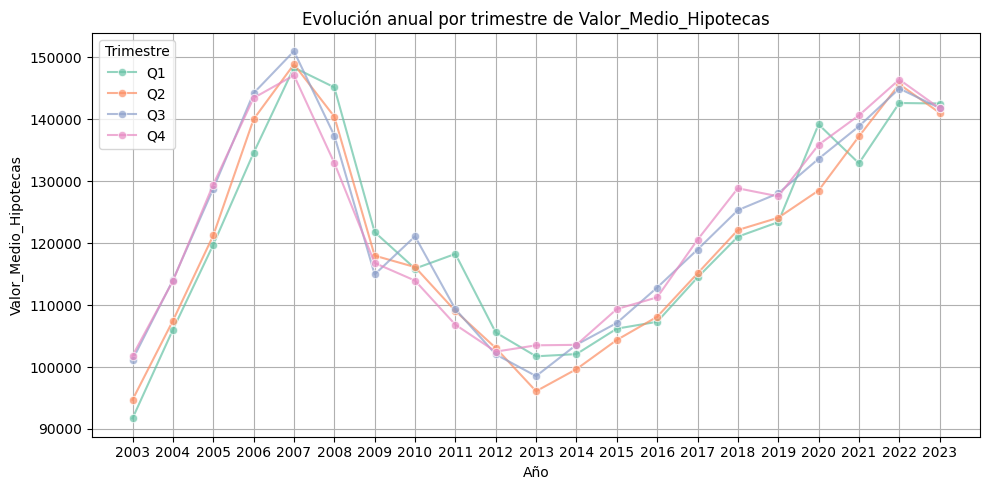

In [19]:
for col in cols:
    plt.figure(figsize=(10, 5))
    sns.lineplot(
        data=df_clean,
        x='Año',
        y=col,
        hue='Trimestre_simple',
        marker='o',
        palette='Set2',
        alpha=0.7
    )
    plt.title(f'Evolución anual por trimestre de {col}')
    plt.xlabel('Año')
    plt.ylabel(col)
    plt.grid(True)
    plt.legend(title='Trimestre')
    plt.xticks(df_clean['Año'].unique())
    plt.tight_layout()
    plt.show()

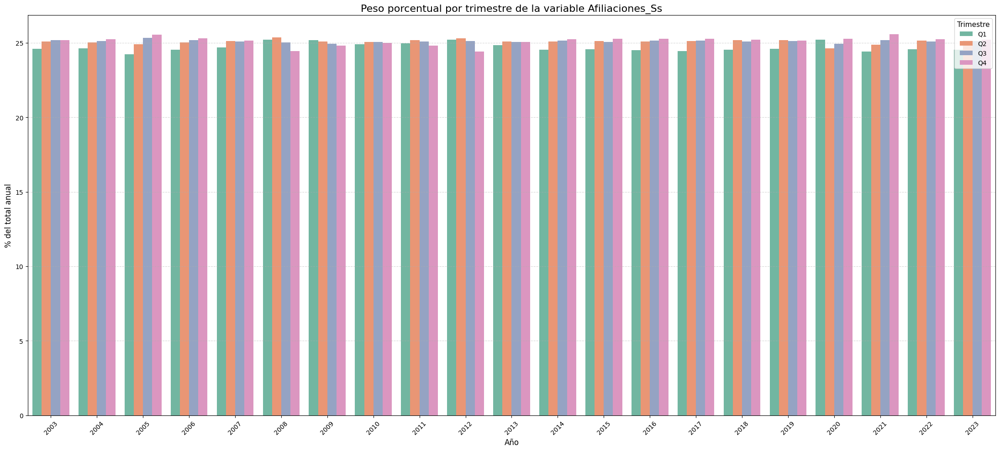

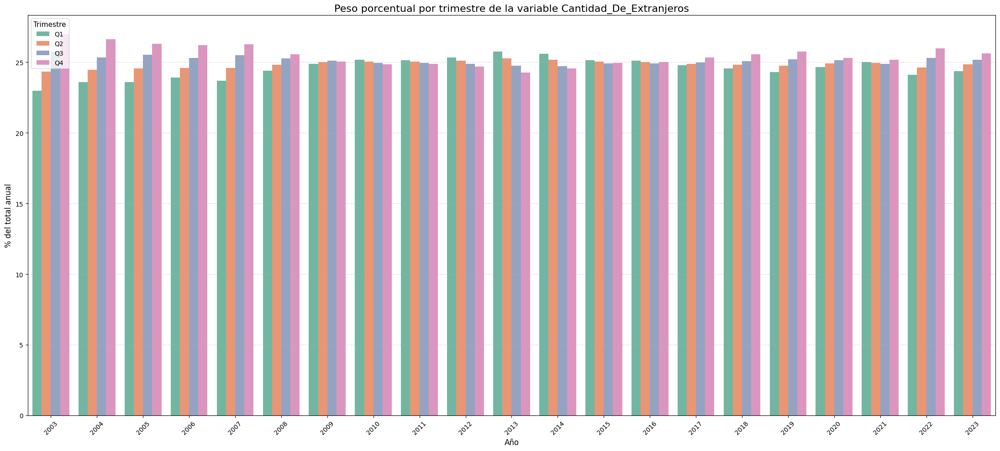

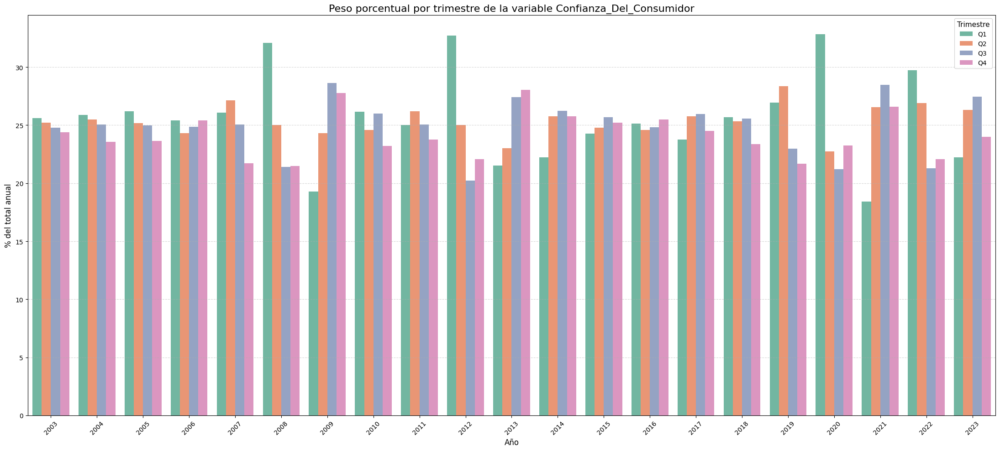

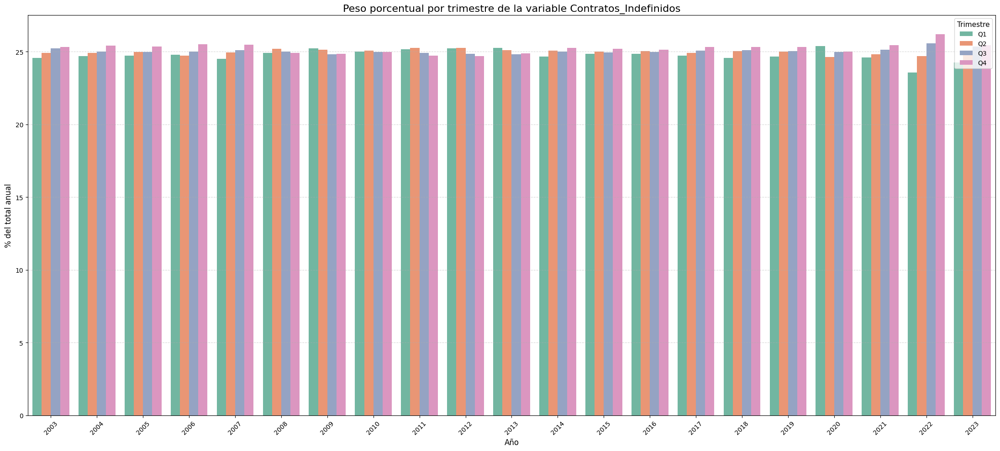

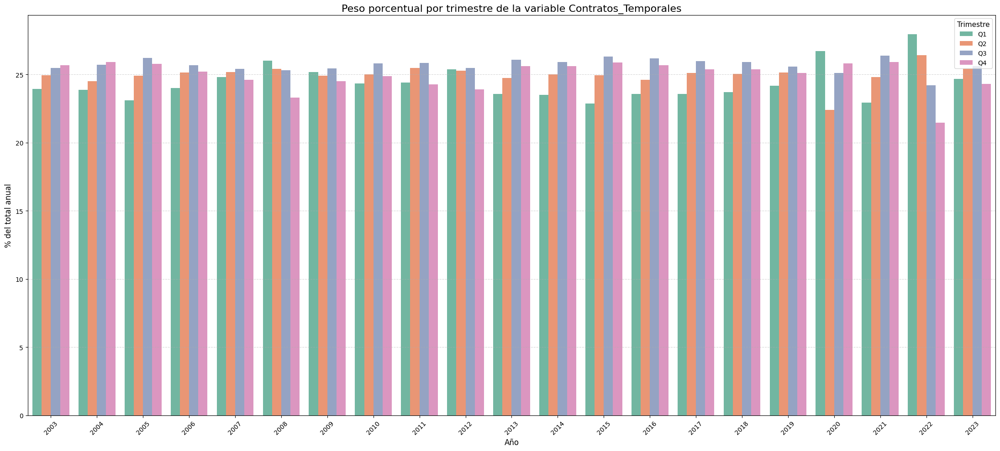

...

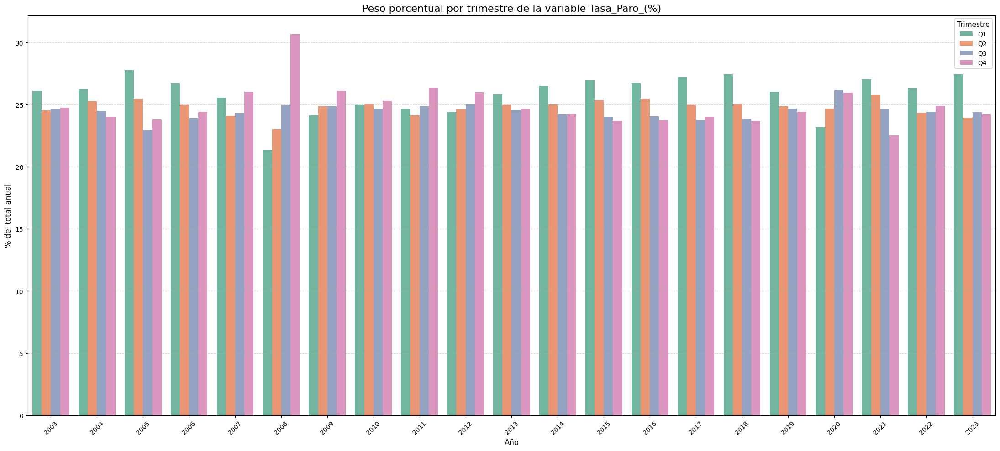

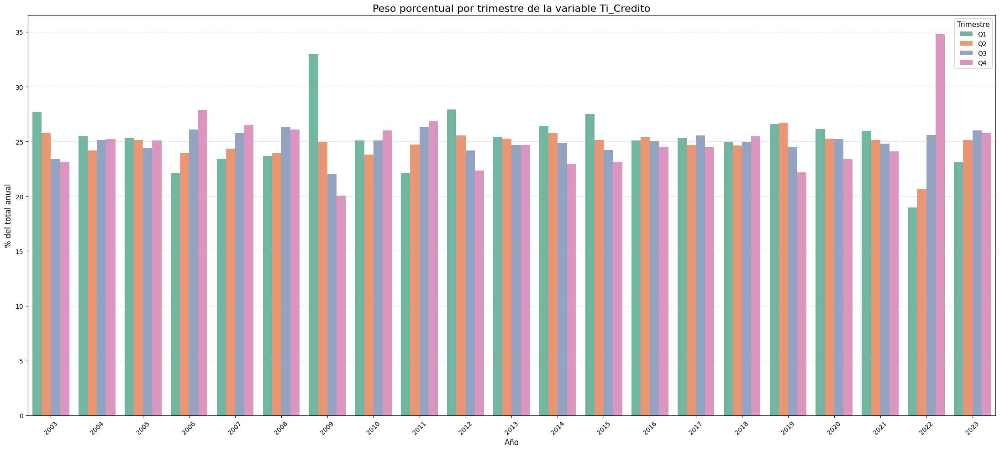

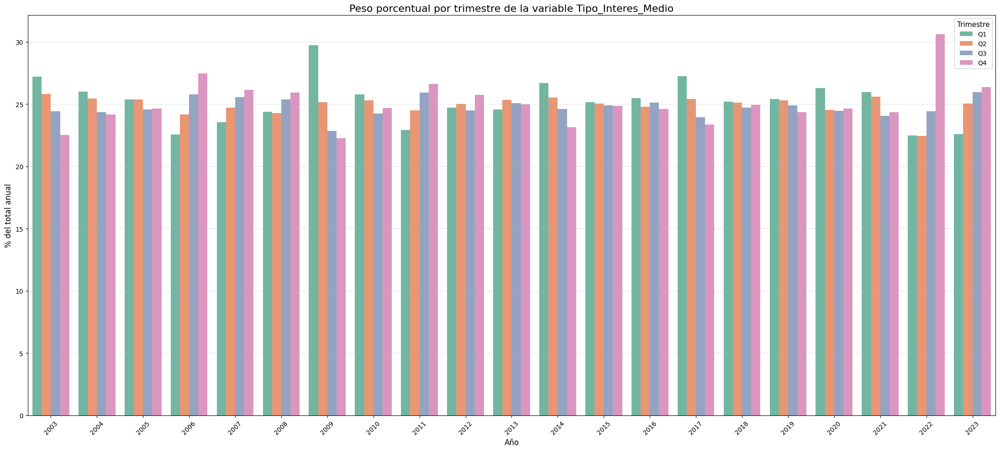

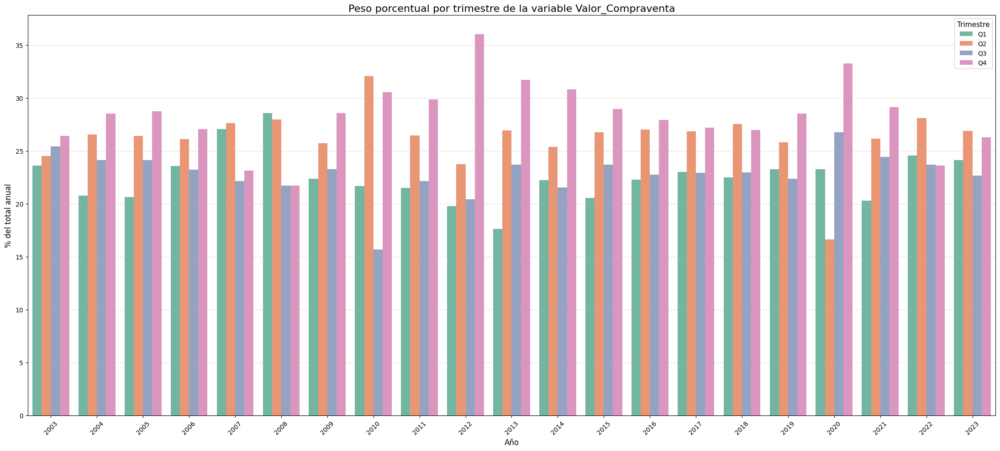

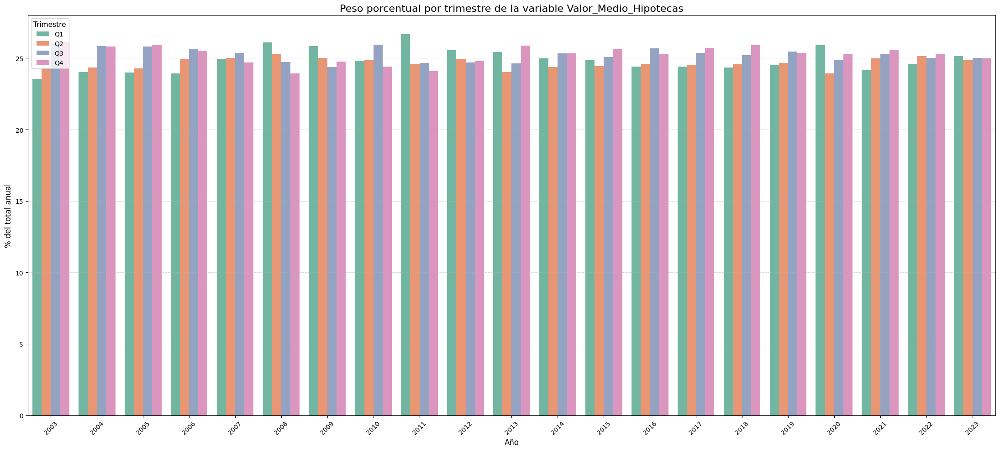

In [20]:
df_clean['Año'] = df_clean['Fecha'].dt.year
df_clean['Trimestre_simple'] = df_clean['Fecha'].dt.quarter.map({1: 'Q1', 2: 'Q2', 3: 'Q3', 4: 'Q4'})

cols = df_clean.select_dtypes(include=['float64', 'int64']).columns.difference(['Fecha_ordinal'])

for var in cols:
    df_peso = df_clean.groupby(['Año', 'Trimestre_simple'])[var].sum().reset_index()
    df_peso['Total_Anual'] = df_peso.groupby('Año')[var].transform('sum')
    df_peso['Proporcion'] = df_peso[var] / df_peso['Total_Anual'] * 100

    plt.figure(figsize=(22, 10))  # 🔍 Gráfico más ancho y alto
    sns.barplot(data=df_peso, x='Año', y='Proporcion', hue='Trimestre_simple', palette='Set2')

    plt.title(f'Peso porcentual por trimestre de la variable {var}', fontsize=16)
    plt.ylabel('% del total anual', fontsize=12)
    plt.xlabel('Año', fontsize=12)
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
    plt.legend(title='Trimestre', fontsize=10, title_fontsize=11)
    plt.tight_layout()
    plt.show()

# 4. Análisis de outliers

## Detección de outliers con Z-score

El Z-score es un método apropiado para identificar como outliers los valores con |Z| > 3 ; es decir, más de 3 desviaciones estándar de la media. De esta manera, podremos conocer cuántos outliers hay en cada variable. No obstante, es importante mencionar que es útil cuando las variables tienen una distribución normal o aproximadamente normal. 

In [21]:
num_vars = df_clean.select_dtypes(include=['float64', 'int64']).columns.difference(['Fecha_ordinal'])

print("\n📌 Outliers detectados con Z-score (|z| > 3):")
outliers_z = {}
for col in num_vars:
    z_scores = zscore(df_clean[col].dropna())
    outliers = np.where(np.abs(z_scores) > 3)[0]
    if len(outliers) > 0:
        outliers_z[col] = len(outliers)
        print(f"{col}: {len(outliers)} valores atípicos")


📌 Outliers detectados con Z-score (|z| > 3):
Contratos_Indefinidos: 2 valores atípicos
Ipc_%_Variación_Anual: 2 valores atípicos
Ipi_Variacion_Anual_Corregida: 3 valores atípicos
Ipi_Variacion_Anual_Original: 4 valores atípicos
Pib_Trimestral_No_Ajustado: 1 valores atípicos


## Detección de outliers con IQR

En este caso, usamos el método del rango intercuartílico (IQR) para detectar valores atípicos, que consiste en detectar como outliers cualquier valor fuera de [Q1 - 1.5·IQR, Q3 + 1.5·IQR]. Esta sí es una técnica robusta a la distribución, por lo que permite identificar correctamente outliers en variables sesgadas o que no siguen una distribución normal. 

In [22]:
print("\n📌 Outliers detectados con IQR:")
outliers_iqr = {}
for col in num_vars:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_clean[(df_clean[col] < lower_bound) | (df_clean[col] > upper_bound)]
    if not outliers.empty:
        outliers_iqr[col] = outliers.shape[0]
        print(f"{col}: {outliers.shape[0]} valores atípicos")


📌 Outliers detectados con IQR:
Cantidad_De_Extranjeros: 6 valores atípicos
Contratos_Indefinidos: 6 valores atípicos
Duracion_Media_Hipoteca: 12 valores atípicos
Importe_Hipotecas: 4 valores atípicos
Ipc_%_Variación_Anual: 3 valores atípicos
Ipi_Variacion_Anual_Corregida: 6 valores atípicos
Ipi_Variacion_Anual_Original: 6 valores atípicos
Pib_Trimestral_Ajustado: 6 valores atípicos
Pib_Trimestral_No_Ajustado: 7 valores atípicos
Poblacion: 15 valores atípicos
Renta_Disponible_Bruta: 2 valores atípicos
Ti_Credito: 2 valores atípicos


Como podemos comprobar, obtenemos más outliers con el método IQR, ya que como hemos comentado es más robusto frente a la forma de la distribución (especialmente en distribuciones sesgadas o con colas más largas).
Por esta razón, el método IQR suele detectar más outliers que Z-score. En nuestro caso, dado que estamos trabajando con datos económicos que no suelen tener una distribución normal (como comprobamos anteriormente), el método IQR será generalmente más útil y fiable

## Detección de variables con alta asimetría (skew)

A continuación, vamos a calcular el coeficiente de asimetría (skewness) para cada variable, que nos va a ayudar a identificar las variables que tienen una alta asimetría (|skew| > 1), pues estas pueden dificultar modelos lineales. Esto es así porque variables muy asimétricas violan el supuesto de normalidad de errores en modelos econométricos.
Además, vamos a aplicar distintas transformaciones a estas variables para ver si así conseguimos mejorar la kurtosis:
* **log1p:** ayuda a reducir la asimetría positiva (distribuciones sesgadas hacia la derecha) y a comprimir grandes valores para hacer la distribución más cercana a la normal. Es la función log(1 + x), donde log es el logaritmo natural, y se usa en lugar del logaritmo simple para evitar problemas cuando x es cero (porque log(0) no está definido).
* **sqrt:** es simplemente la raíz cuadrada de los valores de la variable y también se usa para reducir la asimetría positiva, pero suele ser menos agresiva que el logaritmo. Funciona bien para variables con distribución sesgada, especialmente cuando los valores son todos positivos y no demasiado grandes.
El objetivo de estas transformaciones es acercar la distribución de las variables a la normal, ya que muchas técnicas estadísticas (como la regresión lineal que realizaremos más adelante) asumen que las variables siguen una distribución aproximadamente normal.

📌 Variables con skew > 1 (candidatas a transformar):
['Duracion_Media_Hipoteca', 'Importe_Hipotecas', 'Contratos_Indefinidos', 'Poblacion']


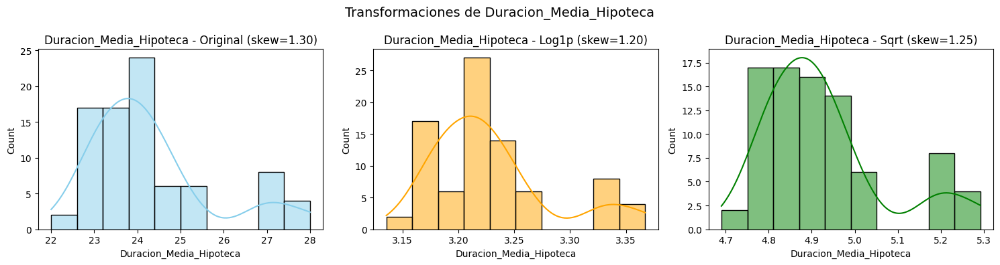

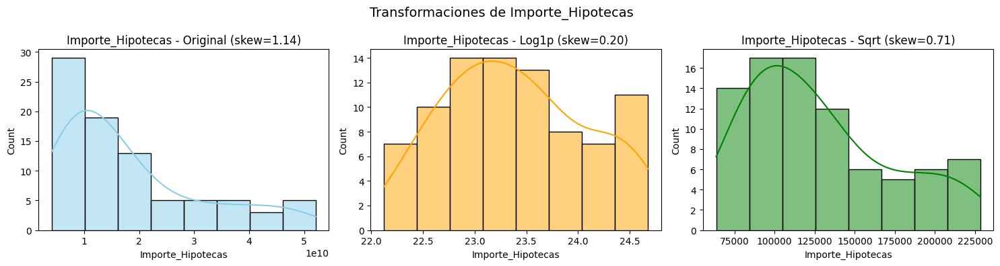

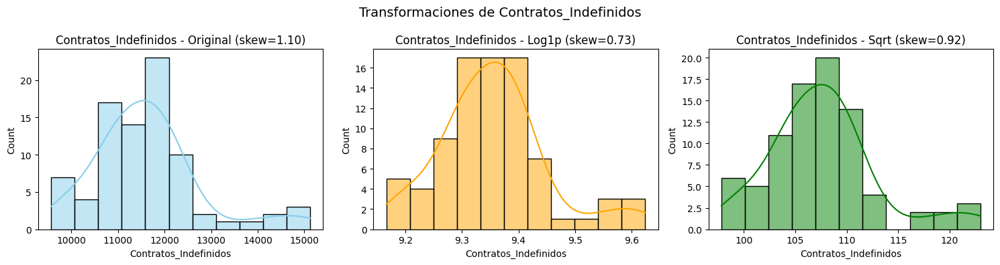

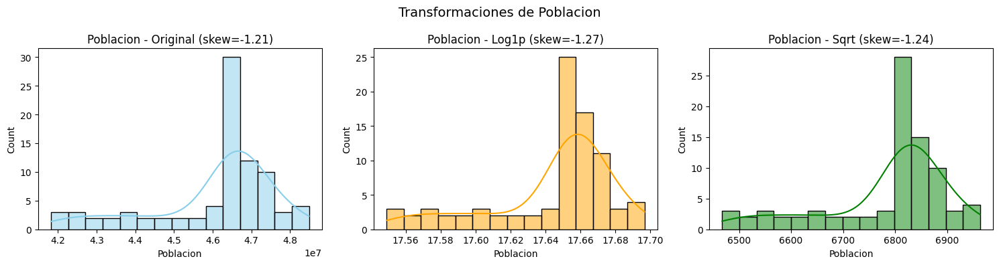

In [23]:
num_vars = df_clean.select_dtypes(include=[np.number]).columns.difference(['Fecha_ordinal', 'Numero_Hipotecas'])

skewed = df_clean[num_vars].apply(skew).sort_values(ascending=False)

threshold = 1  
high_skew_vars = skewed[abs(skewed) > threshold].index.tolist()

print("📌 Variables con skew > 1 (candidatas a transformar):")
print(high_skew_vars)

for col in high_skew_vars:
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))
    
    sns.histplot(df_clean[col], kde=True, ax=axs[0], color='skyblue')
    axs[0].set_title(f"{col} - Original (skew={df_clean[col].skew():.2f})")
    
    log_trans = np.log1p(df_clean[col])
    sns.histplot(log_trans, kde=True, ax=axs[1], color='orange')
    axs[1].set_title(f"{col} - Log1p (skew={log_trans.skew():.2f})")
    
    sqrt_trans = np.sqrt(df_clean[col])
    sns.histplot(sqrt_trans, kde=True, ax=axs[2], color='green')
    axs[2].set_title(f"{col} - Sqrt (skew={sqrt_trans.skew():.2f})")

    plt.suptitle(f'Transformaciones de {col}', fontsize=14)
    plt.tight_layout()
    plt.show()

Una vez que hemos visto las transformaciones gráficamente, creamos un nuevo dataframe con estas variables transformadas a través del método que mejore su kurtosis (es decir, donde sea más cercana a cero).

In [24]:
df_transformed = df_clean.copy()

threshold = 1

num_vars = df_clean.select_dtypes(include=[np.number]).columns.difference(['Fecha_ordinal', 'Numero_Hipotecas'])

skewed = df_clean[num_vars].apply(lambda x: x.skew()).sort_values(ascending=False)
high_skew_vars = skewed[abs(skewed) > threshold].index.tolist()

for col in high_skew_vars:
    original_skew = df_clean[col].skew()
    
    log_trans = np.log1p(df_clean[col])
    sqrt_trans = np.sqrt(df_clean[col])
    
    skew_log = log_trans.skew()
    skew_sqrt = sqrt_trans.skew()
    
    options = {
        'original': (df_clean[col], abs(original_skew)),
        'log1p': (log_trans, abs(skew_log)),
        'sqrt': (sqrt_trans, abs(skew_sqrt))
    }
    
    best_transform = min(options.items(), key=lambda x: x[1][1])
    
    if best_transform[1][1] < abs(original_skew):
        df_transformed[col] = best_transform[1][0]
        print(f"Variable '{col}' transformada con '{best_transform[0]}' (skew original: {original_skew:.2f} -> skew transformada: {best_transform[1][0].skew():.2f})")
    else:
        print(f"Variable '{col}' no se transforma (skew original: {original_skew:.2f})")

Variable 'Duracion_Media_Hipoteca' transformada con 'log1p' (skew original: 1.30 -> skew transformada: 1.20)
Variable 'Importe_Hipotecas' transformada con 'log1p' (skew original: 1.14 -> skew transformada: 0.20)
Variable 'Contratos_Indefinidos' transformada con 'log1p' (skew original: 1.10 -> skew transformada: 0.73)
Variable 'Poblacion' no se transforma (skew original: -1.21)


In [25]:
df_transformed.head()

,Fecha,Numero_Hipotecas,Importe_Hipotecas,Valor_Medio_Hipotecas,Tipo_Interes_Medio,Tasa_Paro_(%),Contratos_Indefinidos,Contratos_Temporales,Poblacion,Cantidad_De_Extranjeros,...,Interes_Variable_Hipotecas,Afiliaciones_Ss,Duracion_Media_Hipoteca,Numero_Compraventas,Valor_Compraventa,Confianza_Del_Consumidor,Fecha_ordinal,Trimestre_simple,Año,Periodo
0,2003-03-31,263600,23.908609,91713.17,4.693333,11.99,9.166284,4370.2,41827836,2362027,...,4.29,49006568,3.178054,183908.527902,1.910958e+10,106.382464,731305,Q1,2003,2003Q1
1,2003-06-30,247071,23.876021,94711.40,4.453333,11.28,9.180087,4550.9,42011027,2503949,...,4.29,50002323,3.178054,185520.576206,1.983594e+10,104.702077,731396,Q2,2003,2003Q2
2,2003-09-30,236977,23.900416,101184.20,4.213333,11.30,9.191912,4652.2,42196231,2647431,...,4.29,50159070,3.178054,187146.754903,2.058991e+10,103.048233,731488,Q3,2003,2003Q3
3,2003-12-31,241791,23.926874,101828.44,3.883333,11.37,9.196231,4687.5,42372802,2774802,...,4.29,50194767,3.178054,188787.187852,2.137254e+10,101.420513,731580,Q4,2003,2003Q4
4,2004-03-31,283170,24.125194,106020.83,3.760000,11.50,9.201895,4620.7,42547454,2900788,...,3.59,50448144,3.218876,190442.000000,2.218492e+10,99.818504,731671,Q1,2004,2004Q1


## Visualización de outliers

Es un complemento visual para la detección de outliers, basado en el método del rango intercuartílico (IQR)

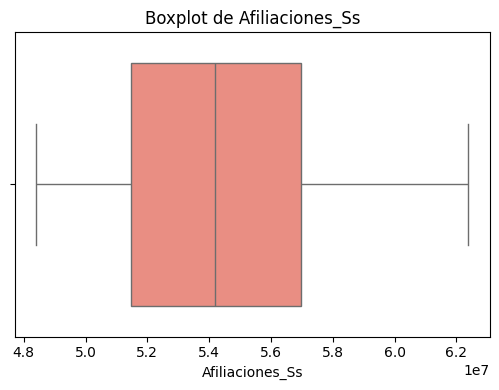

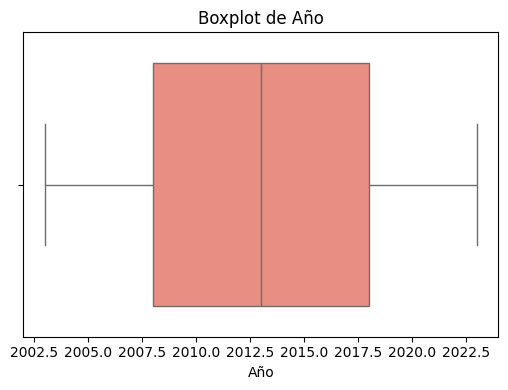

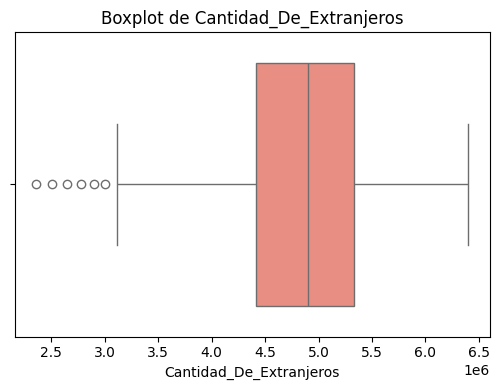

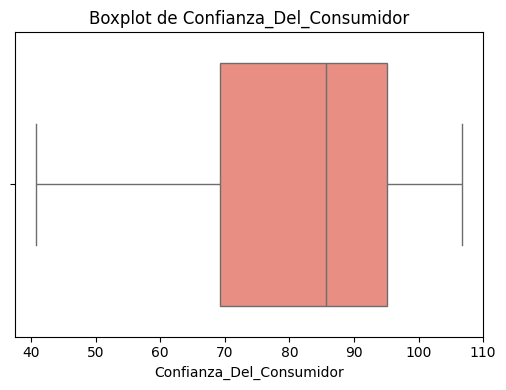

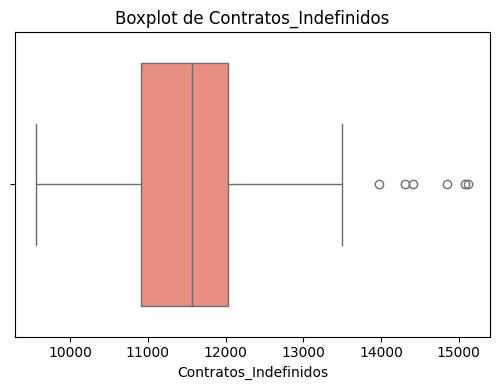

...

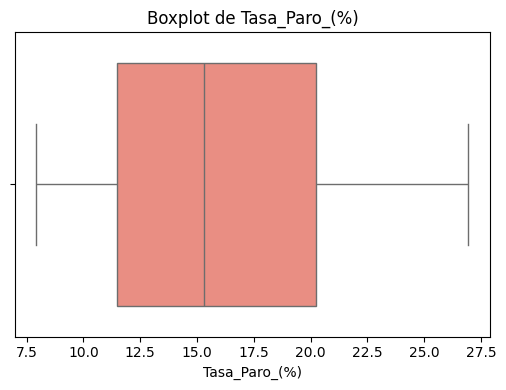

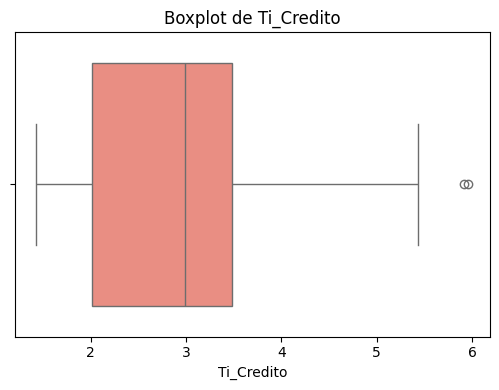

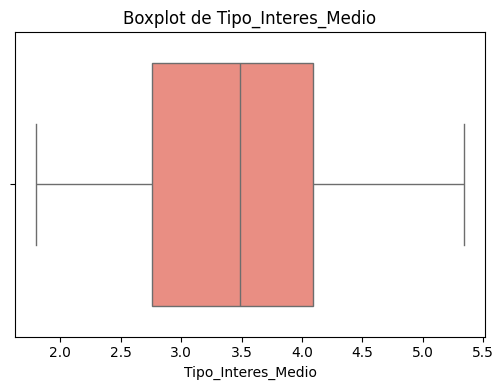

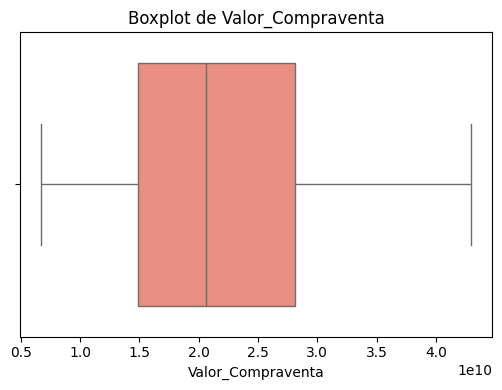

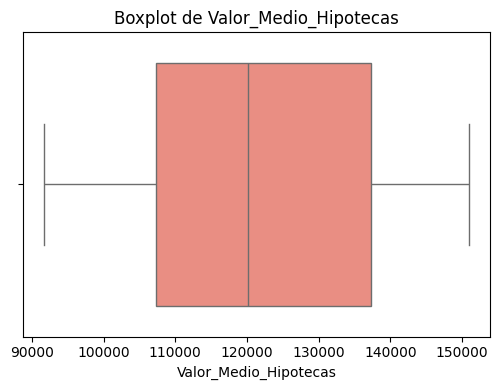

In [26]:
for col in num_vars:
    plt.figure(figsize=(10, 4))
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_clean[col], color='salmon')
    plt.title(f'Boxplot de {col}')
    
    plt.tight_layout()
    plt.show()


Comprobamos que las variables con outliers son las mismas que obteníamos en el apartado de Detección de outliers con IQR

No obstante, vamos a volver a calcular los outliers con IQR y gráficamente pero para el nuevo df_transformed que hemos obtenido tras las transformaciones de variables con kurtosis elevada

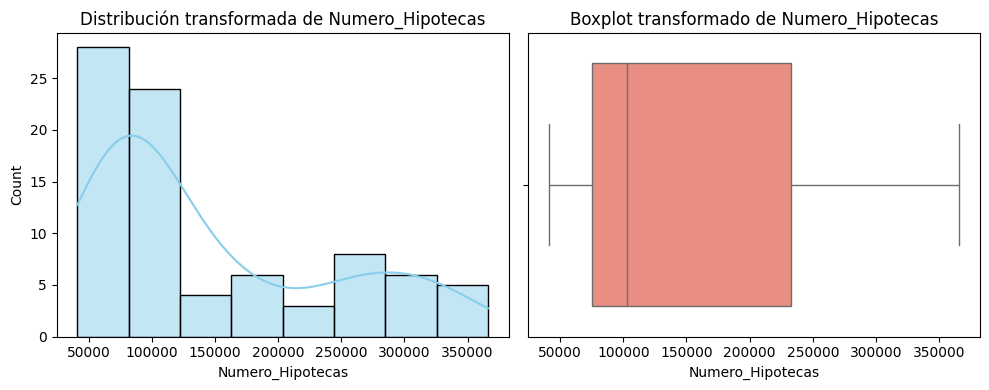

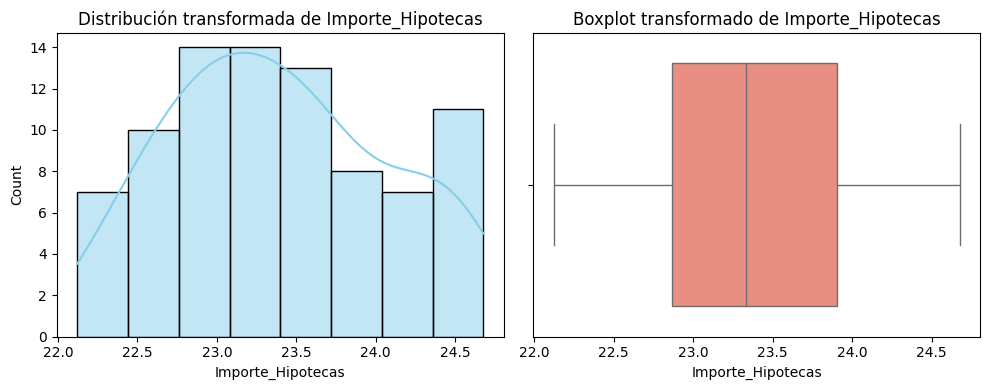

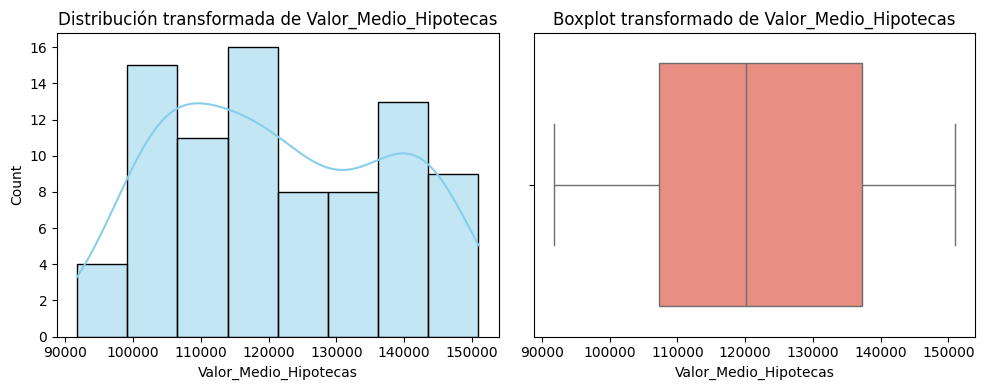

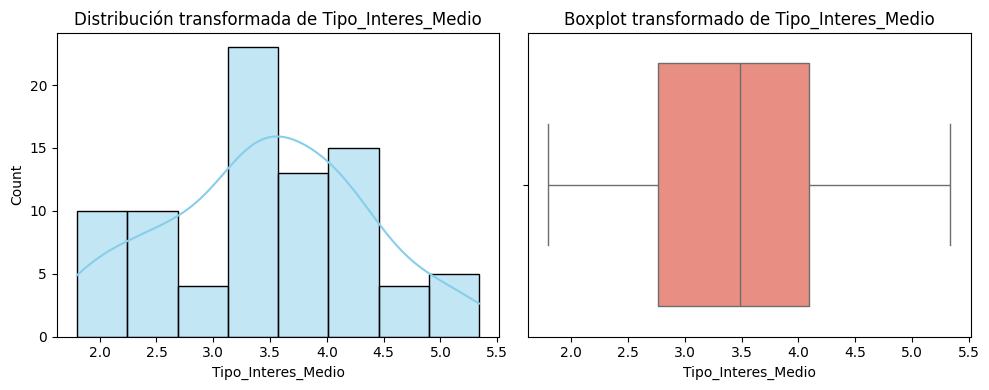

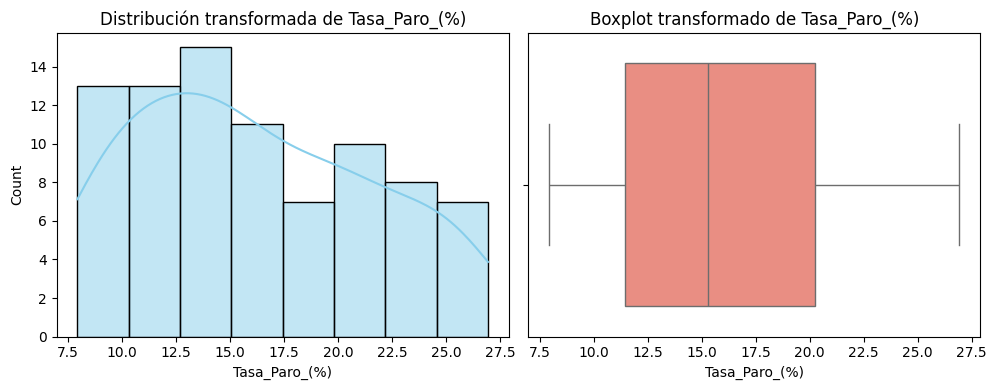

...

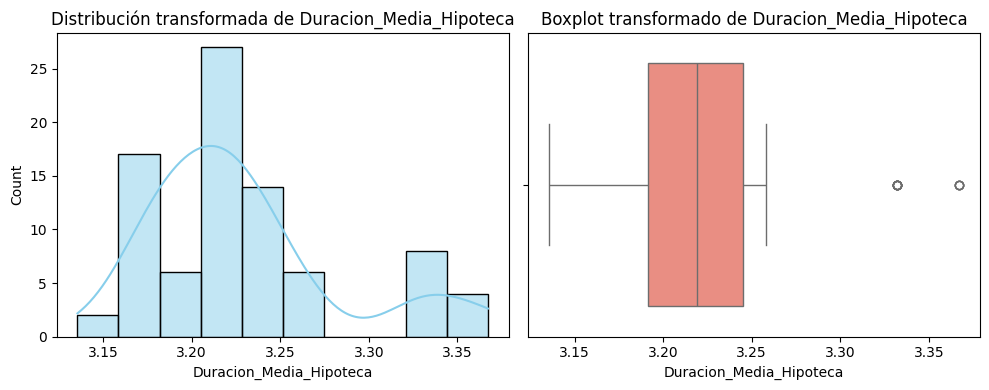

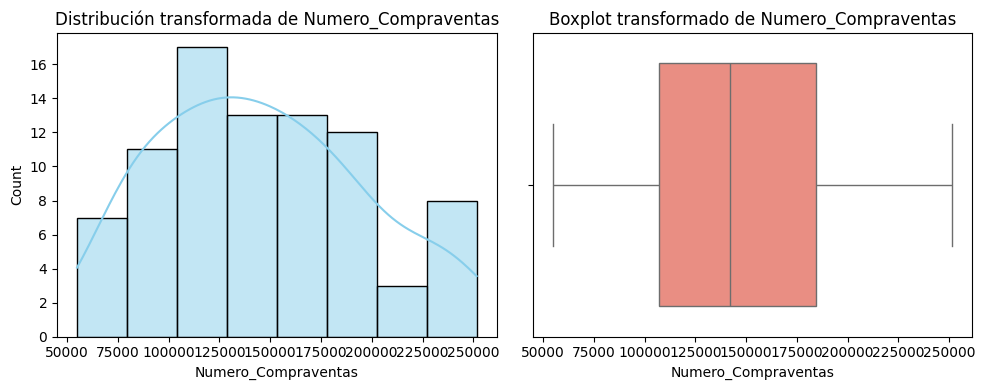

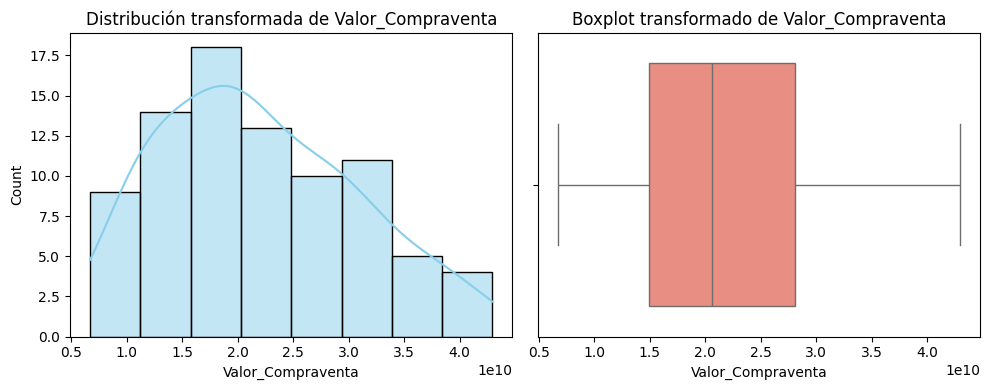

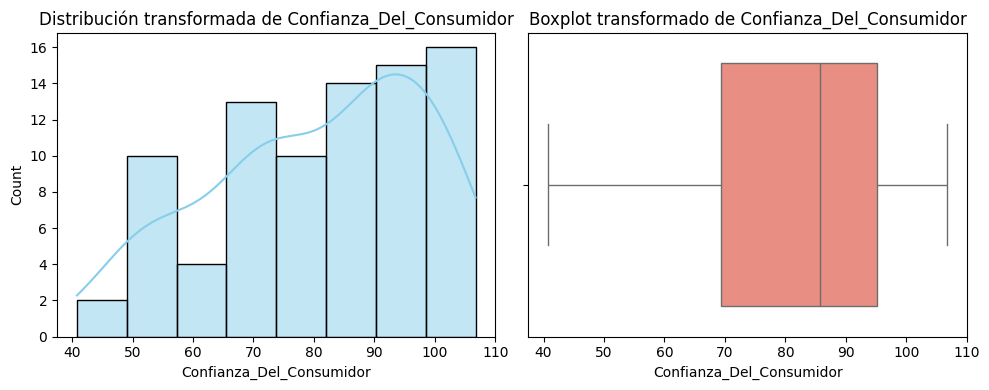

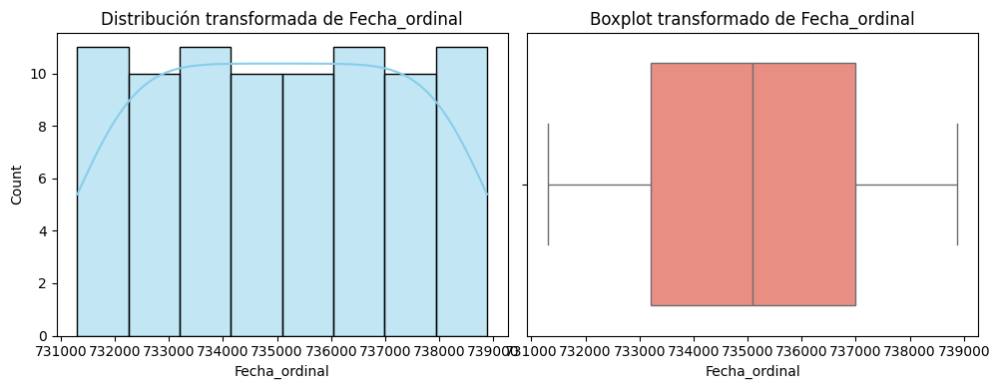

In [27]:
num_vars = df_transformed.select_dtypes(include=['float64', 'int64']).columns.tolist()

for col in num_vars:
    plt.figure(figsize=(10, 4))
    
    plt.subplot(1, 2, 1)
    sns.histplot(df_transformed[col], kde=True, color='skyblue')
    plt.title(f'Distribución transformada de {col}')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_transformed[col], color='salmon')
    plt.title(f'Boxplot transformado de {col}')
    
    plt.tight_layout()
    plt.show()


In [28]:
print("\n📌 Outliers detectados con IQR en df_transformed:")
outliers_iqr_transformed = {}

for col in num_vars:
    Q1 = df_transformed[col].quantile(0.25)
    Q3 = df_transformed[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df_transformed[(df_transformed[col] < lower_bound) | (df_transformed[col] > upper_bound)]
    if not outliers.empty:
        outliers_iqr_transformed[col] = outliers.shape[0]
        print(f"{col}: {outliers.shape[0]} valores atípicos")


📌 Outliers detectados con IQR en df_transformed:
Contratos_Indefinidos: 6 valores atípicos
Poblacion: 15 valores atípicos
Cantidad_De_Extranjeros: 6 valores atípicos
Pib_Trimestral_Ajustado: 6 valores atípicos
Pib_Trimestral_No_Ajustado: 7 valores atípicos
Ipi_Variacion_Anual_Original: 6 valores atípicos
Ipi_Variacion_Anual_Corregida: 6 valores atípicos
Ti_Credito: 2 valores atípicos
Renta_Disponible_Bruta: 2 valores atípicos
Ipc_%_Variación_Anual: 3 valores atípicos
Duracion_Media_Hipoteca: 12 valores atípicos


Vemos que con estas transformaciones hemos reducido una variable que anteriormente presentaba outliers (antes eran 12 y ahora 11). Esta variable es 
es Importe_Hipotecas

## Tratamiento de outliers

Es necesario realizar un tratamiento de los outliers de nuestras variables para los posteriores modelos de regresión lineal múltiples o de series temporales, ya que un solo valor atípico puede tener un gran efecto en la estimación de los coeficientes o distorsionar los modelos. Para ello, vamos a utilizar la técnica de Winsorización (recorte de valores extremos), usando los límites del IQR para asegurarnos de que ningún valor queda por encimao por debajo del rango intercuartílico.

In [29]:
iqr_winsorized_df = df_transformed.copy()

vars_num = df_transformed.select_dtypes(include='number').columns.drop(['Numero_Hipotecas', 'Fecha_ordinal', 'Año'])

for col in vars_num:
    col_data = df_transformed[col].dropna()
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    iqr_winsorized_df[col] = df_transformed[col].clip(lower=lower_bound, upper=upper_bound)

print("✅ Winsorización corregida y aplicada sin warnings.")



✅ Winsorización corregida y aplicada sin warnings.


Comprobamos, una vez aplicada la técnica de Winsorización, cuántos outliers tenemos ahora:

In [30]:
print("\n📌 Outliers con IQR tras winsorización:")
outliers_iqr_winsor = {}

for col in num_vars:
    Q1 = iqr_winsorized_df[col].quantile(0.25)
    Q3 = iqr_winsorized_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = iqr_winsorized_df[(iqr_winsorized_df[col] < lower_bound) | (iqr_winsorized_df[col] > upper_bound)]
    
    if not outliers.empty:
        outliers_iqr_winsor[col] = outliers.shape[0]
        print(f"{col}: {outliers.shape[0]} valores atípicos")
    else:
        print(f"{col}: 0 valores atípicos")


📌 Outliers con IQR tras winsorización:
Numero_Hipotecas: 0 valores atípicos
Importe_Hipotecas: 0 valores atípicos
Valor_Medio_Hipotecas: 0 valores atípicos
Tipo_Interes_Medio: 0 valores atípicos
Tasa_Paro_(%): 0 valores atípicos
Contratos_Indefinidos: 0 valores atípicos
Contratos_Temporales: 0 valores atípicos
Poblacion: 0 valores atípicos
Cantidad_De_Extranjeros: 0 valores atípicos
Pib_Trimestral_Ajustado: 0 valores atípicos
Pib_Trimestral_No_Ajustado: 0 valores atípicos
Ipi_Variacion_Anual_Original: 0 valores atípicos
Ipi_Variacion_Anual_Corregida: 0 valores atípicos
Precio_M2_Vivienda: 0 valores atípicos
Euribor_12_Meses: 0 valores atípicos
Mro_Rate: 0 valores atípicos
Ti_Credito: 0 valores atípicos
Renta_Disponible_Bruta: 0 valores atípicos
Ipc_%_Variación_Anual: 0 valores atípicos
Interes_Fijo_Hipotecas: 0 valores atípicos
Interes_Variable_Hipotecas: 0 valores atípicos
Afiliaciones_Ss: 0 valores atípicos
Duracion_Media_Hipoteca: 0 valores atípicos
Numero_Compraventas: 0 valores a

Como vemos, ya ninguna variable presenta outliers

# 5. Correlaciones y análisis bivariante

## Correlación entre variables explicativas

El objetivo es detectar colinealidad (dos o más variables muy correlacionadas entre sí) que pueda perjudicar los posteriores modelos. Vamos a analizarlo a través de una matriz de correlaciones. 

Si dos variables tienen correlación > 0.7 o < -0.7, puede haber problema de multicolinealidad. En este caso, conviene eliminar una, combinarlas o usar técnicas como PCA.

In [31]:
vars_exp = iqr_winsorized_df.columns.drop(['Numero_Hipotecas', 'Fecha', 'Fecha_ordinal', 'Trimestre_simple', 'Año', 'Periodo'])

corr_pearson = iqr_winsorized_df[vars_exp].corr(method='pearson')

corr_spearman = iqr_winsorized_df[vars_exp].corr(method='spearman')

print("Matriz de correlación Pearson (variables explicativas):")
print(corr_pearson)

print("\nMatriz de correlación Spearman (variables explicativas):")
print(corr_spearman)

Matriz de correlación Pearson (variables explicativas):
                               Importe_Hipotecas  Valor_Medio_Hipotecas  \
Importe_Hipotecas                       1.000000               0.554021   
Valor_Medio_Hipotecas                   0.554021               1.000000   
Tipo_Interes_Medio                      0.225704              -0.272000   
Tasa_Paro_(%)                          -0.873006              -0.689419   
Contratos_Indefinidos                  -0.112153               0.662962   
Contratos_Temporales                    0.816110               0.391151   
Poblacion                              -0.632689               0.177489   
Cantidad_De_Extranjeros                -0.300514               0.427521   
Pib_Trimestral_Ajustado                -0.252105               0.576205   
Pib_Trimestral_No_Ajustado             -0.266238               0.556155   
Ipi_Variacion_Anual_Original            0.117703               0.071244   
Ipi_Variacion_Anual_Corregida           0.13

Resumen de las variables que están mñas correlacionadas (<-0.7 y >0.7) en función del método utilizado: 

In [32]:
vars_exp = iqr_winsorized_df.columns.drop(['Numero_Hipotecas', 'Fecha', 'Fecha_ordinal', 'Trimestre_simple', 'Año', 'Periodo'])

corr_pearson = iqr_winsorized_df[vars_exp].corr(method='pearson')

corr_spearman = iqr_winsorized_df[vars_exp].corr(method='spearman')

def get_strong_corrs(corr_matrix, threshold=0.7):
    strong_pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            val = corr_matrix.iloc[i, j]
            if abs(val) >= threshold:
                var1 = corr_matrix.index[i]
                var2 = corr_matrix.columns[j]
                strong_pairs.append((var1, var2, val))
    return strong_pairs

threshold = 0.7

strong_pearson = get_strong_corrs(corr_pearson, threshold)
strong_spearman = get_strong_corrs(corr_spearman, threshold)

print(f"Variables explicativas correlacionadas (|correlación| ≥ {threshold}) según Pearson:")
if strong_pearson:
    for v1, v2, val in strong_pearson:
        print(f" - {v1} y {v2}: correlación = {val:.2f}")
else:
    print(" - Ninguna pareja con correlación fuerte.")

print(f"\nVariables explicativas correlacionadas (|correlación| ≥ {threshold}) según Spearman:")
if strong_spearman:
    for v1, v2, val in strong_spearman:
        print(f" - {v1} y {v2}: correlación = {val:.2f}")
else:
    print(" - Ninguna pareja con correlación fuerte.")

Variables explicativas correlacionadas (|correlación| ≥ 0.7) según Pearson:
 - Importe_Hipotecas y Tasa_Paro_(%): correlación = -0.87
 - Importe_Hipotecas y Contratos_Temporales: correlación = 0.82
 - Importe_Hipotecas y Mro_Rate: correlación = 0.77
 - Importe_Hipotecas y Duracion_Media_Hipoteca: correlación = 0.78
 - Importe_Hipotecas y Numero_Compraventas: correlación = 0.80
 - Importe_Hipotecas y Valor_Compraventa: correlación = 0.80
 - Valor_Medio_Hipotecas y Precio_M2_Vivienda: correlación = 0.74
 - Valor_Medio_Hipotecas y Afiliaciones_Ss: correlación = 0.91
 - Valor_Medio_Hipotecas y Duracion_Media_Hipoteca: correlación = 0.76
 - Valor_Medio_Hipotecas y Valor_Compraventa: correlación = 0.75
 - Tipo_Interes_Medio y Ti_Credito: correlación = 0.85
 - Tipo_Interes_Medio y Interes_Fijo_Hipotecas: correlación = 0.93
 - Tipo_Interes_Medio y Interes_Variable_Hipotecas: correlación = 0.97
 - Tasa_Paro_(%) y Contratos_Temporales: correlación = -0.77
 - Tasa_Paro_(%) y Numero_Compraventas: 

Gráficamente:

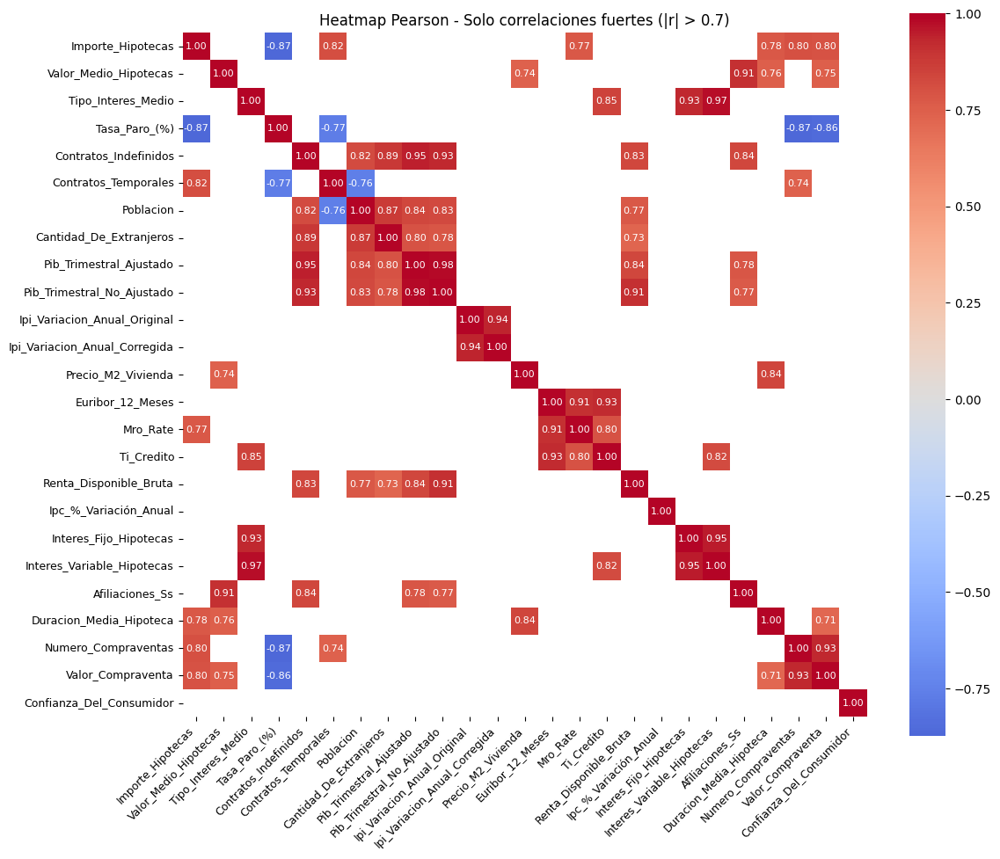

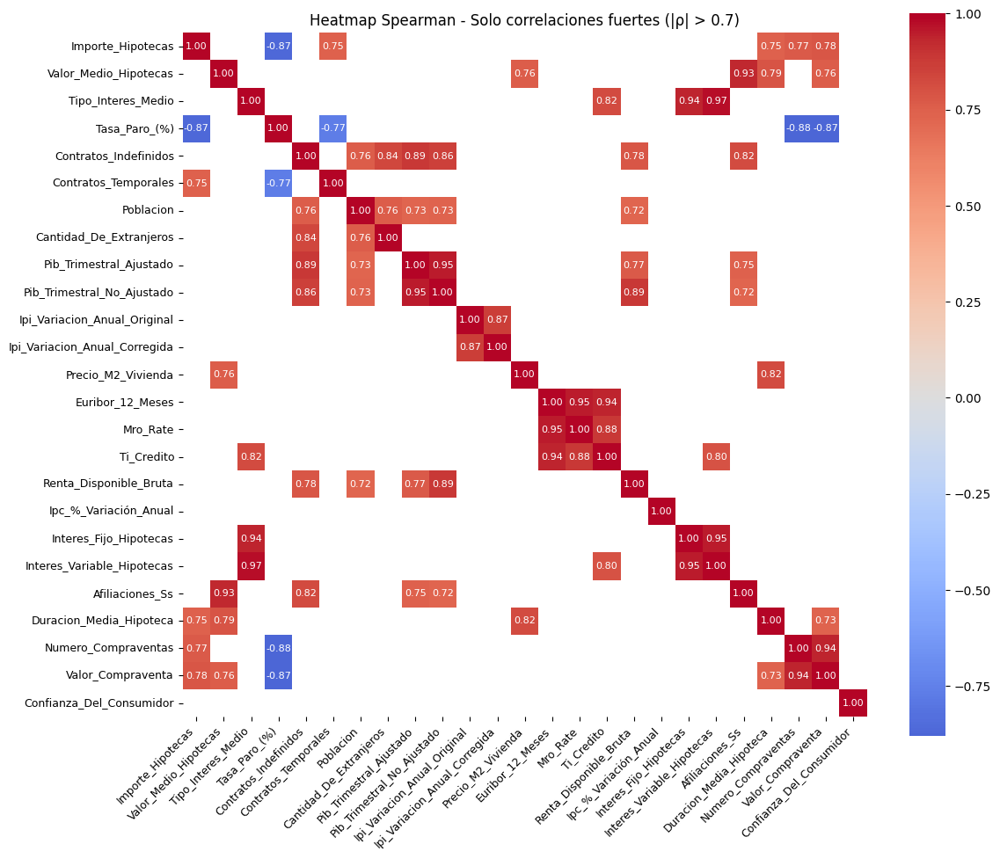

In [33]:
corr_pearson_strong = corr_pearson.copy()
corr_spearman_strong = corr_spearman.copy()

# Pearson
mask_pearson = (corr_pearson_strong.abs() < 0.7) | (corr_pearson_strong.isna())

plt.figure(figsize=(12, 10))
sns.heatmap(corr_pearson_strong, mask=mask_pearson, annot=True, cmap='coolwarm', center=0, square=True, fmt=".2f", annot_kws={"size": 8})
plt.title('Heatmap Pearson - Solo correlaciones fuertes (|r| > 0.7)')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.show()

# Spearman
mask_spearman = (corr_spearman_strong.abs() < 0.7) | (corr_spearman_strong.isna())

plt.figure(figsize=(12, 10))
sns.heatmap(corr_spearman_strong, mask=mask_spearman, annot=True, cmap='coolwarm', center=0, square=True, fmt=".2f", annot_kws={"size": 8})
plt.title('Heatmap Spearman - Solo correlaciones fuertes (|ρ| > 0.7)')
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.show()

## Correlación con la variable objetivo

A continuación, vamos a estudiar la correlación de todas las variablex explicativas con la variable objetivo. De nuevo, usaremos tanto el método de Pearson como el método de Spearman para ver las diferencias: 

In [34]:
# Lista de variables numéricas (excepto la variable objetivo)
vars_exp = iqr_winsorized_df.select_dtypes(include='number').columns.drop(['Numero_Hipotecas', 'Fecha_ordinal', 'Año'])

# Correlación de cada variable con la variable objetivo
corr_pearson_y = iqr_winsorized_df[vars_exp].corrwith(iqr_winsorized_df['Numero_Hipotecas'], method='pearson')
corr_spearman_y = iqr_winsorized_df[vars_exp].corrwith(iqr_winsorized_df['Numero_Hipotecas'], method='spearman')

# Mostrar resultados
print("📊 Correlación Pearson con 'Numero_Hipotecas':\n")
print(corr_pearson_y.sort_values(ascending=False))

print("\n📊 Correlación Spearman con 'Numero_Hipotecas':\n")
print(corr_spearman_y.sort_values(ascending=False))

# Comparación lado a lado
correlation_comparison = pd.DataFrame({
    'Pearson': corr_pearson_y,
    'Spearman': corr_spearman_y
}).sort_values(by='Pearson', ascending=False)

print("\n📋 Comparación de correlaciones con 'Numero_Hipotecas':\n")
print(correlation_comparison)

📊 Correlación Pearson con 'Numero_Hipotecas':

Importe_Hipotecas                0.944256
Contratos_Temporales             0.840968
Mro_Rate                         0.815825
Numero_Compraventas              0.793368
Valor_Compraventa                0.709495
Euribor_12_Meses                 0.677857
Duracion_Media_Hipoteca          0.675846
Ti_Credito                       0.576598
Precio_M2_Vivienda               0.472683
Interes_Variable_Hipotecas       0.418711
Ipc_%_Variación_Anual            0.402319
Tipo_Interes_Medio               0.368688
Valor_Medio_Hipotecas            0.330735
Interes_Fijo_Hipotecas           0.233259
Confianza_Del_Consumidor         0.217765
Ipi_Variacion_Anual_Corregida    0.184646
Ipi_Variacion_Anual_Original     0.178633
Afiliaciones_Ss                  0.080779
Contratos_Indefinidos           -0.393566
Renta_Disponible_Bruta          -0.495540
Pib_Trimestral_Ajustado         -0.499242
Pib_Trimestral_No_Ajustado      -0.507156
Cantidad_De_Extranjeros      

Vemos con un heatmap la correlación mediante Pearson con la variable objetivo:

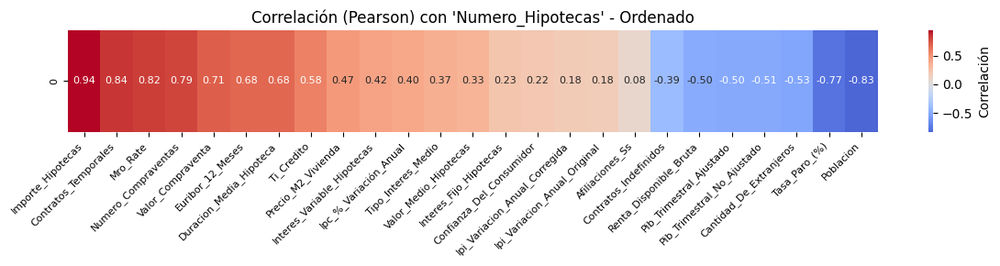

In [35]:
corr_pearson_y_sorted = corr_pearson_y.sort_values(ascending=False)
plt.figure(figsize=(12, 3))
sns.heatmap(corr_pearson_y_sorted.to_frame().T, cmap='coolwarm', center=0,
            annot=True, fmt=".2f", cbar_kws={'label': 'Correlación'},
            annot_kws={"size": 8})
plt.title("Correlación (Pearson) con 'Numero_Hipotecas' - Ordenado", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()


Vemos con un heatmap la correlación mediante Spearman con la variable objetivo:

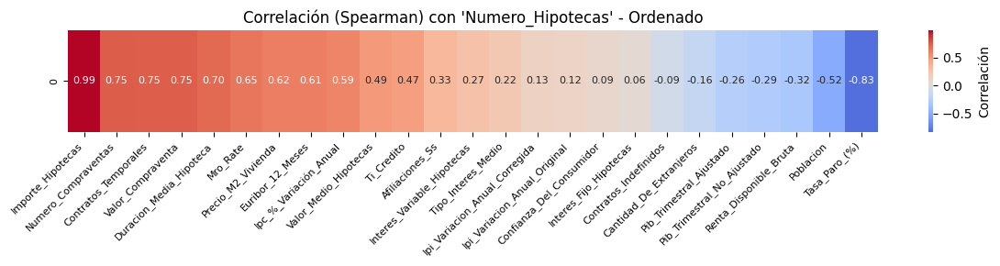

In [36]:
corr_spearman_y_sorted = corr_spearman_y.sort_values(ascending=False)
plt.figure(figsize=(12, 3))
sns.heatmap(corr_spearman_y_sorted.to_frame().T, cmap='coolwarm', center=0,
            annot=True, fmt=".2f", cbar_kws={'label': 'Correlación'},
            annot_kws={"size": 8})
plt.title("Correlación (Spearman) con 'Numero_Hipotecas' - Ordenado", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

## Resultados y Eliminación de variables correlacionadas

Cuando dos o más variables están fuertemente correlacionadas, incluirlas todas en una regresión u otros modelos temporales puede provocar multicolinealidad, lo que puede afectar a la interpretación y a los coefciientes. 


Por tanto, vamos a crear un nuevo Dataframe con las variables seleccionadas tras el análisis de multicolinealidad. No obstante, en el próximo notebook haremos uso de ambos dataframes (antes de la eliminación y después) para comprobar cómo afecta a los modelos y regresiones. 
* **Importe_Hipotecas:** Alta correlación, directa y lógica (0.94 Pearson y 0.99 Spearman). Además, presenta una alta correlación con otras variables explicativas que no son tan predictoras de la variable objetivo.

* **Número_Compraventas**: Presenta una correlación moderada (0.47 Pearson y 0.5 Spearman), pero su relación directa con la variable objetivo y su relación teórica hace que decidamos mantenerla para los modelos.

* **Precio_M2_Vivienda**: Presenta una correlación moderada (0.61 Spearman), pero es un índice estructural del mercado inmobiliario que es útil para la predicción. Lo mantenemos al eliminar variables similares.

* **Valor_Compraventa**: Alta correlación y sentido lógico (0.70 Pearson y 0.74 Spearman); más compraventas implican más necesidad de financiación hipotecaria. 

* **Contratos_Temporales:** Decidimos mantenerla por su alta correlación (0.84 Pearson y 0.74 Spearman), aunque puede ser dudosa su causalidad directa.  

* **Ipc_%_Variacion_Anual**: La correlación no es muy elevada (0.58 Spearman), aunque puede ser útil mantenerla como reflejo del entorno económico general. Tiene una utilidad contextual. 

* **Duracion_Media_Hipoteca:** Buena correlación (0.67 Pearson y 0.70 Spearman); representa la evolución de la financiación. Una mayor duración puede estar ligada a un mayor volumen de hipotecas.  

* **Tasa_Paro_(%):** Correlación fuerte y esperada (-0.77 Pearson y 0.83 Spearman); a mayor paro, menor demanda hipotecaria.  

In [37]:
columnas_seleccionadas = [
    "Fecha",
    "Numero_Hipotecas",
    "Importe_Hipotecas",
    "Numero_Compraventas",
    "Precio_M2_Vivienda",
    "Contratos_Temporales",
    "Ipc_%_Variación_Anual",
    "Duracion_Media_Hipoteca",
    "Tasa_Paro_(%)"
]

df_no_corr = iqr_winsorized_df[columnas_seleccionadas].copy()
df_no_corr.head()

,Fecha,Numero_Hipotecas,Importe_Hipotecas,Numero_Compraventas,Precio_M2_Vivienda,Contratos_Temporales,Ipc_%_Variación_Anual,Duracion_Media_Hipoteca,Tasa_Paro_(%)
0,2003-03-31,263600,23.908609,183908.527902,1230.3,4370.2,3.800000,3.178054,11.99
1,2003-06-30,247071,23.876021,185520.576206,1309.6,4550.9,2.900000,3.178054,11.28
2,2003-09-30,236977,23.900416,187146.754903,1344.9,4652.2,3.000000,3.178054,11.30
3,2003-12-31,241791,23.926874,188787.187852,1380.3,4687.5,2.766667,3.178054,11.37
4,2004-03-31,283170,24.125194,190442.000000,1456.2,4620.7,2.233333,3.218876,11.50


## Descarga de Excels

In [41]:
from openpyxl import load_workbook
from openpyxl.utils import get_column_letter
from openpyxl.styles import numbers
from openpyxl.styles import PatternFill

# Guardar el DataFrame en Excel sin índice
nombre_archivo = "df_no_corr.xlsx"
df_no_corr.to_excel(nombre_archivo, sheet_name="variables", index=False)

# Ajustar el ancho de las columnas con openpyxl
# Cargar el archivo
wb = load_workbook(nombre_archivo)
ws = wb["variables"]

# Ajustar el ancho de cada columna según el contenido más largo
for col_idx, column_cells in enumerate(ws.iter_cols(min_row=1, max_row=1), 1):
    max_length = 0
    for cell in column_cells:
        try:
            max_length = max(max_length, len(str(cell.value)))
        except:
            pass
    adjusted_width = max_length + 2  # Un poco de margen
    ws.column_dimensions[get_column_letter(col_idx)].width = adjusted_width

# Ajustar el ancho de la columna Fecha, al ser la primera es la "A"
ws.column_dimensions["A"].width = 20

# Aplicar formato de fecha corta a la columna A, si no, por defecto, Excel nos pone la fecha larga incluyendo la hora
for cell in ws["A"][1:]:  # Saltamos la cabecera
    cell.number_format = 'dd/mm/yyyy'  # Este formato Excel lo traduce como "Fecha corta"

# Definir los colores 
fill_header = PatternFill(start_color="A9D0F5", end_color="A9D0F5", fill_type="solid")  # Azul claro para encabezado
fill_gray = PatternFill(start_color="D9D9D9", end_color="D9D9D9", fill_type="solid")    # Gris claro
fill_white = PatternFill(start_color="FFFFFF", end_color="FFFFFF", fill_type="solid")

# Aplicar color al encabezado (primera fila)
for cell in ws[1]:
    cell.fill = fill_header

# Aplicar color por bloques de 4 filas
for i, row in enumerate(ws.iter_rows(min_row=2), start=0):  # min_row=2 para saltar encabezado
    fill = fill_gray if (i // 4) % 2 == 0 else fill_white
    for cell in row:
        cell.fill = fill

# Guardar el archivo actualizado
wb.save(nombre_archivo)
print("Archivo df_no_corr.xlsx guardado y formateado correctamente")

Archivo df_no_corr.xlsx guardado y formateado correctamente


In [42]:
# Guardar el DataFrame en Excel sin índice
nombre_archivo = "iqr_winsorized_df.xlsx"
iqr_winsorized_df.to_excel(nombre_archivo, sheet_name="variables", index=False)

# Ajustar el ancho de las columnas con openpyxl
# Cargar el archivo
wb = load_workbook(nombre_archivo)
ws = wb["variables"]

# Ajustar el ancho de cada columna según el contenido más largo
for col_idx, column_cells in enumerate(ws.iter_cols(min_row=1, max_row=1), 1):
    max_length = 0
    for cell in column_cells:
        try:
            max_length = max(max_length, len(str(cell.value)))
        except:
            pass
    adjusted_width = max_length + 2  # Un poco de margen
    ws.column_dimensions[get_column_letter(col_idx)].width = adjusted_width

# Ajustar el ancho de la columna Fecha, al ser la primera es la "A"
ws.column_dimensions["A"].width = 20

# Aplicar formato de fecha corta a la columna A, si no, por defecto, Excel nos pone la fecha larga incluyendo la hora
for cell in ws["A"][1:]:  # Saltamos la cabecera
    cell.number_format = 'dd/mm/yyyy'  # Este formato Excel lo traduce como "Fecha corta"

# Definir los colores 
fill_header = PatternFill(start_color="A9D0F5", end_color="A9D0F5", fill_type="solid")  # Azul claro para encabezado
fill_gray = PatternFill(start_color="D9D9D9", end_color="D9D9D9", fill_type="solid")    # Gris claro
fill_white = PatternFill(start_color="FFFFFF", end_color="FFFFFF", fill_type="solid")

# Aplicar color al encabezado (primera fila)
for cell in ws[1]:
    cell.fill = fill_header

# Aplicar color por bloques de 4 filas
for i, row in enumerate(ws.iter_rows(min_row=2), start=0):  # min_row=2 para saltar encabezado
    fill = fill_gray if (i // 4) % 2 == 0 else fill_white
    for cell in row:
        cell.fill = fill

# Guardar el archivo actualizado
wb.save(nombre_archivo)
print("Archivo iqr_winsorized_df.xlsx guardado y formateado correctamente")

Archivo iqr_winsorized_df.xlsx guardado y formateado correctamente
